# SST metrics

In [7]:
import sys
sys.path.append('../..')
import xarray as xr
import numpy as np
import pyinterp
import netCDF4
from src.ose.mod_inout import *
from src.ose.mod_interp import *
from src.ose.mod_stats import *
from src.ose.mod_spectral import *
from src.ose.mod_plot import *
from src.ose.utils import *
from src.ose.mod_plot import plot_temporal_statistics

logger = logging.getLogger()
logger.setLevel(logging.INFO)

# 1. Interactive results for the OI

In [8]:
def read_l4_dataset(list_of_file, 
                    lon_min=-180., 
                    lon_max=180., 
                    lat_min=-90, 
                    lat_max=90., 
                    sel_time=slice('1900-10-01','2100-01-01'), 
                    byseason=False,
                    is_circle=True,
                    crop=False):
    

    ds = xr.open_dataset(list_of_file)#, concat_dim ='time', combine='nested')
                           #, parallel=True,
                           #chunks={"time":10})
    ds = ds.assign_coords({"season":(('time'),ds.time.dt.season.data)})
    if crop:
        ds.sel(lon=slice(lon_min,lon_max),lat=slice(lat_min,lat_max))
    if not byseason:
        ds = ds.sel(time=sel_time, drop=True)
    else:
        ds = ds.sel(time=(ds.season==(sel_time)))
    ds = ds.where((ds["lon"] >= lon_min) & (ds["lon"] <= lon_max), drop=True)
    ds = ds.where((ds["lat"] >= lat_min) & (ds["lat"] <= lat_max), drop=True)
            
    x_axis = pyinterp.Axis(ds["lon"][:], is_circle=is_circle)
    y_axis = pyinterp.Axis(ds["lat"][:])
    z_axis = pyinterp.TemporalAxis(ds["time"].values)
    
    var = ds['analysed_sst'][:]
    var = var.transpose('lon', 'lat', 'time')

    # The undefined values must be set to nan.
    '''
    try:
        #var[var.mask] = float("nan")
        var = var.where(var.mask,float("nan"))
    except AttributeError:
        pass
    '''
    
    if var.data.shape[-1]!=1:
        grid = pyinterp.Grid3D(x_axis, y_axis, z_axis, var.data)
        return x_axis, y_axis, z_axis, grid
    else:
        grid = pyinterp.Grid2D(x_axis, y_axis, var.data[:,:,0])
        return x_axis, y_axis, grid


def interp_on_alongtrack(gridded_dataset, 
                         ds_alongtrack,
                         lon_min=-180, 
                         lon_max=180., 
                         lat_min=-90, 
                         lat_max=90., 
                         sel_time=slice('1900-10-01','2100-01-01'),
                         byseason=False,
                         is_circle=True,
                         crop=False):
    # Interpolate maps onto alongtrack dataset
    grid_info = read_l4_dataset(gridded_dataset,
                                                       lon_min=lon_min,
                                                       lon_max=lon_max, 
                                                       lat_min=lat_min,
                                                       lat_max=lat_max, 
                                                       sel_time=sel_time,
                                                       byseason=byseason,
                                                       is_circle=is_circle,
                                                       crop=crop)
    if len(grid_info)==4:
        x_axis, y_axis, z_axis, grid = grid_info
    else:
        x_axis, y_axis, grid = grid_info
    ds_alongtrack = ds_alongtrack.assign_coords({"season":(('time'),ds_alongtrack.time.dt.season.data)})
    if not byseason:
        ds_alongtrack = ds_alongtrack.sel(time=sel_time, drop=True)
    else:
        ds_alongtrack = ds_alongtrack.sel(time=(ds_alongtrack.season==(sel_time))) 
    if len(grid_info)==4:
        sst_map_interp = pyinterp.trivariate(grid, 
                                         ds_alongtrack["longitude"].values, 
                                         ds_alongtrack["latitude"].values,
                                         z_axis.safe_cast(ds_alongtrack.time.values),
                                         bounds_error=False).reshape(ds_alongtrack["longitude"].values.shape)
    else:
        sst_map_interp = pyinterp.bivariate(grid, 
                                         ds_alongtrack["longitude"].values, 
                                         ds_alongtrack["latitude"].values,
                                         bounds_error=False).reshape(ds_alongtrack["longitude"].values.shape)

    
    sst_alongtrack = ds_alongtrack["sstobs"].values
    lon_alongtrack = ds_alongtrack["longitude"].values
    lat_alongtrack = ds_alongtrack["latitude"].values
    time_alongtrack = ds_alongtrack["time"].values
    
    # get and apply mask from map_interp & alongtrack on each dataset
    msk1 = np.ma.masked_invalid(sst_alongtrack).mask
    msk2 = np.ma.masked_invalid(sst_map_interp).mask
    msk = msk1 + msk2
    sst_alongtrack = np.ma.masked_where(msk, sst_alongtrack).compressed()
    lon_alongtrack = np.ma.masked_where(msk, lon_alongtrack).compressed()
    lat_alongtrack = np.ma.masked_where(msk, lat_alongtrack).compressed()
    time_alongtrack = np.ma.masked_where(msk, time_alongtrack).compressed()
    sst_map_interp = np.ma.masked_where(msk, sst_map_interp).compressed()
            
    # select inside value (this is done to insure similar number of point in statistical comparison between methods)
    indices = np.where((lon_alongtrack >= lon_min+0.25) & (lon_alongtrack <= lon_max-0.25) &
                       (lat_alongtrack >= lat_min+0.25) & (lat_alongtrack <= lat_max-0.25))[0]
    
    return time_alongtrack[indices], lat_alongtrack[indices], lon_alongtrack[indices], sst_alongtrack[indices], sst_map_interp[indices]
    

In [9]:
def compute_stats(time_alongtrack, 
                  lat_alongtrack, 
                  lon_alongtrack, 
                  ssh_alongtrack, 
                  ssh_map_interp, 
                  bin_lon_step,
                  bin_lat_step, 
                  bin_time_step,
                  output_filename,
                  output_filename_timeseries):

    ncfile = netCDF4.Dataset(output_filename,'w')

    binning = pyinterp.Binning2D(
        pyinterp.Axis(np.arange(-180, 180, bin_lon_step), is_circle=True),
        pyinterp.Axis(np.arange(-90, 90 + bin_lat_step, bin_lat_step)))

    # binning alongtrack
    binning.push(lon_alongtrack, lat_alongtrack, ssh_alongtrack, simple=True)
    write_stat(ncfile, 'alongtrack', binning)
    binning.clear()

    # binning map interp
    binning.push(lon_alongtrack, lat_alongtrack, ssh_map_interp, simple=True)
    write_stat(ncfile, 'maps', binning)
    binning.clear()

    # binning diff sla-msla
    binning.push(lon_alongtrack, lat_alongtrack, ssh_alongtrack - ssh_map_interp, simple=True)
    write_stat(ncfile, 'diff', binning)
    binning.clear()

    # add rmse
    diff2 = (ssh_alongtrack - ssh_map_interp)**2
    binning.push(lon_alongtrack, lat_alongtrack, diff2, simple=True)
    var = ncfile.groups['diff'].createVariable('rmse', binning.variable('mean').dtype, ('lat','lon'), zlib=True)
    var[:, :] = np.sqrt(binning.variable('mean')).T  
    var2 = ncfile.groups['diff'].createVariable('variance_rmse', binning.variable('variance').dtype, ('lat','lon'), zlib=True)
    var2[:, :] = np.sqrt(binning.variable('variance')).T  
    
    ncfile.close()
    
    logging.info(f'  Results saved in: {output_filename}')

    # write time series statistics
    leaderboard_nrmse, leaderboard_nrmse_std = write_timeserie_stat(ssh_alongtrack, 
                                                                    ssh_map_interp, 
                                                                    time_alongtrack, 
                                                                    bin_time_step, 
                                                                    output_filename_timeseries)
    
    return leaderboard_nrmse, leaderboard_nrmse_std

In [10]:
def compute_segment_alongtrack(time_alongtrack, 
                               lat_alongtrack, 
                               lon_alongtrack, 
                               ssh_alongtrack, 
                               ssh_map_interp, 
                               lenght_scale,
                               delta_x,
                               delta_t,
                               convert_lon=True,
                               max_delta_t_gap = 4 * np.timedelta64(1, 's')):
    
    # max delta t of 4 seconds to cut tracks
    
    if convert_lon:
        lon_alongtrack = np.mod(lon_alongtrack,360)

    segment_overlapping = 0.25
    max_delta_t_gap = max_delta_t_gap

    list_lat_segment = []
    list_lon_segment = []
    list_ssh_alongtrack_segment = []
    list_ssh_map_interp_segment = []

    # Get number of point to consider for resolution = lenghtscale in km
    delta_t_jd = delta_t / (3600 * 24)
    npt = int(lenght_scale / delta_x)
    
    # cut track when diff time longer than 4*delta_t
    indi = np.where((np.diff(time_alongtrack) >= max_delta_t_gap))[0]
    track_segment_lenght = np.insert(np.diff(indi), [0], indi[0])
    
    # Long track >= npt
    selected_track_segment = np.where(track_segment_lenght >= npt)[0]

    if selected_track_segment.size > 0:

        for track in selected_track_segment:

            if track-1 >= 0:
                index_start_selected_track = indi[track-1]
                index_end_selected_track = indi[track]
            else:
                index_start_selected_track = 0
                index_end_selected_track = indi[track]

            start_point = index_start_selected_track
            end_point = index_end_selected_track

            for sub_segment_point in range(start_point, end_point - npt, int(npt*segment_overlapping)):

                # Near Greenwhich case
                if ((lon_alongtrack[sub_segment_point + npt - 1] < 50.)
                    and (lon_alongtrack[sub_segment_point] > 320.)) \
                        or ((lon_alongtrack[sub_segment_point + npt - 1] > 320.)
                            and (lon_alongtrack[sub_segment_point] < 50.)):

                    tmp_lon = np.where(lon_alongtrack[sub_segment_point:sub_segment_point + npt] > 180,
                                       lon_alongtrack[sub_segment_point:sub_segment_point + npt] - 360,
                                       lon_alongtrack[sub_segment_point:sub_segment_point + npt])
                    mean_lon_sub_segment = np.median(tmp_lon)

                    if mean_lon_sub_segment < 0:
                        mean_lon_sub_segment = mean_lon_sub_segment + 360.
                else:

                    mean_lon_sub_segment = np.median(lon_alongtrack[sub_segment_point:sub_segment_point + npt])

                mean_lat_sub_segment = np.median(lat_alongtrack[sub_segment_point:sub_segment_point + npt])

                ssh_alongtrack_segment = np.ma.masked_invalid(ssh_alongtrack[sub_segment_point:sub_segment_point + npt])

                ssh_map_interp_segment = []
                ssh_map_interp_segment = np.ma.masked_invalid(ssh_map_interp[sub_segment_point:sub_segment_point + npt])
                if np.ma.is_masked(ssh_map_interp_segment):
                    ssh_alongtrack_segment = np.ma.compressed(np.ma.masked_where(np.ma.is_masked(ssh_map_interp_segment), ssh_alongtrack_segment))
                    ssh_map_interp_segment = np.ma.compressed(ssh_map_interp_segment)

                if ssh_alongtrack_segment.size > 0:
                    list_ssh_alongtrack_segment.append(ssh_alongtrack_segment)
                    list_lon_segment.append(mean_lon_sub_segment)
                    list_lat_segment.append(mean_lat_sub_segment)
                    list_ssh_map_interp_segment.append(ssh_map_interp_segment)


    return list_lon_segment, list_lat_segment, list_ssh_alongtrack_segment, list_ssh_map_interp_segment, npt 



In [11]:
def plot_psd_score(filename):
    
    ds = xr.open_dataset(filename)
    
    resolved_scale = find_wavelength_05_crossing(filename)
    
    plt.figure(figsize=(10, 5))
    ax = plt.subplot(121)
    ax.invert_xaxis()
    plt.plot((1./ds.wavenumber), ds.psd_ref, label='reference', color='k')
    plt.plot((1./ds.wavenumber), ds.psd_study, label='reconstruction', color='lime')
    plt.xlabel('wavelength [km]')
    plt.ylabel('Power Spectral Density [m$^{2}$/cy/km]')
    plt.xscale('log')
    plt.yscale('log')
    plt.legend(loc='best')
    plt.grid(which='both')
    
    ax = plt.subplot(122)
    ax.invert_xaxis()
    plt.plot((1./ds.wavenumber), (1. - ds.psd_diff/ds.psd_ref), color='k', lw=2)
    plt.xlabel('wavelength [km]')
    plt.ylabel('PSD Score [1. - PSD$_{err}$/PSD$_{ref}$]')
    plt.xscale('log')
    plt.hlines(y=0.5, 
              xmin=np.ma.min(np.ma.masked_invalid(1./ds.wavenumber)), 
              xmax=np.ma.max(np.ma.masked_invalid(1./ds.wavenumber)),
              color='r',
              lw=0.5,
              ls='--')
    '''
    plt.vlines(x=resolved_scale, ymin=0, ymax=1, lw=0.5, color='g')
    ax.fill_betweenx((1. - ds.psd_diff/ds.psd_ref), 
                     resolved_scale, 
                     np.ma.max(np.ma.masked_invalid(1./ds.wavenumber)),
                     color='green',
                     alpha=0.3, 
                     label=f'resolved scales \n $\lambda$ > {int(resolved_scale)}km')
    '''
    plt.legend(loc='best')
    plt.grid(which='both')
    
    logging.info(' ')
    logging.info(f'  Minimum spatial scale resolved = {int(resolved_scale)}km')
    
    plt.show()
    
    return resolved_scale

In [ ]:
file_obs='/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1.nc'
file_oi='/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc'

obs = xr.open_dataset(file_obs).sea_surface_temperature
oi = xr.open_dataset(file_oi).analysed_sst

import CRPS.CRPS as pscore
idx = np.where(~np.isnan(oi.values))
flatten_ose = np.concatenate((obs.data[idx[0],idx[1],idx[2]][None,:],
                              np.stack([oi.data[idx[0],idx[1],idx[2]] for i in range(10)])
                             ))

toto3


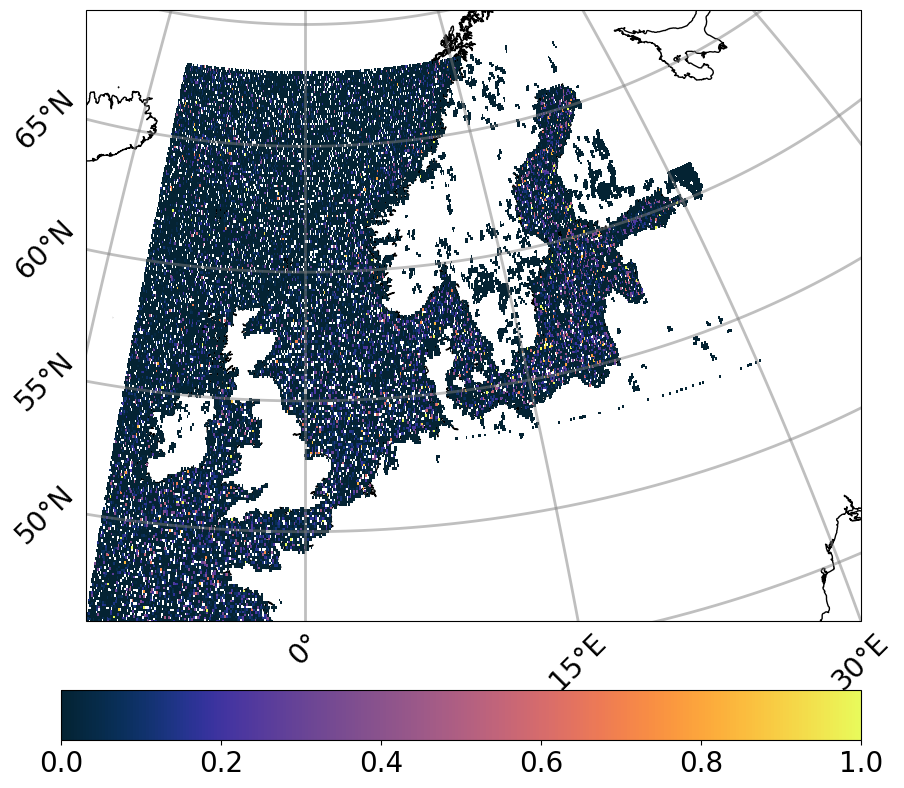

In [49]:
import matplotlib.ticker as mticker
import cmocean as cmo
from cartopy.mpl.ticker import (LongitudeFormatter, LatitudeFormatter,
                                LatitudeLocator)
import random
N = flatten_ose.shape[1]
sel = random.sample(range(0,N),100000) 
cprs_ose = np.asarray([pscore(vec[1:],vec[0]).compute()[0] for vec in (flatten_ose.T)[sel] ])
xmin = np.min(obs.lon.values)
xmax = np.max(obs.lon.values)
ymin = np.min(obs.lat.values)
ymax = np.max(obs.lat.values)
bin_lon_step = .1
bin_lat_step = .1
lon_bin =  np.arange(xmin, xmax + bin_lon_step,
                    bin_lon_step)
lat_bin = np.arange(ymin, ymax + bin_lat_step,
                    bin_lat_step)
binning = pyinterp.Binning2D(
            pyinterp.Axis(lon_bin, is_circle=True),
            pyinterp.Axis(lat_bin))

meshgrid_original = np.meshgrid(obs.lon.values,obs.lat.values)
N = len(obs.time.values)
grid_lon, grid_lat = np.stack([meshgrid_original[0]]*N), np.stack([meshgrid_original[1]]*N)                                  
binning.push(grid_lon[idx[0],idx[1],idx[2]].flatten()[sel],
             grid_lat[idx[0],idx[1],idx[2]].flatten()[sel],
             cprs_ose, True)
ds_bin = xr.Dataset(
           data_vars=dict(
                     crps_avg=(["lat", "lon"], binning.variable('mean').T),
                     crps_std=(["lat", "lon"], np.sqrt(binning.variable('variance')).T),
                     ),
           coords=dict(
              lon=(["lon"], lon_bin),
              lat=(["lat"], lat_bin),
              ),
          )

def config_ticks(ax,crs=ccrs.PlateCarree()):
    ax.add_feature(cfeature.LAND.with_scale('10m'), edgecolor='k', facecolor='white')
    gl = ax.gridlines(crs=crs, draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='-')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlines = True
   
    gl.ylocator = LatitudeLocator()
    gl.xformatter = LongitudeFormatter()
    gl.yformatter = LatitudeFormatter()
   
    gl.xlocator = mticker.MaxNLocator(6)
    gl.ylocator = mticker.MaxNLocator(6)
   
    gl.xlabel_style = {'size': 20, 'color': 'k', 'rotation':45}
    gl.ylabel_style = {'size': 20, 'color': 'k', 'rotation':45}
    
def plot_crps(resfile, ds, lon, lat,  
              var, 
              figsize,
              nr=1,nc=1,
              crs=ccrs.Orthographic(0,45),
              vmin=0,vmax=1):
    
    crs._threshold /= 100.

    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(nr, nc)
    gs.update(wspace=0.05,hspace=0.05)
    ax = fig.add_subplot(gs[0,0], projection=crs, transform=ccrs.PlateCarree())
    cmap = cmo.cm.thermal
    norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
    extent = [np.min(lon),np.max(lon),np.min(lat),np.max(lat)]
    plot(ax,lon,lat,ds_bin[var].values,'',extent=extent,cmap=cmap,
             norm=norm,colorbar=False,fmt=False)  
    config_ticks(ax)
    gs.update(wspace=0.5,hspace=0.05)
    cbar_ax = fig.add_axes([0.1, 0.07, 0.8, 0.05])
    cbar_ax.tick_params(labelsize=20)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm._A = []
    cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal', pad=3)
    cbar.ax.set_title("",fontsize=22,y=-1.5)
    plt.savefig(resfile,bbox_inches='tight')
    fig = plt.gcf()
    plt.close()                       
    return fig

plot_crps("/DATASET/mbeauchamp/DMI/postpro/CRPS_avg_OI.png",
          ds_bin, ds_bin.lon, ds_bin.lat, "crps_avg",
          figsize=(10,10))

# 2. Perform the intercomparison between OI and 4DVarNet

## 2.1 New set of functions for intercomparison

In [ ]:
#test

In [50]:
file="/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext.nc"
data = xr.open_dataset(file)
lon = data.lon.values
lat = data.lat.values
lon_min = np.min(lon)-.001
lon_max = np.max(lon)+.001
lat_min = np.min(lat)-.001
lat_max = np.max(lat)+.001
time_min = '2021-01-15'
time_max = '2021-12-31'
sel_time = slice(time_min, time_max)

# prepare L3 datasets
data = xr.open_dataset(file_obs,chunks={"time":10})
data = data.sel(lon=slice(lon_min,lon_max),
                    lat=slice(lat_min,lat_max))
time = xr.DataArray(data.time.values, dims=("time")).expand_dims(dim={"lat": data.lat.values}, axis=1).expand_dims(dim={"lon": data.lon.values}, axis=2)
lat = xr.DataArray(data.lat.values, dims=("lat")).expand_dims(dim={"time": data.time.values}, axis=0).expand_dims(dim={"lon": data.lon.values}, axis=2)
lon = xr.DataArray(data.lon.values, dims=("lon")).expand_dims(dim={"lat": data.lat.values}, axis=0).expand_dims(dim={"time": data.time.values}, axis=0)

# flatten 
idxs = np.argwhere(np.isfinite(data.sea_surface_temperature.values))
new_time = time.values[idxs[:,0],idxs[:,1],idxs[:,2]]
new_lat = lat.values[idxs[:,0],idxs[:,1],idxs[:,2]]
new_lon = lon.values[idxs[:,0],idxs[:,1],idxs[:,2]]
new_sstobs = data.sea_surface_temperature.values[idxs[:,0],idxs[:,1],idxs[:,2]]
data_l3 = xr.Dataset(data_vars={'sstobs':(('time'),new_sstobs)},
                      coords={'time':('time',new_time),
                              'latitude':('time',new_lat),
                              'longitude':('time',new_lon)})
    
res = interp_on_alongtrack(file,
                            data_l3,
                            lon_min=lon_min,
                            lon_max=lon_max,
                            lat_min=lat_min,
                            lat_max=lat_max,
                            sel_time=sel_time,
                            byseason=False,
                            is_circle=True,
                            crop=False)  

time_alongtrack, lat_alongtrack, lon_alongtrack, sst_alongtrack, sst_interp = res 
    
    

bin_lon_step = .1
bin_lat_step = .1 
bin_time_step = 1


    
    

NameError: name 'ssh_alongtrack' is not defined

In [54]:
binning = pyinterp.Binning2D(
        pyinterp.Axis(np.arange(-180, 180, bin_lon_step), is_circle=True),
        pyinterp.Axis(np.arange(-90, 90 + bin_lat_step, bin_lat_step)))

# binning alongtrack
binning.push(lon_alongtrack, lat_alongtrack, sst_alongtrack, simple=True)
binning.clear()
# binning map interp
binning.push(lon_alongtrack, lat_alongtrack, sst_interp, simple=True)
binning.clear()
# binning diff sla-msla
binning.push(lon_alongtrack, lat_alongtrack, sst_alongtrack - sst_interp, simple=True)
binning.clear()
# add rmse
diff2 = (sst_alongtrack - sst_interp)**2
binning.push(lon_alongtrack, lat_alongtrack, diff2, simple=True)

binning

np.sqrt(binning.variable('variance')).T 

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [26]:
def run_comparison(file,method, crop=False, byseason=False,compute_spectrum=True,
                   file_obs='/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1.nc'):
         
    # prepare L3 datasets
    data = xr.open_dataset(file_obs,chunks={"time":10})
    data = data.sel(lon=slice(lon_min,lon_max),
                    lat=slice(lat_min,lat_max))
    time = xr.DataArray(data.time.values, dims=("time")).expand_dims(dim={"lat": data.lat.values}, axis=1).expand_dims(dim={"lon": data.lon.values}, axis=2)
    lat = xr.DataArray(data.lat.values, dims=("lat")).expand_dims(dim={"time": data.time.values}, axis=0).expand_dims(dim={"lon": data.lon.values}, axis=2)
    lon = xr.DataArray(data.lon.values, dims=("lon")).expand_dims(dim={"lat": data.lat.values}, axis=0).expand_dims(dim={"time": data.time.values}, axis=0)

    # flatten 
    idxs = np.argwhere(np.isfinite(data.sea_surface_temperature.values))
    new_time = time.values[idxs[:,0],idxs[:,1],idxs[:,2]]
    new_lat = lat.values[idxs[:,0],idxs[:,1],idxs[:,2]]
    new_lon = lon.values[idxs[:,0],idxs[:,1],idxs[:,2]]
    new_sstobs = data.sea_surface_temperature.values[idxs[:,0],idxs[:,1],idxs[:,2]]
    data_l3 = xr.Dataset(data_vars={'sstobs':(('time'),new_sstobs)},
                      coords={'time':('time',new_time),
                              'latitude':('time',new_lat),
                              'longitude':('time',new_lon)})

    # interpolation l4 to l3       
    res = interp_on_alongtrack(file,
                              data_l3,
                              lon_min=lon_min,
                              lon_max=lon_max,
                              lat_min=lat_min,
                              lat_max=lat_max,
                              sel_time=sel_time,
                              byseason=byseason,
                              is_circle=True,
                              crop=crop)
    time_alongtrack, lat_alongtrack, lon_alongtrack, sst_alongtrack, sst_interp = res    
    
    fn_rmse = '/DATASET/mbeauchamp/DMI/postpro/spa_stat_'+method+'.nc'
    fn_ts = '/DATASET/mbeauchamp/DMI/postpro/TS_'+method+'.nc'
    fn_spectrum =  '/DATASET/mbeauchamp/DMI/postpro/spectrum_'+method+'.nc'

    leaderboard_nrmse, leaderboard_nrmse_std = compute_stats(time_alongtrack, 
                                                         lat_alongtrack, 
                                                         lon_alongtrack, 
                                                         sst_alongtrack, 
                                                         sst_interp, 
                                                         bin_lon_step,
                                                         bin_lat_step, 
                                                         bin_time_step,
                                                         output_filename=fn_rmse,
                                                         output_filename_timeseries=fn_ts) 
    
    if compute_spectrum:
        compute_spectral_scores(time_alongtrack, 
                        lat_alongtrack, 
                        lon_alongtrack, 
                        sst_alongtrack, 
                        sst_interp, 
                        lenght_scale,
                        delta_x,
                        delta_t,
                        fn_spectrum)
        leaderboard_psds_score = plot_psd_score(fn_spectrum) 
    else:
        leaderboard_psds_score = -999
        
        
    return leaderboard_nrmse, leaderboard_nrmse_std, int(leaderboard_psds_score)   

### 2.1.1 Non-interactive plots

### 2.1.2 Interactive plots

In [27]:
import matplotlib.ticker as mticker
from cartopy.mpl.ticker import (LongitudeFormatter, LatitudeFormatter,
                                LatitudeLocator)

def config_ticks(ax,crs=ccrs.PlateCarree()):
    ax.add_feature(cfeature.LAND.with_scale('10m'), edgecolor='k', facecolor='white')
    gl = ax.gridlines(crs=crs, draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='-')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlines = True
   
    gl.ylocator = LatitudeLocator()
    gl.xformatter = LongitudeFormatter()
    gl.yformatter = LatitudeFormatter()
   
    gl.xlocator = mticker.MaxNLocator(6)
    gl.ylocator = mticker.MaxNLocator(6)
   
    gl.xlabel_style = {'size': 20, 'color': 'k', 'rotation':45}
    gl.ylabel_style = {'size': 20, 'color': 'k', 'rotation':45}
    
def itrcp_spa(resfile, ds, lon, lat, methods, figsize,
              crs=ccrs.Orthographic(0,45)):
    mesh_lat, mesh_lon = np.meshgrid(lat, lon)
    mesh_lat = mesh_lat.T
    mesh_lon = mesh_lon.T
    
    crs._threshold /= 100.

    extent = [np.min(lon),np.max(lon),np.min(lat),np.max(lat)]

    fig = plt.figure(figsize=figsize)
    nr = int(np.ceil(len(ds)/2))
    nc = int(np.min((2,len(ds))))   
    gs = gridspec.GridSpec(nr, nc)
    gs.update(wspace=0.05,hspace=0.05)

    vmax = max([ds[i].max() for i in range(len(ds)) ])
    vmin = 0.
    cmap_rmse = plt.cm.viridis
    norm_rmse = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
    for i in range(len(ds)):
        ir = int(np.floor(i/2.))
        ic = np.mod(i,2)
        ax = fig.add_subplot(gs[ir,ic], projection=crs, transform=ccrs.PlateCarree())
        plot(ax,lon,lat,ds[i].values,'',extent=extent,cmap=cmap_rmse,
             norm=norm_rmse,colorbar=False, fmt=False)
        config_ticks(ax)
        ax.set_title(methods[i],fontsize=25)
    # Colorbar
    cbar_ax = fig.add_axes([0.1, 0.05, 0.8, 0.02])
    cbar_ax.tick_params(labelsize=20)
    sm = plt.cm.ScalarMappable(cmap=cmap_rmse, norm=norm_rmse)
    sm._A = []
    cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal', pad=3.0)
    cbar.ax.set_title("[K]",fontsize=22,y=-2)

    plt.savefig(resfile,bbox_inches='tight')
    fig = plt.gcf()
    plt.close()                       
    return fig

def itrcp_spa_diff(resfile, ds_baseline, ds, lon, lat,  
                   methods, 
                   figsize,
                   nr=1,nc=1,
                   crs=ccrs.Orthographic(0,45),
                   vmin=-2,vmax=2):
    
    crs._threshold /= 100.

    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(nr, nc)
    gs.update(wspace=0.05,hspace=0.05)

    if not isinstance(ds_baseline,list):
        delta_rmse = [100*(ds[i] - ds_baseline)/ds_baseline for i in range(len(ds))]
    else:
        delta_rmse = [100*(ds[i] - ds_baseline[i])/ds_baseline[i] for i in range(len(ds))]
    cmap_rmse = plt.cm.seismic
    norm_rmse = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
    for i in range(len(ds)):
        ir = int(np.floor(i/nc))
        ic = np.mod(i,nc)
        print(ir,ic)
        ax = fig.add_subplot(gs[ir,ic], projection=crs, transform=ccrs.PlateCarree())
        if not isinstance(lon,list):
            mesh_lat, mesh_lon = np.meshgrid(lat, lon)
            mesh_lat = mesh_lat.T
            mesh_lon = mesh_lon.T
            extent = [np.min(lon),np.max(lon),np.min(lat),np.max(lat)]
            plot(ax,lon,lat,delta_rmse[i].values,'',extent=extent,cmap=cmap_rmse,
             norm=norm_rmse,colorbar=False,fmt=False)  
        else:
            mesh_lat, mesh_lon = np.meshgrid(lat[i], lon[i])
            mesh_lat = mesh_lat.T
            mesh_lon = mesh_lon.T
            extent = [np.min(lon[i]),np.max(lon[i]),np.min(lat[i]),np.max(lat[i])]
            plot(ax,lon[i],lat[i],delta_rmse[i].values,'',extent=extent,cmap=cmap_rmse,
             norm=norm_rmse,colorbar=False,fmt=False)  
        config_ticks(ax)
        ax.set_title(methods[i],fontsize=25)    
    #plt.subplots_adjust(hspace=0.3)
    # Colorbar
    if nc==1:
        gs.update(wspace=0.5,hspace=0.05)
        cbar_ax = fig.add_axes([0.1, 0.07, 0.8, 0.05])
    if nc==3:
        gs.update(wspace=0.5,hspace=0.05)
        cbar_ax = fig.add_axes([0.1, 0.1, 0.8, 0.05])
    if nc==2:
        gs.update(wspace=0.5,hspace=0.5)
        cbar_ax = fig.add_axes([0.1, -0.02, 0.8, 0.05])
    cbar_ax.tick_params(labelsize=20)
    sm = plt.cm.ScalarMappable(cmap=cmap_rmse, norm=norm_rmse)
    sm._A = []
    cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal', pad=3.0)
    if nc==1:
        cbar.ax.set_title("[%]",fontsize=22,y=-1.5)
    else:
        cbar.ax.set_title("[%]",fontsize=22,y=-2)
        
    plt.savefig(resfile,bbox_inches='tight')
    fig = plt.gcf()
    plt.close()                       
    return fig

def itrcp_ts(resfile, filenames, methods, colors):
    from pathlib import Path
    ds1 = [xr.open_dataset(file, group='diff') for file in filenames]
    ds2 = [xr.open_dataset(file, group='alongtrack') for file in filenames]
    #rmse_score = [ 1. - ds1[i]['rms']/ds2[i]['rms'] for i in range(len(filenames)) ]
    rmse_score = [ ds1[i]['rms'] for i in range(len(filenames)) ]
    rmse_score = [ rmse_score[i].dropna(dim='time').where(ds1[i]['count'] > 10, drop=True) for i in range(len(filenames)) ]
 
    rmse_score=xr.merge([rmse_score[i].to_dataset().rename({"rms":"rms_"+methods[i]}) for i in range(len(filenames)) ])
    plot1 = rmse_score.hvplot.line(x='time',y=['rms_'+methods[i] for  i in range(len(filenames)) ],ylabel='RMSE SCORE', shared_axes=True, color=colors[:len(filenames)])
    plot1.opts(legend_position='top',legend_cols=3)
    plot2 = ds1[0]['count'].dropna(dim='time').hvplot.step(ylabel='#Obs.', shared_axes=True, color='grey')
    figure = (plot1+plot2).cols(1)
    #hvplot.save(figure,resfile).unlink(missing_ok=True)
    return figure
   
def itrcp_spectrum(resfile, filenames, methods,
                               colors,
                               linestyle,
                               marker,
                               markerfacecolor,
                               markeredgecolor
              ):
   
    ds = [xr.open_dataset(file) for file in filenames]
    resolved_scales = [find_wavelength_05_crossing(file) for file in filenames]
       
    fig, (ax1, ax2) = plt.subplots(2,1,figsize=(15, 15))
   
    ax1.invert_xaxis()
    ax1.plot((1./ds[0].wavenumber), ds[0].psd_ref, label='reference', color='k')
    for i in range(len(filenames)):
        ax1.plot((1./ds[i].wavenumber), ds[i].psd_study, label='reconstruction_'+methods[i], 
                 color=colors[i],
                 linestyle=linestyle[i],
                 linewidth=2,
                 marker=marker[i],
                 markersize=8,
                 markerfacecolor=markerfacecolor[i],
                 markeredgecolor=markeredgecolor[i],
                 markeredgewidth=2,
                 markevery=4)
    ax1.set_xlabel('wavelength [km]',fontsize=18)
    ax1.set_ylabel('Power Spectral Density [m$^{2}$/cy/km]',fontsize=18)
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.grid(which="both",axis='y')
    ax1.grid(which="minor",axis='x',markevery=10)
    ax1.tick_params(axis='both', which='major', labelsize=14)

    ax2.invert_xaxis()   
    for i in range(len(filenames)):
        ax2.plot((1./ds[i].wavenumber), (1. - ds[i].psd_diff/ds[i].psd_ref), 
                 color=colors[i],
                 linestyle=linestyle[i],
                 linewidth=2,
                 marker=marker[i],
                 markersize=8,
                 markerfacecolor=markerfacecolor[i],
                 markeredgecolor=markeredgecolor[i],
                 markeredgewidth=2,
                 markevery=4)
    ax2.set_xlabel('wavelength [km]',fontsize=18)
    ax2.set_ylabel('PSD Score [1. - PSD$_{err}$/PSD$_{ref}$]',fontsize=18)
    ax2.set_xscale('log')
    ax2.hlines(y=0.5,
              xmin=np.ma.min(np.ma.masked_invalid(1./ds[0].wavenumber)),
              xmax=np.ma.max(np.ma.masked_invalid(1./ds[0].wavenumber)),
              color='r',
              lw=0.5,
              ls='--')
    imax = np.argmin(resolved_scales)
    ax2.vlines(x=resolved_scales[i], ymin=0, ymax=1, lw=0.5, color=colors[imax])
    ax2.fill_betweenx((1. - ds[imax].psd_diff/ds[imax].psd_ref),
                     resolved_scales[imax],
                     np.ma.max(np.ma.masked_invalid(1./ds[imax].wavenumber)),
                     color=colors[imax],
                     alpha=0.3,
                     label=f'Best resolved scales \n $\lambda$ > {int(resolved_scales[imax])}km')
    ax2.legend(loc='best')
    ax2.grid(which='both')
    ax2.tick_params(axis='both', which='major', labelsize=14)

    handles, labels = ax1.get_legend_handles_labels()
    fig.legend(handles, labels,  loc='upper left',fontsize=16,frameon=False,
               bbox_to_anchor=(0.1,0.85,0.8,0.2),ncol=2,mode="expand")  
   
    logging.info(' ')
    logging.info(f'  Minimum spatial scale resolved = {int(resolved_scales[imax])}km')
   
    plt.savefig(resfile,bbox_inches="tight")
   
    return None#,resolved_scales

In [8]:
def intercomparison_temporal_statistics(list_of_filename, list_of_label):
   
    ds_diff = xr.concat([xr.open_dataset(filename, group='diff') for filename in list_of_filename], dim='experiment')
    ds_diff['experiment'] = list_of_label
    ds_alongtrack = xr.concat([xr.open_dataset(filename, group='alongtrack') for filename in list_of_filename], dim='experiment')
    ds_alongtrack['experiment'] = list_of_label
   
    rmse_score = 1. - ds_diff['rms']/ds_alongtrack['rms']
    
    rmse_score = rmse_score.dropna(dim='time').where(ds_diff['count'] > 10, drop=True)
   
    figure = rmse_score.hvplot.line(x='time', y='rms', by='experiment', ylim=(0, 1), title='RMSE SCORE', shared_axes=True) + ds_diff['count'][0, :].dropna(dim='time').hvplot.step(ylabel='#Obs.', shared_axes=True, color='grey')
   
    return figure.cols(1)

import cartopy
import cartopy.crs as ccrs

def intercomparison_spatial_statistics(baseline_filename, list_of_filename, list_of_label,var='rmse'):
     
    ds_baseline = xr.open_dataset(baseline_filename, group='diff')
    ds = xr.concat([xr.open_dataset(filename, group='diff') for filename in list_of_filename], dim='experiment')
    ds['experiment'] = list_of_label
   
    if var=='rmse':
        score = 100*(ds - ds_baseline)/ds_baseline
        clim_=(-20, 20)
    else:
        score = ds
        clim_=(0, 1000)
        
    score = score.assign_coords(lon=np.mod(score.lon -180.0,360.0)-180.0)
    score = score.sortby(score.lon)
        
    figure = score[var].hvplot.image(x='lon', y='lat', z=var, clim=clim_, by='experiment',
                                             subplots=True, clabel='[%]', cmap='seismic')
                                             #projection=ccrs.PlateCarree(), coastline=True)
   
    return figure.cols(2)

### 2.1.3 Filter maps

In [ ]:
from py_eddy_tracker import data
from py_eddy_tracker.dataset.grid import RegularGridDataset
from py_eddy_tracker.observations.observation import EddiesObservations
import xarray as xr
import numpy as np
import cmocean as cmo

data = xr.open_dataset("/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext.nc")
lon = data.lon.values
lat = data.lat.values
lon_min = np.min(lon)-.001
lon_max = np.max(lon)+.001
lat_min = np.min(lat)-.001
lat_max = np.max(lat)+.001
mask_land = np.isfinite(xr.open_dataset('/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc').analysed_sst[0])

i = 30
data = np.ma.array(data.analysed_sst[i].T,
                mask=np.isnan(data.analysed_sst[i].data).T)
obs_s0 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0.nc")
obs_s0 = np.ma.array(obs_s0.sea_surface_temperature[i].T,
                mask=np.isnan(obs_s0.sea_surface_temperature[i].data).T)
obs_s1 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1.nc")
obs_s1 = np.ma.array(obs_s1.sea_surface_temperature[i].T,
                mask=np.isnan(obs_s1.sea_surface_temperature[i].data).T)
g = RegularGridDataset.with_array(
             coordinates=('lon', 'lat'),
            datas=dict(
                  lon=lon,
                  lat=lat,
                  pred=data,
                  obs_s0=obs_s0,
                  obs_s1=obs_s1),
            variables_description={'pred':{'units':'K'}})
g.copy("pred", "pred_low")
g.copy("pred", "pred_high")
#g.bessel_low_filter("pred_low", wave_length=100, order=3)
g.bessel_high_filter("pred_high", wave_length=50, order=3)
g.bessel_high_filter("obs_s0", wave_length=50, order=3)
g.bessel_high_filter("obs_s1", wave_length=50, order=3)

nc = xr.Dataset(data_vars={"sst_high":(('lat','lon'),g.grid("pred_high").data.T),
                           "obs_s0":(('lat','lon'),g.grid("obs_s0").data.T),
                           "obs_s1":(('lat','lon'),g.grid("obs_s1").data.T)},
                    coords={'lon':lon,
                          'lat':lat})
nc.coords['mask'] = (('lat', 'lon'), mask_land.sel(lon=slice(lon_min,lon_max),
                                                   lat=slice(lat_min,lat_max)).values)
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
nc.sst_high.plot(vmin=-2,vmax=2,ax=ax1)
nc.obs_s0.plot(vmin=-2,vmax=2,ax=ax2)
nc.obs_s1.plot(vmin=-2,vmax=2,ax=ax3)

In [ ]:
from py_eddy_tracker import data
from py_eddy_tracker.dataset.grid import RegularGridDataset
from py_eddy_tracker.observations.observation import EddiesObservations
import xarray as xr
import numpy as np
import cmocean as cmo

mask_land = np.isfinite(xr.open_dataset('/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc').analysed_sst[0])
def filter_dataset(file,new_file,mask_land=mask_land,wavelength=50,var='analysed_sst',low=False):
    #obs = xr.open_dataset('/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0.nc').sea_surface_temperature
    data_all = xr.open_dataset(file) 
    time = data_all.time.values
    lon = data_all.lon.values
    lat = data_all.lat.values
    lon_min = np.min(lon)-.001
    lon_max = np.max(lon)+.001
    lat_min = np.min(lat)-.001
    lat_max = np.max(lat)+.001
    filtered = []
    for i in range(len(data_all[var])):
        print(i)
        data = np.ma.array(data_all[var][i].T,
                           mask=np.isnan(data_all[var][i].data).T)
        g = RegularGridDataset.with_array(
             coordinates=('lon', 'lat'),
            datas=dict(
                  lon=lon,
                  lat=lat,
                  pred=data),
            variables_description={'pred':{'units':'K'}})
        if low==True:
            g.bessel_low_filter("pred", wavelength, order=3)            
        else:
            g.bessel_high_filter("pred", wavelength, order=3)
        filtered.append(g.grid("pred").data.T)
        
    # stack all days
    filtered = np.stack(filtered)  
    nc = xr.Dataset(data_vars={var:(('time','lat','lon'),filtered)},
                    coords={'time':time,
                          'lon':lon,
                          'lat':lat})
    nc.coords['mask'] = (('lat', 'lon'), mask_land.sel(lon=slice(lon_min,lon_max),
                                                       lat=slice(lat_min,lat_max)).values)
    nc.to_netcdf(new_file)


# filter 4DVarNet (D1)
filter_dataset("/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval.nc",
               "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval_flt50.nc",
                wavelength=50)

# filter 4DVarNet (D2)
filter_dataset("/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval.nc",
               "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval_flt50.nc",
                wavelength=50)

# filter 4DVarNet (D3)
filter_dataset("/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval.nc",
               "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval_flt50.nc",
                wavelength=50)

# filter 4DVarNet
filter_dataset("/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext.nc",
               "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext_flt50.nc",
                wavelength=50)

# filter OI
filter_dataset('/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc',
               '/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation_flt50.nc',
                wavelength=50)


# filter Obs
filter_dataset('/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1.nc',
               '/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt50.nc',
               wavelength=50,var="sea_surface_temperature")
filter_dataset('/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0.nc',
               '/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0_flt50.nc',
               wavelength=50,var="sea_surface_temperature")

"""
# filter 4DVarNet (D1)
filter_dataset("/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval.nc",
               "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval_low_flt20.nc",
                wavelength=20,
                low=True)

# filter 4DVarNet (D2)
filter_dataset("/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval.nc",
               "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval_low_flt20.nc",
                wavelength=20,
                low=True)

# filter 4DVarNet (D3)
filter_dataset("/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval.nc",
               "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval_low_flt20.nc",
                wavelength=20,
                low=True)

# filter OI
filter_dataset('/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc',
               '/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation_low_flt20.nc',
                wavelength=20,
                low=True)

# filter 4DVarNet
filter_dataset("/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext.nc",
               "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext_low_flt20.nc",
                wavelength=20,
                low=True)

obs_s0 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0.nc")
obs_s1 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1.nc")
fourdvarnet_flt20_low = xr.open_dataset("/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext_low_flt20.nc")
obs_s0 = obs_s0.update({"sea_surface_temperature":(("time","lat","lon"),obs_s0.sea_surface_temperature.data-fourdvarnet_flt20_low.analysed_sst.data)})
obs_s0.to_netcdf("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0_flt20_w4DVarNet.nc")
obs_s1 = obs_s1.update({"sea_surface_temperature":(("time","lat","lon"),obs_s1.sea_surface_temperature.data-fourdvarnet_flt20_low.analysed_sst.data)})
obs_s1.to_netcdf("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt20_w4DVarNet.nc")

obs_s0 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0.nc")
obs_s1 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1.nc")
oi_flt20_low = xr.open_dataset('/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation_low_flt20.nc') 
obs_s0 = obs_s0.update({"sea_surface_temperature":(("time","lat","lon"),obs_s0.sea_surface_temperature.data-oi_flt20_low.analysed_sst.data)})
obs_s0.to_netcdf("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0_flt20_wOI.nc")
obs_s1 = obs_s1.update({"sea_surface_temperature":(("time","lat","lon"),obs_s1.sea_surface_temperature.data-oi_flt20_low.analysed_sst.data)})
obs_s1.to_netcdf("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt20_wOI.nc")
"""

In [ ]:
"""fourdvarnet_coarse = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0_w4DVarNet_coarse.nc")
fourdvarnet = xr.open_dataset("/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext.nc")
fourdvarnet = fourdvarnet.update({"analysed_sst":(("time","lat","lon"),fourdvarnet.analysed_sst.data-fourdvarnet_coarse.analysed_sst_LR.data)})
fourdvarnet.to_netcdf("/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext_fltMS.nc")
fourdvarnet = fourdvarnet.update({"analysed_sst":(("time","lat","lon"),fourdvarnet_coarse.analysed_sst_LR.data)})
fourdvarnet.to_netcdf("/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext_fltMS_low.nc")
"""
oi = xr.open_dataset('/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc') 
oi_coarse =  oi.coarsen(lon=10,boundary='trim').mean(skipna=True).coarsen(lat=10,boundary='trim').mean(skipna=True)
def itrp(arr, new_lon, new_lat):
    new_data = arr.analysed_sst.interp(lon=new_lon,
                                       lat=new_lat)
    return new_data.data
lon_bnds, lat_bnds = oi.lon.data, oi.lat.data
mask_land = np.isfinite(oi.analysed_sst[0])
oi = oi.update({'analysed_sst':(('time','lat','lon'),
                                     itrp(oi_coarse, lon_bnds, lat_bnds))})

# apply a mask
oi.coords['mask'] = (('lat', 'lon'), mask_land.values)
oi = oi.where(mask_land)
oi.to_netcdf("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation_fltMS_low.nc")
oi = xr.open_dataset('/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc') 
oi_coarse = xr.open_dataset('/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation_fltMS_low.nc') 
oi = oi.update({'analysed_sst':(('time','lat','lon'),oi.analysed_sst.data-oi_coarse.analysed_sst.data)})
oi.to_netcdf("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation_fltMS.nc")

obs_s0 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0.nc")
obs_s1 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1.nc")
fourdvarnet_coarse = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0_w4DVarNet_coarse.nc")
obs_s0 = obs_s0.update({"sea_surface_temperature":(("time","lat","lon"),obs_s0.sea_surface_temperature.data-fourdvarnet_coarse.analysed_sst_LR.data)})
obs_s0.to_netcdf("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0_fltMS_w4DVarNet.nc")
obs_s1 = obs_s1.update({"sea_surface_temperature":(("time","lat","lon"),obs_s1.sea_surface_temperature.data-fourdvarnet_coarse.analysed_sst_LR.data)})
obs_s1.to_netcdf("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_fltMS_w4DVarNet.nc")

obs_s0 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0.nc")
obs_s1 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1.nc")
oi_coarse = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation_fltMS_low.nc") 
obs_s0 = obs_s0.update({"sea_surface_temperature":(("time","lat","lon"),obs_s0.sea_surface_temperature.data-oi_coarse.analysed_sst.data)})
obs_s0.to_netcdf("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0_fltMS_wOI.nc")
obs_s1 = obs_s1.update({"sea_surface_temperature":(("time","lat","lon"),obs_s1.sea_surface_temperature.data-oi_coarse.analysed_sst.data)})
obs_s1.to_netcdf("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_fltMS_wOI.nc")

In [ ]:
delta_t = 0.9434  # s
velocity = 6.77   # km/s
delta_x = velocity * delta_t
delta_x = 2.2
lenght_scale = 1000 # km

def compute_daily_spectrum(file,
                           method,
                           crop=False,
                           byseason=False,
                           file_obs='/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1.nc'):
         
    # prepare L3 datasets
    data_all = xr.open_dataset(file_obs,chunks={"time":10})
    
    times = data_all.time.values
    times = times[np.arange(0,len(times),7)]
    print(times)
    lfiles = []
    for i in range(len(times)-1):
        data = data_all.sel(lon=slice(lon_min,lon_max),
                            lat=slice(lat_min,lat_max),
                            time=slice(times[i],times[i+1]))

        time = xr.DataArray(data.time.values, dims=("time")).expand_dims(dim={"lat": data.lat.values}, axis=1).expand_dims(dim={"lon": data.lon.values}, axis=2)
        lat = xr.DataArray(data.lat.values, dims=("lat")).expand_dims(dim={"time": data.time.values}, axis=0).expand_dims(dim={"lon": data.lon.values}, axis=2)
        lon = xr.DataArray(data.lon.values, dims=("lon")).expand_dims(dim={"lat": data.lat.values}, axis=0).expand_dims(dim={"time": data.time.values}, axis=0)

        # flatten 
        idxs = np.argwhere(np.isfinite(data.sea_surface_temperature.values))
        new_time = time.values[idxs[:,0],idxs[:,1],idxs[:,2]]
        new_lat = lat.values[idxs[:,0],idxs[:,1],idxs[:,2]]
        new_lon = lon.values[idxs[:,0],idxs[:,1],idxs[:,2]]
        new_sstobs = data.sea_surface_temperature.values[idxs[:,0],idxs[:,1],idxs[:,2]]
        data_l3 = xr.Dataset(data_vars={'sstobs':(('time'),new_sstobs)},
                             coords={'time':('time',new_time),
                              'latitude':('time',new_lat),
                              'longitude':('time',new_lon)})

        # interpolation l4 to l3       
        res = interp_on_alongtrack(file,
                              data_l3,
                              lon_min=lon_min,
                              lon_max=lon_max,
                              lat_min=lat_min,
                              lat_max=lat_max,
                              sel_time=slice(times[i],times[i+1]),
                              byseason=byseason,
                              is_circle=True,
                              crop=crop)
        time_alongtrack, lat_alongtrack, lon_alongtrack, sst_alongtrack, sst_interp = res    

        fn_spectrum =  '/DATASET/mbeauchamp/DMI/postpro/spectrum_'+method+'_'+str(times[i])+'.nc'
        compute_spectral_scores(time_alongtrack, 
                        lat_alongtrack, 
                        lon_alongtrack, 
                        sst_alongtrack, 
                        sst_interp, 
                        lenght_scale,
                        delta_x,
                        delta_t,
                        fn_spectrum)
        lfiles.append(fn_spectrum)
        
        print(int(find_wavelength_05_crossing(fn_spectrum)))

    resolved_scales = [int(find_wavelength_05_crossing(filename)) for filename in lfiles]
        
    return resolved_scales

compute_daily_spectrum(file="/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext.nc",
                       file_obs="/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1.nc",
                       byseason=False,
                       method="4DVarNet")

/homes/m19beauc/miniconda3/envs/4dvarnet/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = super().contour(*args, **kwargs)


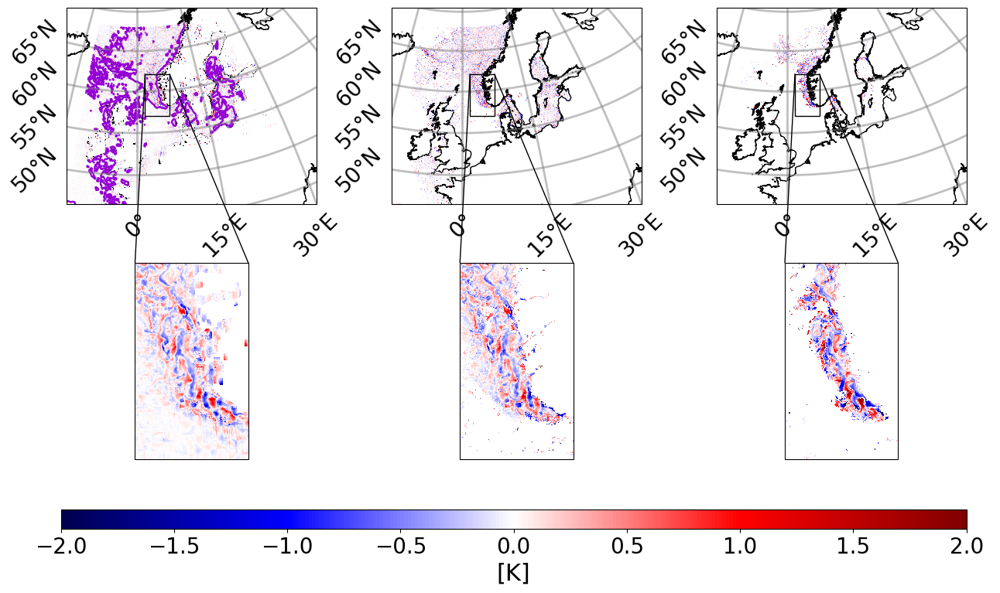

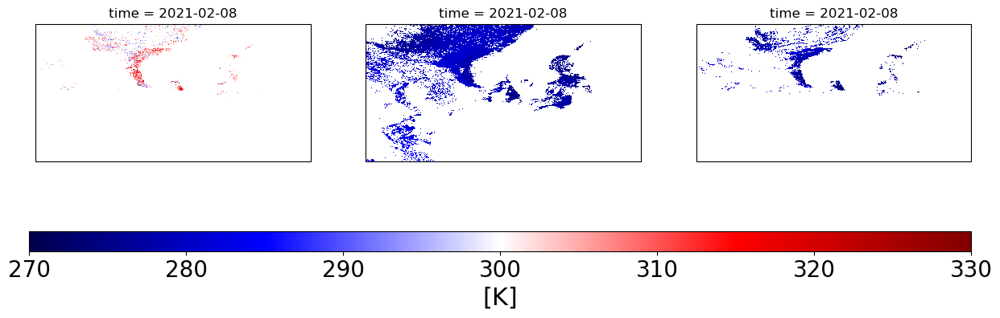

In [28]:
import cmocean as cmo
from skimage.filters.rank import majority
from skimage.morphology import square


def plot(ax, lon, lat, data, title, cmap, norm, extent=[-65, -55, 30, 40], gridded=True,
         colorbar=True, orientation="horizontal", fmt=True):
    ax.set_extent(list(extent))
    if gridded:
        im=ax.pcolormesh(lon, lat, data, cmap=cmap, \
                          norm=norm, edgecolors='none', alpha=1, snap=True,\
                          transform=ccrs.PlateCarree(central_longitude=0.0))
    else:
        im=ax.scatter(lon, lat, c=data, cmap=cmap, s=1, \
                       norm=norm, edgecolors='face', alpha=1, \
                       transform=ccrs.PlateCarree(central_longitude=0.0))
    #  im.set_clim(vmin,vmax)
    if colorbar==True:
        clb = plt.colorbar(im, orientation=orientation, pad=0.1, ax=ax)
        clb.set_label(title,fontsize = 25)
        clb.ax.tick_params(labelsize = 25)

    if fmt:
        gl = ax.gridlines(alpha=0.5, zorder=200,draw_labels=True)
        gl.xformatter = LONGITUDE_FORMATTER
        gl.yformatter = LATITUDE_FORMATTER
        gl.xlabels_bottom = False
        gl.ylabels_right = False
        gl.xlabel_style = {'fontsize': 10, 'rotation' : 45}
        gl.ylabel_style = {'fontsize': 10}
        
        
itime = 38
fig, (ax1, ax2,ax3) = plt.subplots(1,3,figsize=(15,5),
                               subplot_kw=dict(projection=ccrs.Orthographic(0,45), transform=ccrs.PlateCarree()))
OI = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation_flt50.nc") 
obs_s0 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0_flt50.nc") 
obs_s1 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt50.nc") 
vmax = 2
vmin = -2.
cmap = plt.cm.seismic
norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
extent = [np.min(OI.lon),np.max(OI.lon),np.min(OI.lat),np.max(OI.lat)]
lon = OI.lon.data
lat = OI.lat.data

mask_s0 = np.isnan(obs_s0.sea_surface_temperature[itime])
mask_s0 = majority(mask_s0.astype('uint8'), square(10))
mask_s1 = np.isnan(obs_s1.sea_surface_temperature[itime])
mask_s1 = majority(mask_s1.astype('uint8'), square(10))
mask_s1_only = mask_s1*(1-mask_s0)
plot(ax1,lon,lat,OI.analysed_sst.isel(time=itime),'',extent=extent,
     cmap=cmap,norm=norm,colorbar=False,fmt=False)
ax1.contour(OI.lon.data,OI.lat.data, 
            mask_s0, [0,1], colors="darkviolet", linewidth=.5,
           transform=ccrs.PlateCarree())
config_ticks(ax1)
#ax1.contour(OI.lon.data,OI.lat.data, 
#            mask_s1_only, [0,1], colors='red')
plot(ax2,lon,lat,obs_s0.sea_surface_temperature.isel(time=itime),'',extent=extent,
     cmap=cmap,norm=norm,colorbar=False,fmt=False)
config_ticks(ax2)
plot(ax3,lon,lat,obs_s1.sea_surface_temperature.isel(time=itime),'',extent=extent,
     cmap=cmap,norm=norm,colorbar=False,fmt=False)
config_ticks(ax3)

# inset plots
x1, x2, y1, y2 = 2, 7, 57, 62  # subregion of the original image
axins = ax1.inset_axes(
    [0, -1.3, 1, 1],
    xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[],
    projection=ccrs.Orthographic(0,45))
plot(axins,lon,lat,OI.analysed_sst.isel(time=itime),'',extent=[x1,x2,y1,y2],
     cmap=cmap,norm=norm,colorbar=False,fmt=False)
ax1.indicate_inset_zoom(axins, edgecolor="black", alpha=1)
axins = ax2.inset_axes(
    [0, -1.3, 1, 1],
    xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[],
    projection=ccrs.Orthographic(0,45))
plot(axins,lon,lat,obs_s0.sea_surface_temperature.isel(time=itime),'',extent=[x1,x2,y1,y2],
     cmap=cmap,norm=norm,colorbar=False,fmt=False)
ax2.indicate_inset_zoom(axins, edgecolor="black", alpha=1)
axins = ax3.inset_axes(
    [0, -1.3, 1, 1],
    xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[],
    projection=ccrs.Orthographic(0,45))
plot(axins,lon,lat,obs_s1.sea_surface_temperature.isel(time=itime),'',extent=[x1,x2,y1,y2],
     cmap=cmap,norm=norm,colorbar=False,fmt=False)
ax3.indicate_inset_zoom(axins, edgecolor="black", alpha=1)

# Colorbar
cbar_ax = fig.add_axes([0.12, -0.6, 0.78, 0.05])
cbar_ax.tick_params(labelsize=20)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal', pad=3.0)
cbar.ax.set_title("[K]",fontsize=22,y=-3)
plt.subplots_adjust(wspace=0.3) 

plt.savefig("/DATASET/mbeauchamp/DMI/postpro/small_scales_anomalies.png",bbox_inches="tight")

fig, (ax1, ax2,ax3) = plt.subplots(1,3,figsize=(15,5),
                               subplot_kw=dict(projection=ccrs.Orthographic(0,45), transform=ccrs.PlateCarree()))
OI = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc") 
obs_s0 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s0.nc") 
obs_s1 = xr.open_dataset("/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1.nc") 
vmax = 330
vmin = 270
cmap = plt.cm.seismic
norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
extent = [np.min(OI.lon),np.max(OI.lon),np.min(OI.lat),np.max(OI.lat)]
obs_s0.sea_surface_temperature.isel(time=itime).plot(ax=ax2,cmap=cmap,vmin=vmin, vmax=vmax,add_colorbar=False)
obs_s1.sea_surface_temperature.isel(time=itime).plot(ax=ax3,cmap=cmap,vmin=vmin, vmax=vmax,add_colorbar=False)
(obs_s0.sea_surface_temperature.isel(time=itime)-obs_s1.sea_surface_temperature.isel(time=itime)).plot(ax=ax1,cmap=cmap,vmin=-2, vmax=2,add_colorbar=False)
# Colorbar
cbar_ax = fig.add_axes([0.12, 0.1, 0.78, 0.05])
cbar_ax.tick_params(labelsize=20)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal', pad=3.0)
cbar.ax.set_title("[K]",fontsize=22,y=-3)
    
plt.show()

### 2.1.4 Compute spectrum for large scale process (grid rzf 10)

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_fltMS_low.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_fltMS_low.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9983325145614185
INFO:root: 
INFO:root:  STD RMSE Score = 0.0005415555151252225
INFO:root: 
INFO:root:  MEAN RMSE = 0.47392976139710097
INFO:root: 
INFO:root:  STD RMSE = 0.15688373720720727
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_fltMS_low.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


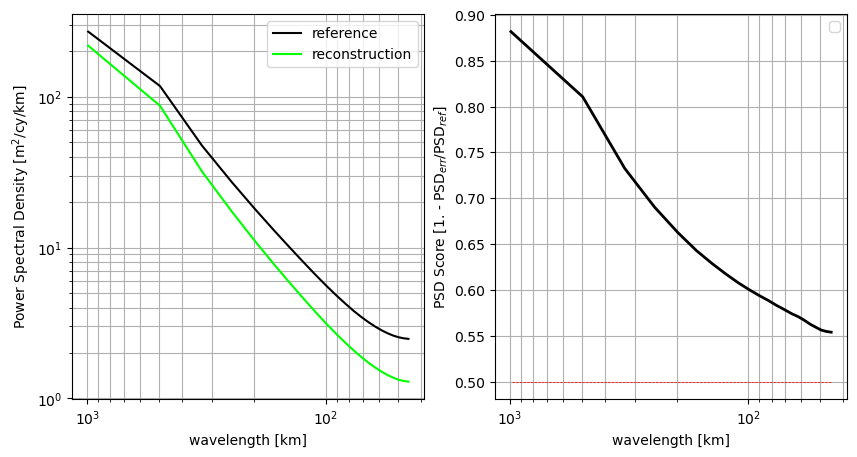

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_fltMS_low.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_fltMS_low.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9983841410992697
INFO:root: 
INFO:root:  STD RMSE Score = 0.0005484066405395853
INFO:root: 
INFO:root:  MEAN RMSE = 0.4593072561745392
INFO:root: 
INFO:root:  STD RMSE = 0.15869446972667217
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_fltMS_low.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


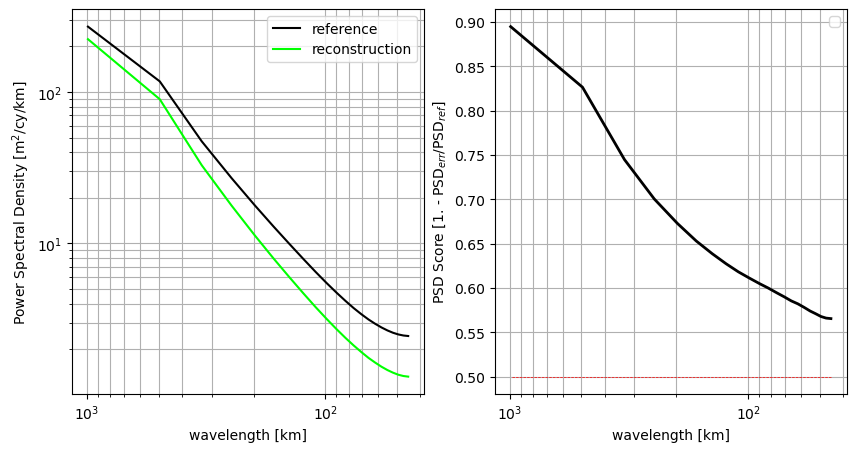

INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


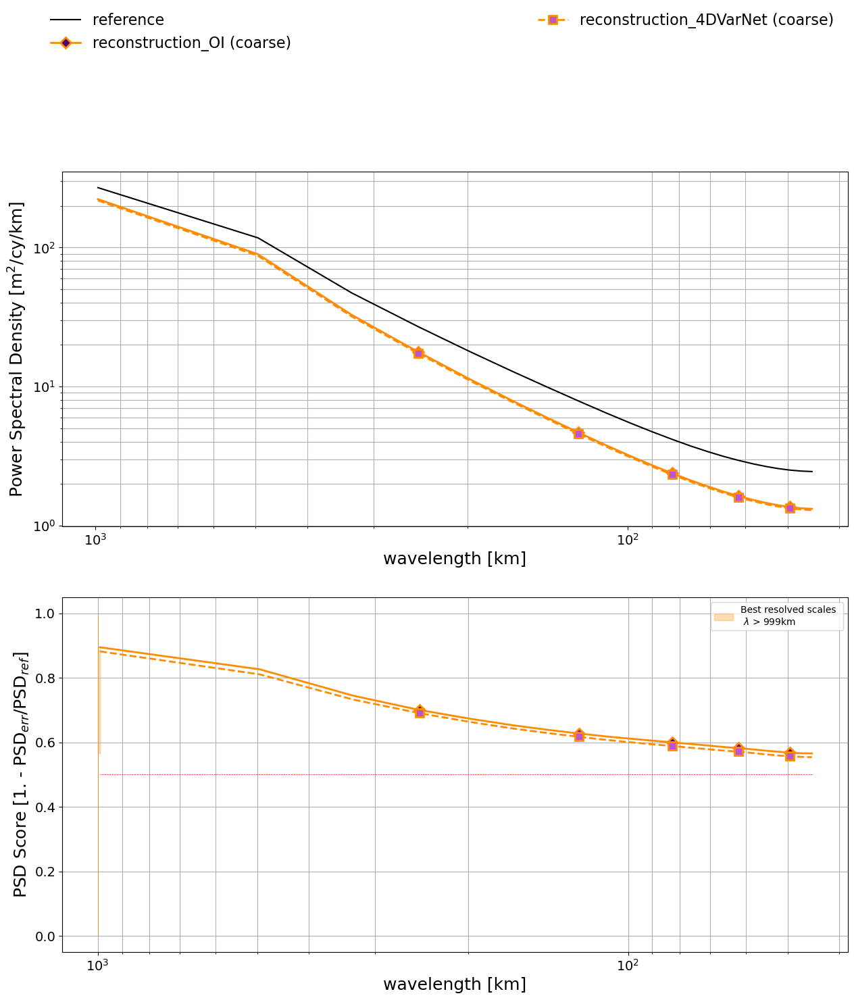

In [10]:
file_dl = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext_fltMS_low.nc"
file_oi = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation_fltMS_low.nc"

bin_lat_step = 0.1
bin_lon_step = 0.1
bin_time_step = '1D'
time_min = '2021-01-15'
time_max = '2021-12-31'
sel_time = slice(time_min, time_max)
delta_t = 0.9434  # s
velocity = 6.77   # km/s
delta_x = velocity * delta_t
delta_x = 22
lenght_scale = 1000 # km

# NS-BS Seas
lon_min = np.min(xr.open_dataset(file_dl).lon.data)
lon_max = np.max(xr.open_dataset(file_dl).lon.data)
lat_min = np.min(xr.open_dataset(file_dl).lat.data)
lat_max = np.max(xr.open_dataset(file_dl).lat.data)
leaderboard_nrmse_dl, leaderboard_nrmse_std_dl, leaderboard_psds_score_dl = run_comparison(file_dl,"4DVarNet_fltMS_low",crop=True)
leaderboard_nrmse_oi, leaderboard_nrmse_std_oi, leaderboard_psds_score_oi = run_comparison(file_oi,"OI_fltMS_low",crop=True)

spectrum_filenames = ['/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_fltMS_low.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_fltMS_low.nc',
                      ]
methods = ['OI (coarse)','4DVarNet (coarse)']
marker = ["D","s"]
linestyle = ["solid","dashed",]
colors = ["darkorange","darkorange"]
markerfacecolor = ["indigo","mediumorchid"]
markeredgecolor = ["darkorange","darkorange"]
itrcp_spectrum('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spectrum_coarse.png',
                               spectrum_filenames,
                               methods,
                               colors,
                               linestyle,
                               marker,
                               markerfacecolor,
                               markeredgecolor
              )

## 2.2 North and Baltic Seas domains

### 2.2.1 Yearly analysis

#### 2.2.1.1 Compute NetCDF metrics file (spatial, temporal, spectral)

In [ ]:
file_dl = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext.nc"
file_dl_dm1 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval.nc"
file_dl_dm2 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval.nc"
file_dl_dm3 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval.nc"
file_oi = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc"

bin_lat_step = 0.1
bin_lon_step = 0.1
bin_time_step = '1D'
time_min = '2021-01-15'
time_max = '2021-12-31'
sel_time = slice(time_min, time_max)
delta_t = 0.9434  # s
velocity = 6.77   # km/s
delta_x = velocity * delta_t
delta_x = 2.2
lenght_scale = 1000 # km

# NS-BS Seas
lon_min = np.min(xr.open_dataset(file_dl).lon.data)
lon_max = np.max(xr.open_dataset(file_dl).lon.data)
lat_min = np.min(xr.open_dataset(file_dl).lat.data)
lat_max = np.max(xr.open_dataset(file_dl).lat.data)
leaderboard_nrmse_dl, leaderboard_nrmse_std_dl, leaderboard_psds_score_dl = run_comparison(file_dl,"4DVarNet",crop=True)
leaderboard_nrmse_oi, leaderboard_nrmse_std_oi, leaderboard_psds_score_oi = run_comparison(file_oi,"OI",crop=True)

# D1
lon_min = np.min(xr.open_dataset(file_dl_dm1).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm1).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm1).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm1).lat.data)
leaderboard_nrmse_dl_dm1, leaderboard_nrmse_std_dl_dm1, leaderboard_psds_score_dl_dm1 = run_comparison(file_dl_dm1,"4DVarNet_D1")
leaderboard_nrmse_dl_dm1_tr_all, leaderboard_nrmse_std_dl_dm1_tr_all, leaderboard_psds_score_dl_dm1_tr_all = run_comparison(file_dl,"4DVarNet_D1_tr_all",crop=True)
leaderboard_nrmse_oi_dm1, leaderboard_nrmse_std_oi_dm1, leaderboard_psds_score_oi_dm1 = run_comparison(file_oi,"OI_D1",crop=True)

# D2
lon_min = np.min(xr.open_dataset(file_dl_dm2).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm2).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm2).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm2).lat.data)
leaderboard_nrmse_dl_dm2, leaderboard_nrmse_std_dl_dm2, leaderboard_psds_score_dl_dm2 = run_comparison(file_dl_dm2,"4DVarNet_D2")
leaderboard_nrmse_dl_dm2_tr_all, leaderboard_nrmse_std_dl_dm2_tr_all, leaderboard_psds_score_dl_dm2_tr_all = run_comparison(file_dl,"4DVarNet_D2_tr_all",crop=True)
leaderboard_nrmse_oi_dm2, leaderboard_nrmse_std_oi_dm2, leaderboard_psds_score_oi_dm2 = run_comparison(file_oi,"OI_D2",crop=True)

# D3
lon_min = np.min(xr.open_dataset(file_dl_dm3).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm3).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm3).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm3).lat.data)
leaderboard_nrmse_dl_dm3, leaderboard_nrmse_std_dl_dm3, leaderboard_psds_score_dl_dm3 = run_comparison(file_dl_dm3,"4DVarNet_D3")
leaderboard_nrmse_dl_dm3_tr_all, leaderboard_nrmse_std_dl_dm3_tr_all, leaderboard_psds_score_dl_dm3_tr_all = run_comparison(file_dl,"4DVarNet_D3_tr_all",crop=True)
leaderboard_nrmse_oi_dm3, leaderboard_nrmse_std_oi_dm3, leaderboard_psds_score_oi_dm3 = run_comparison(file_oi,"OI_D3",crop=True)

#### 2.2.1.2 Compute RMSE score intercomparison

In [15]:
file_dl = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext.nc"
file_dl_dm1 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval.nc"
file_dl_dm2 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval.nc"
file_dl_dm3 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval.nc"
file_oi = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc"

bin_lat_step = 0.1
bin_lon_step = 0.1
bin_time_step = '1D'
time_min = '2021-01-15'
time_max = '2021-12-31'
sel_time = slice(time_min, time_max)
delta_t = 0.9434  # s
velocity = 6.77   # km/s
delta_x = velocity * delta_t
delta_x = 2.2
lenght_scale = 1000 # km

TS_filenames_OI = ['/DATASET/mbeauchamp/DMI/postpro/TS_OI_D1.nc','/DATASET/mbeauchamp/DMI/postpro/TS_OI_D1.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/TS_OI_D2.nc','/DATASET/mbeauchamp/DMI/postpro/TS_OI_D2.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/TS_OI_D3.nc','/DATASET/mbeauchamp/DMI/postpro/TS_OI_D3.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/TS_OI.nc']

TS_filenames_4DVarNet = ['/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1.nc','/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1_tr_all.nc',
                         '/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2.nc','/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2_tr_all.nc',
                         '/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3.nc','/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3_tr_all.nc',
                        '/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet.nc']

ds_oi = [xr.open_dataset(file, group='diff') for file in TS_filenames_OI]
methods_oi =  ['dm1', 'dm1_tr_all','dm2', 'dm2_tr_all','dm3', 'dm3_tr_all','NB_seas']
ds_4DVarNet = [xr.open_dataset(file, group='diff') for file in TS_filenames_4DVarNet]
methods_4DVarNet =  ['dm1', 'dm1_tr_all','dm2', 'dm2_tr_all','dm3', 'dm3_tr_all','NB_seas']

rmse_score_oi = [ ds_oi[i]['rms'] for i in range(len(TS_filenames_OI)) ]
#rmse_score_oi = [ rmse_score_oi[i].dropna(dim='time').where(ds_oi[i]['count'] > 10, drop=True) for i in range(len(TS_filenames_OI)) ]
rmse_score_oi = xr.merge([rmse_score_oi[i].to_dataset().rename({"rms":"rms_"+methods_oi[i]}) for i in range(len(TS_filenames_OI))])

rmse_score_4DVarNet = [ ds_4DVarNet[i]['rms'] for i in range(len(TS_filenames_4DVarNet)) ]
#rmse_score_4DVarNet = [ rmse_score_4DVarNet[i].dropna(dim='time').where(ds_4DVarNet[i]['count'] > 10, drop=True) for i in range(len(TS_filenames_4DVarNet)) ]
rmse_score_4DVarNet = xr.merge([rmse_score_4DVarNet[i].to_dataset().rename({"rms":"rms_"+methods_4DVarNet[i]}) for i in range(len(TS_filenames_4DVarNet))])

rmse_score = 100*(rmse_score_4DVarNet-rmse_score_oi)/rmse_score_oi
rmse_score = rmse_score.sel(time=slice("2021-01-15","2021-12-30"))

# compute spatial coverage
count_mask = np.sum(~np.isfinite(xr.open_dataset(file_oi).analysed_sst[0]).data)
count_cell = np.prod(list(xr.open_dataset(file_oi).analysed_sst[0].sizes.values()))
count_active_cells = count_cell - count_mask
count_active_cells
ds_count = xr.open_dataset(TS_filenames_4DVarNet[-1], group='diff')['count']
ds_count = ds_count.sel(time=slice("2021-01-15","2021-12-30"))
rmse_score = rmse_score.update({"ds_count":(("time"),100*(ds_count.data/count_active_cells))})

# compute spatial coverage DM1
lon_min = np.min(xr.open_dataset(file_dl_dm1).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm1).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm1).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm1).lat.data)
count_mask = np.sum(~np.isfinite(xr.open_dataset(file_oi).analysed_sst[0].sel(lon=slice(lon_min,lon_max),
                                                                              lat=slice(lat_min,lat_max))).data)
count_cell = np.prod(list(xr.open_dataset(file_oi).analysed_sst[0].sel(lon=slice(lon_min,lon_max),
                                                                       lat=slice(lat_min,lat_max)).sizes.values()))
count_active_cells = count_cell - count_mask
count_active_cells
ds_count_dm1 = xr.open_dataset(TS_filenames_4DVarNet[0], group='diff')['count']
ds_count_dm1 = ds_count_dm1.sel(time=slice("2021-01-15","2021-12-30"))
rmse_score = rmse_score.update({"ds_count_dm1":(("time"),100*(ds_count_dm1.data/count_active_cells))})

# compute spatial coverage DM2
lon_min = np.min(xr.open_dataset(file_dl_dm2).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm2).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm2).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm2).lat.data)
count_mask = np.sum(~np.isfinite(xr.open_dataset(file_oi).analysed_sst[0].sel(lon=slice(lon_min,lon_max),
                                                                              lat=slice(lat_min,lat_max))).data)
count_cell = np.prod(list(xr.open_dataset(file_oi).analysed_sst[0].sel(lon=slice(lon_min,lon_max),
                                                                       lat=slice(lat_min,lat_max)).sizes.values()))
count_active_cells = count_cell - count_mask
count_active_cells
ds_count_dm2 = xr.open_dataset(TS_filenames_4DVarNet[2], group='diff')['count']
ds_count_dm2 = ds_count_dm2.sel(time=slice("2021-01-15","2021-12-30"))
rmse_score = rmse_score.update({"ds_count_dm2":(("time"),100*(ds_count_dm2.data/count_active_cells))})

# compute spatial coverage DM3
lon_min = np.min(xr.open_dataset(file_dl_dm3).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm3).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm3).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm3).lat.data)
count_mask = np.sum(~np.isfinite(xr.open_dataset(file_oi).analysed_sst[0].sel(lon=slice(lon_min,lon_max),
                                                                              lat=slice(lat_min,lat_max))).data)
count_cell = np.prod(list(xr.open_dataset(file_oi).analysed_sst[0].sel(lon=slice(lon_min,lon_max),
                                                                       lat=slice(lat_min,lat_max)).sizes.values()))
count_active_cells = count_cell - count_mask
count_active_cells
ds_count_dm3 = xr.open_dataset(TS_filenames_4DVarNet[4], group='diff')['count']
ds_count_dm3 = ds_count_dm3.sel(time=slice("2021-01-15","2021-12-30"))
rmse_score, ds_count_dm3 = xr.align(rmse_score, ds_count_dm3)
rmse_score = rmse_score.update({"ds_count_dm3":(("time"),100*(ds_count_dm3.data/count_active_cells))})

rmse_score

<xarray.Dataset> Size: 33kB
Dimensions:         (time: 348)
Coordinates:
  * time            (time) datetime64[ns] 3kB 2021-01-15 ... 2021-12-28
Data variables:
    rms_dm1         (time) float64 3kB 0.4683 -1.259 6.545 ... 0.001212 0.7297
    rms_dm1_tr_all  (time) float64 3kB -2.374 -4.495 0.5132 ... -2.177 0.6547
    rms_dm2         (time) float64 3kB 2.43 6.653 -4.731 ... 0.8308 0.5244 10.1
    rms_dm2_tr_all  (time) float64 3kB 2.857 5.782 -4.467 ... 0.7063 10.97
    rms_dm3         (time) float64 3kB 2.006 nan 159.4 ... 0.7187 3.745 9.865
    rms_dm3_tr_all  (time) float64 3kB 10.46 nan 139.9 ... -1.253 0.6199 5.698
    rms_NB_seas     (time) float64 3kB 0.9574 0.3487 -2.107 ... -0.02422 -4.278
    ds_count        (time) float64 3kB 10.08 7.656 7.936 ... 14.69 9.888 3.492
    ds_count_dm1    (time) float64 3kB 4.027 14.07 7.229 ... 52.66 29.49 1.299
    ds_count_dm2    (time) float64 3kB 0.2677 4.137 0.3994 ... 0.1535 0.006225
    ds_count_dm3    (time) float64 3kB 0.05282 nan 0.006602 ... 48.13 0.2311

#### 2.2.1.3 Spatial RMSE gain mapping 

In [9]:
spa_stat_filenames_OI = ['/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI.nc']

spa_stat_filenames_4DVarNet = ['/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all.nc',
                         '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all.nc',
                         '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all.nc',
                        '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet.nc']

file_dl = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext.nc"
file_dl_dm1 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval.nc"
file_dl_dm2 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval.nc"
file_dl_dm3 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval.nc"
file_oi = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc"

spa_filenames =  spa_stat_filenames_OI + spa_stat_filenames_4DVarNet
filenames = [file_dl_dm1,file_dl_dm1,file_dl_dm2,file_dl_dm2,file_dl_dm3,file_dl_dm3,file_dl]
filenames = filenames + filenames

0 0
0 0
0 1
0 2


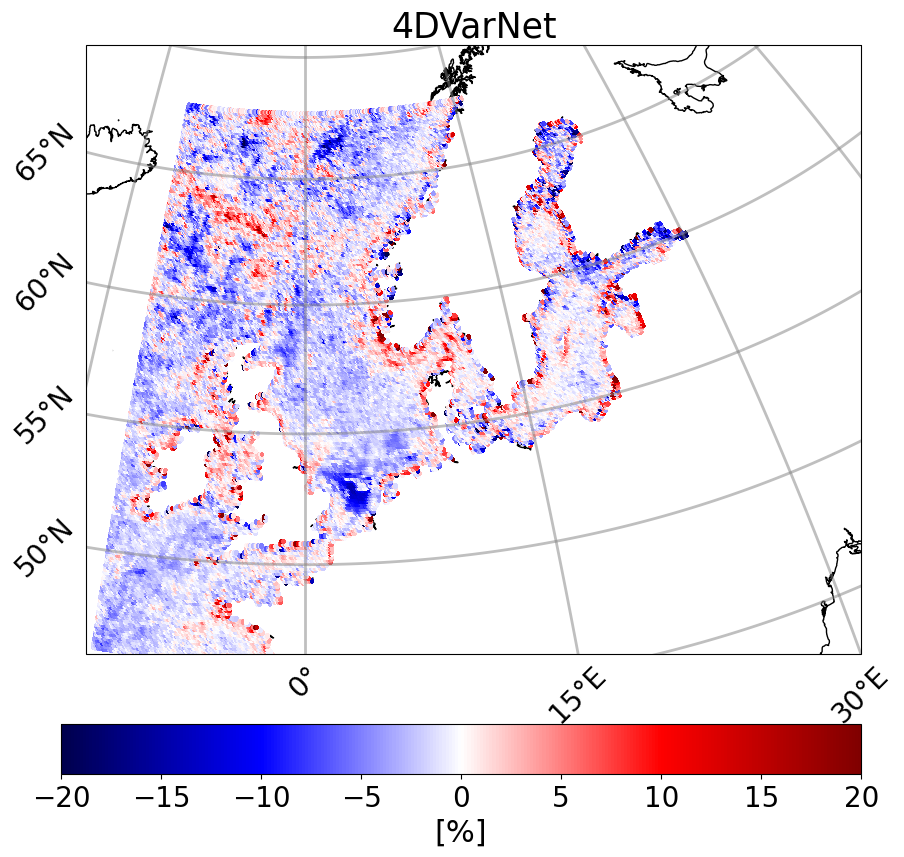

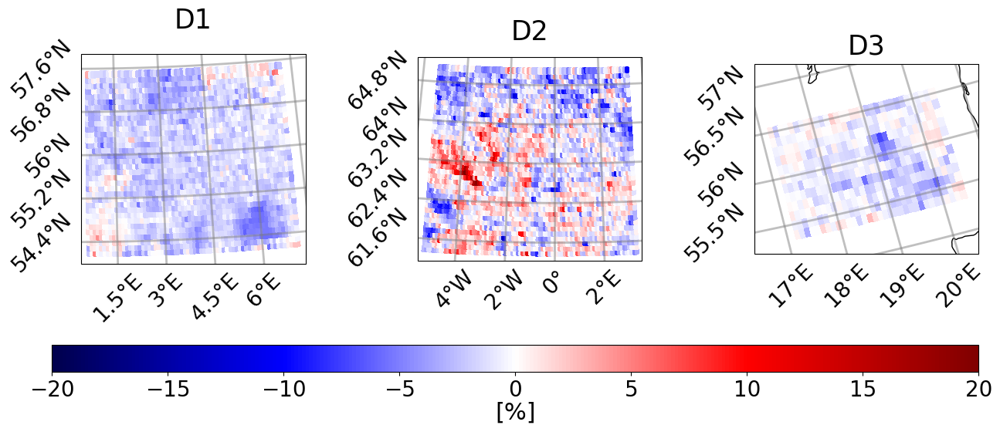

In [11]:
ds = [ xr.open_dataset(spa_filenames[i],group='diff').rmse for i in range(len(spa_filenames))] 
for i in range(len(ds)):
    lon_min = np.min(xr.open_dataset(filenames[i]).lon.data)
    lon_max = np.max(xr.open_dataset(filenames[i]).lon.data)
    lat_min = np.min(xr.open_dataset(filenames[i]).lat.data)
    lat_max = np.max(xr.open_dataset(filenames[i]).lat.data)
    ds[i] = ds[i].assign_coords(lon=np.mod(ds[i].lon -180.0,360.0)-180.0)
    ds[i] = ds[i].sortby(ds[i].lon).sel(lon=slice(lon_min,lon_max),lat=slice(lat_min,lat_max))

itrcp_spa_diff('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff.png', ds[6], [ds[13]],
               ds[6].lon, ds[6].lat,
               figsize=(10,10),
               methods=["4DVarNet"],
               vmin=-20,vmax=20)
               
itrcp_spa_diff('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_bydm.png',
               [ ds[i] for i in [0,2,4] ], 
               [ ds[i] for i in [8,10,12] ],
               [ds[0].lon.data,  ds[2].lon.data, ds[4].lon.data], 
               [ds[0].lat.data,  ds[2].lat.data, ds[4].lat.data],
               methods=["D1","D2","D3"],
               figsize=(15,7),
               nr=1,nc=3,
               vmin=-20,vmax=20)

from PIL import Image
from IPython.display import display
img = Image.open('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff.png')
display(img)
img = Image.open('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_bydm.png')
display(img)

#### 2.2.1.4 Temporal boxplots RMSE gain

/homes/m19beauc/miniconda3/envs/4dvarnet/lib/python3.10/site-packages/numpy/lib/function_base.py:4657: RuntimeWarning: invalid value encountered in multiply
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))


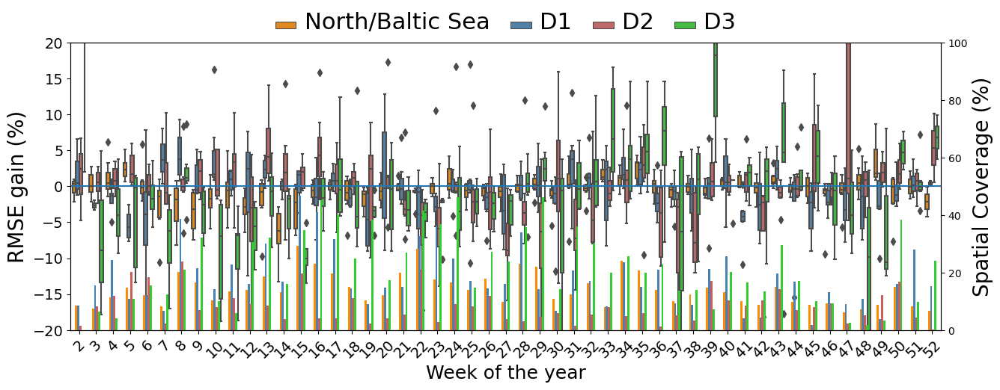

In [16]:
import seaborn
ts = pd.DataFrame(rmse_score[["rms_NB_seas","rms_dm1","rms_dm2","rms_dm3"]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["D0","D1","D2","D3"])
ts['week'] = ts.index.isocalendar().week
ts['id'] = ts.index

ct = pd.DataFrame(rmse_score[["ds_count","ds_count_dm1","ds_count_dm2","ds_count_dm3"]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["D0","D1","D2","D3"])
ct['week'] = ct.index.isocalendar().week
ct['id'] = ct.index

data = pd.wide_to_long(ts,stubnames="D",i=["id"],j="domain")
data['domain'] = data.D.index.get_level_values('domain')

fig, ax = plt.subplots(figsize=(15,5))
bp = seaborn.boxplot(data=data,
                ax=ax, x="week",y="D", hue="domain",
                palette=["darkorange","steelblue","indianred","limegreen"])
labels = ["North/Baltic Sea","D1","D2","D3"]
for i in range(len(labels)):
    bp.legend_.texts[i].set_text(labels[i])
    
ax.set_ylabel('RMSE gain (%)',fontsize=20)
ax.margins(x=0) 
ax.set_ylim(-20,20)
plt.axhline(y=0)
axes2 = plt.twinx()
width=0.75
spatial_coverage=ct.groupby("week").mean().drop("id",axis=1)
p1 = spatial_coverage.plot(kind="bar",ax=axes2,
                           legend=False,color=["darkorange","steelblue","indianred","limegreen"])
axes2.set_ylim(0, 100)
axes2.set_ylabel('Spatial Coverage (%)',fontsize=20)
axes2.margins(x=0) 

seaborn.move_legend(
    bp, "lower center",
    bbox_to_anchor=(.5, 1), ncol=4, title=None, frameon=False)
ax.tick_params(axis='x', labelrotation=45)
ax.tick_params(axis='both', which='major', labelsize=14)
ax.set_xlabel('Week of the year', fontsize=18)
plt.setp(ax.get_legend().get_texts(), fontsize='22')
#plt.grid()
plt.savefig('/DATASET/mbeauchamp/DMI/postpro/boxplot_all.pdf', bbox_inches='tight')

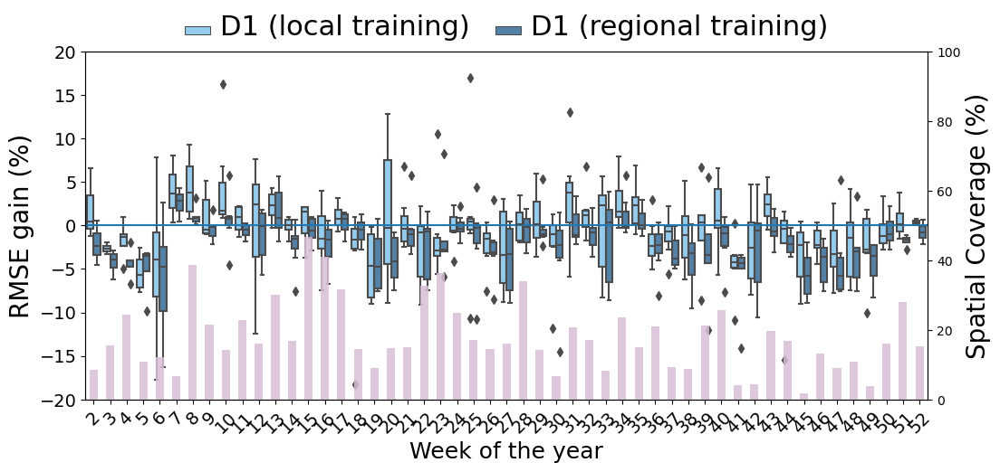

In [17]:
import seaborn
ts = pd.DataFrame(rmse_score[["rms_dm1","rms_dm1_tr_all"]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["D_tr1","D_tr2"])
ts['week'] = ts.index.isocalendar().week
ts['id'] = ts.index

ct = pd.DataFrame(rmse_score[["ds_count_dm1"]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["C"])
ct['week'] = ct.index.isocalendar().week
ct['id'] = ct.index

data = pd.wide_to_long(ts,stubnames="D_tr",i=["id"],j="domain")
data['domain'] = data.D_tr.index.get_level_values('domain')

fig, ax = plt.subplots(figsize=(12,5))
bp = seaborn.boxplot(data=data,
                ax=ax, x="week",y="D_tr", hue="domain",
                palette=["lightskyblue","steelblue"])
labels = ["D1 (local training)","D1 (regional training)"]
for i in range(len(labels)):
    bp.legend_.texts[i].set_text(labels[i])
    
ax.set_ylabel('RMSE gain (%)',fontsize=20)
ax.set_ylim(-20,20)
ax.margins(x=0) 
plt.axhline(y=0)
axes2 = plt.twinx()
spatial_coverage=ct.groupby("week").mean().drop("id",axis=1)
p1 = spatial_coverage.C.plot(kind='bar',
               legend=False,color='thistle',alpha=0.85)
axes2.set_ylim(0, 100)
axes2.set_ylabel('Spatial Coverage (%)',fontsize=20)
axes2.margins(x=0) 
seaborn.move_legend(
    bp, "lower center",
    bbox_to_anchor=(.5, 1), ncol=2, title=None, frameon=False)
ax.tick_params(axis='x', labelrotation=45)
ax.tick_params(axis='both', which='major', labelsize=14)
ax.set_xlabel('Week of the year', fontsize=18)
plt.setp(ax.get_legend().get_texts(), fontsize='22')
#plt.grid()
plt.savefig('/DATASET/mbeauchamp/DMI/postpro/boxplot_dm1.pdf', bbox_inches='tight')

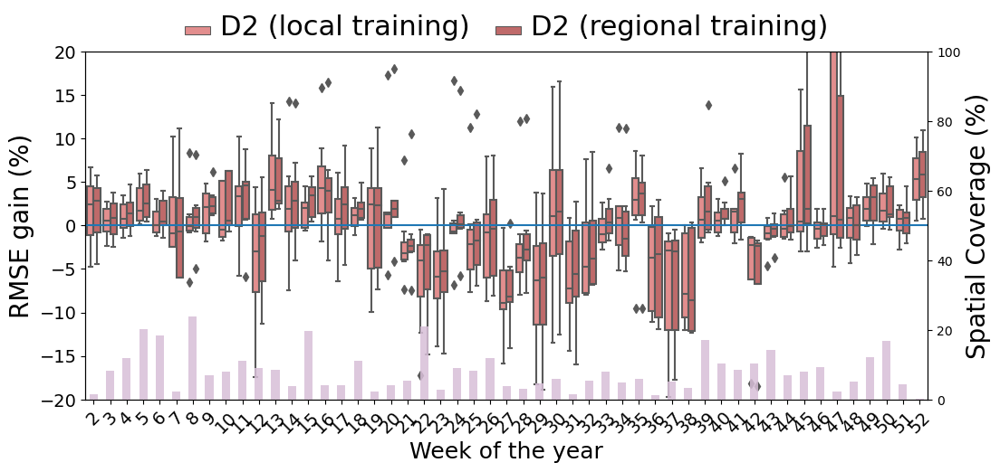

In [18]:
import seaborn
ts = pd.DataFrame(rmse_score[["rms_dm2","rms_dm2_tr_all"]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["D_tr1","D_tr2"])
ts['week'] = ts.index.isocalendar().week
ts['id'] = ts.index

ct = pd.DataFrame(rmse_score[["ds_count_dm2"]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["C"])
ct['week'] = ct.index.isocalendar().week
ct['id'] = ct.index

data = pd.wide_to_long(ts,stubnames="D_tr",i=["id"],j="domain")
data['domain'] = data.D_tr.index.get_level_values('domain')

fig, ax = plt.subplots(figsize=(12,5))
bp = seaborn.boxplot(data=data,
                ax=ax, x="week",y="D_tr", hue="domain",
                palette=["lightcoral","indianred"])
labels = ["D2 (local training)","D2 (regional training)"]
for i in range(len(labels)):
    bp.legend_.texts[i].set_text(labels[i])
    
ax.set_ylabel('RMSE gain (%)',fontsize=20)
ax.set_ylim(-20,20)
ax.margins(x=0) 
plt.axhline(y=0)
axes2 = plt.twinx()
spatial_coverage=ct.groupby("week").mean().drop("id",axis=1)
p1 = spatial_coverage.C.plot(kind='bar',
               legend=False,color='thistle',alpha=0.85)
axes2.set_ylim(0, 100)
axes2.set_ylabel('Spatial Coverage (%)',fontsize=20)
axes2.margins(x=0) 
seaborn.move_legend(
    bp, "lower center",
    bbox_to_anchor=(.5, 1), ncol=2, title=None, frameon=False)
ax.tick_params(axis='x', labelrotation=45)
ax.tick_params(axis='both', which='major', labelsize=14)
ax.set_xlabel('Week of the year', fontsize=18)
plt.setp(ax.get_legend().get_texts(), fontsize='22')
#plt.grid()
plt.savefig('/DATASET/mbeauchamp/DMI/postpro/boxplot_dm2.pdf', bbox_inches='tight')

/homes/m19beauc/miniconda3/envs/4dvarnet/lib/python3.10/site-packages/numpy/lib/function_base.py:4657: RuntimeWarning: invalid value encountered in multiply
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/homes/m19beauc/miniconda3/envs/4dvarnet/lib/python3.10/site-packages/numpy/lib/function_base.py:4657: RuntimeWarning: invalid value encountered in multiply
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))


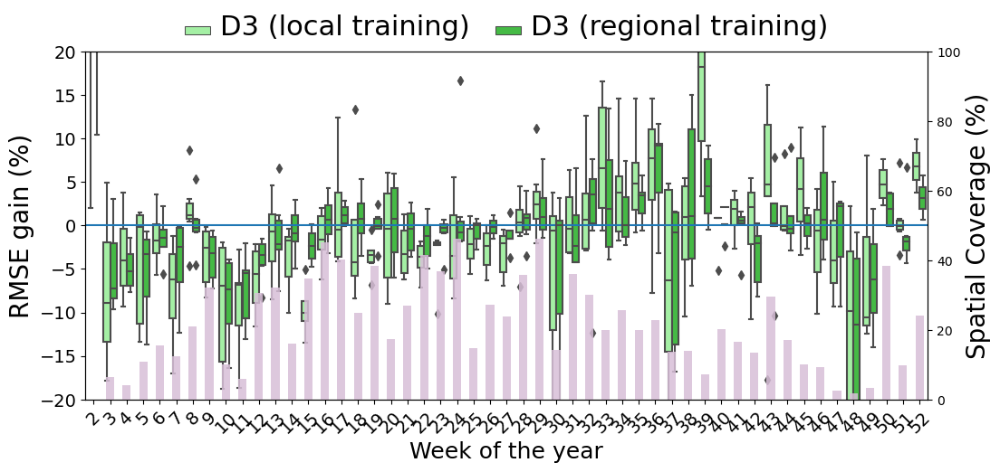

In [19]:
import seaborn
ts = pd.DataFrame(rmse_score[["rms_dm3","rms_dm3_tr_all"]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["D_tr1","D_tr2"])
ts['week'] = ts.index.isocalendar().week
ts['id'] = ts.index

ct = pd.DataFrame(rmse_score[["ds_count_dm3"]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["C"])
ct['week'] = ct.index.isocalendar().week
ct['id'] = ct.index

data = pd.wide_to_long(ts,stubnames="D_tr",i=["id"],j="domain")
data['domain'] = data.D_tr.index.get_level_values('domain')

fig, ax = plt.subplots(figsize=(12,5))
bp = seaborn.boxplot(data=data,
                ax=ax, x="week",y="D_tr", hue="domain",
                palette=["palegreen","limegreen"])
labels = ["D3 (local training)","D3 (regional training)"]
for i in range(len(labels)):
    bp.legend_.texts[i].set_text(labels[i])
    
ax.set_ylabel('RMSE gain (%)',fontsize=20)
ax.set_ylim(-20,20)
ax.margins(x=0) 
plt.axhline(y=0)
axes2 = plt.twinx()
spatial_coverage=ct.groupby("week").mean().drop("id",axis=1)
p1 = spatial_coverage.C.plot(kind='bar',
               legend=False,color='thistle',alpha=0.85)
axes2.set_ylim(0, 100)
axes2.set_ylabel('Spatial Coverage (%)',fontsize=20)
axes2.margins(x=0) 
seaborn.move_legend(
    bp, "lower center",
    bbox_to_anchor=(.5, 1), ncol=2, title=None, frameon=False)
ax.tick_params(axis='x', labelrotation=45)
ax.tick_params(axis='both', which='major', labelsize=14)
ax.set_xlabel('Week of the year', fontsize=18)
plt.setp(ax.get_legend().get_texts(), fontsize='22')
#plt.grid()
plt.savefig('/DATASET/mbeauchamp/DMI/postpro/boxplot_dm3.pdf', bbox_inches='tight')

#### 2.2.1.5 Spectral plots

INFO:root: 
INFO:root:  Minimum spatial scale resolved = 5km


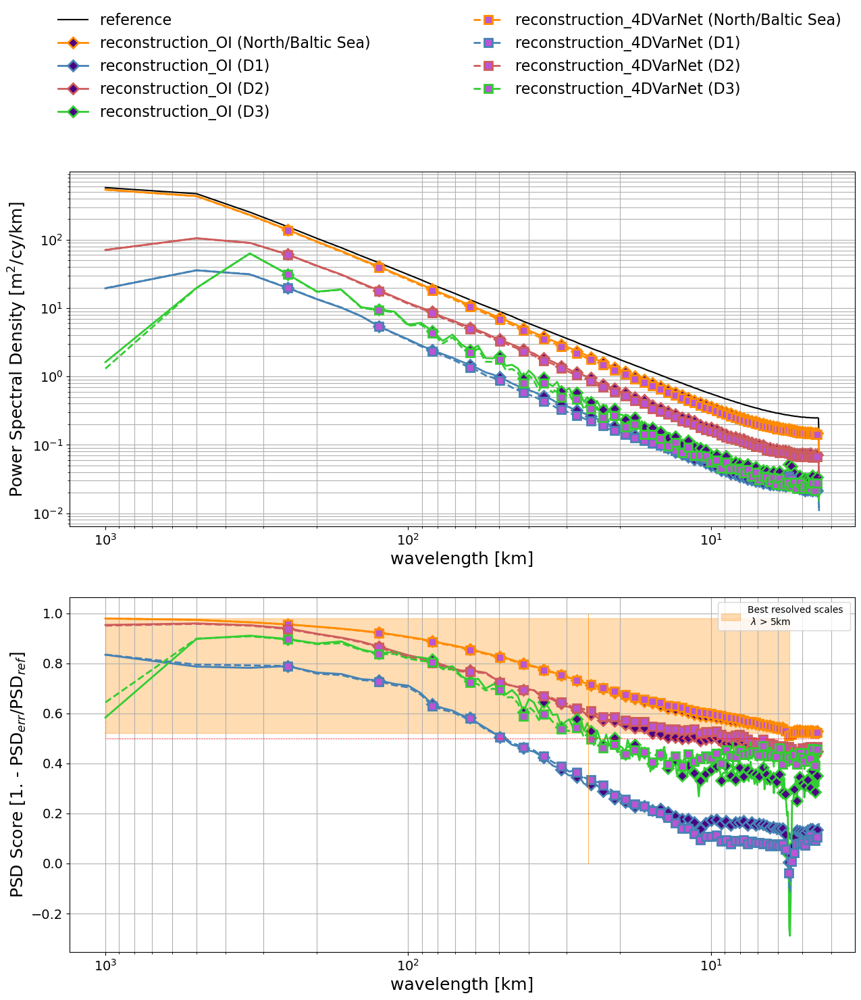

In [71]:
spectrum_filenames = ['/DATASET/mbeauchamp/DMI/postpro/spectrum_OI.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3.nc']
methods = ['OI (North/Baltic Sea)','OI (D1)','OI (D2)','OI (D3)',
           '4DVarNet (North/Baltic Sea)','4DVarNet (D1)','4DVarNet (D2)','4DVarNet (D3)']
marker = ["D","D","D","D","s","s","s","s"]
linestyle = ["solid","solid","solid","solid","dashed","dashed","dashed","dashed",]
colors = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
markerfacecolor = ["indigo","indigo","indigo","indigo","mediumorchid","mediumorchid","mediumorchid","mediumorchid"]
markeredgecolor = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
itrcp_spectrum('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spectrum.png',
                               spectrum_filenames,
                               methods,
                               colors,
                               linestyle,
                               marker,
                               markerfacecolor,
                               markeredgecolor
              )

#### 2.2.1.6 Leaderboard

In [ ]:
data = np.array([['OI',leaderboard_nrmse_oi,leaderboard_nrmse_std_oi,int(leaderboard_psds_score_oi)],
                 ['4DVarNet',leaderboard_nrmse_dl,leaderboard_nrmse_std_dl,int(leaderboard_psds_score_dl)],
                 ['OI_dm1',leaderboard_nrmse_oi_dm1,leaderboard_nrmse_std_oi_dm1,int(leaderboard_psds_score_oi_dm1)],
                 ['4DVarNet_dm1r',leaderboard_nrmse_dl_dm1,leaderboard_nrmse_std_dl_dm1,int(leaderboard_psds_score_dl_dm1)],
                 ['4DVarNet_dm1l',leaderboard_nrmse_dl_dm1_tr_all,leaderboard_nrmse_std_dl_dm1_tr_all,int(leaderboard_psds_score_dl_dm1_tr_all)],
                 ['OI_dm2',leaderboard_nrmse_oi_dm2,leaderboard_nrmse_std_oi_dm2,int(leaderboard_psds_score_oi_dm2)],
                 ['4DVarNet_dm2r',leaderboard_nrmse_dl_dm2,leaderboard_nrmse_std_dl_dm2,int(leaderboard_psds_score_dl_dm2)],
                 ['4DVarNet_dm2l',leaderboard_nrmse_dl_dm2_tr_all,leaderboard_nrmse_std_dl_dm2_tr_all,int(leaderboard_psds_score_dl_dm2_tr_all)],
                 ['OI_dm3',leaderboard_nrmse_oi_dm3,leaderboard_nrmse_std_oi_dm3,int(leaderboard_psds_score_oi_dm3)],
                 ['4DVarNet_dm3r',leaderboard_nrmse_dl_dm3,leaderboard_nrmse_std_dl_dm3,int(leaderboard_psds_score_dl_dm3)],
                 ['4DVarNet_dm3l',leaderboard_nrmse_dl_dm3_tr_all,leaderboard_nrmse_std_dl_dm3_tr_all,int(leaderboard_psds_score_dl_dm3_tr_all)],                                  
                ])
Leaderboard = pd.DataFrame(data, 
                           columns=['Method', 
                                    "µ(RMSE) ", 
                                    "σ(RMSE)", 
                                    'λx (km)'])
print("Summary of the leaderboard metrics:")
Leaderboard
print(Leaderboard.to_markdown())

### 2.2.2 Seasonal analysis

#### 2.2.2.1 Compute NetCDF metrics file (spatial, temporal, spectral)

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_DJF.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_DJF.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9984747951038274
INFO:root: 
INFO:root:  STD RMSE Score = 0.0004947670778080588
INFO:root: 
INFO:root:  MEAN RMSE = 0.42705715426026414
INFO:root: 
INFO:root:  STD RMSE = 0.1390523618497272
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_DJF.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


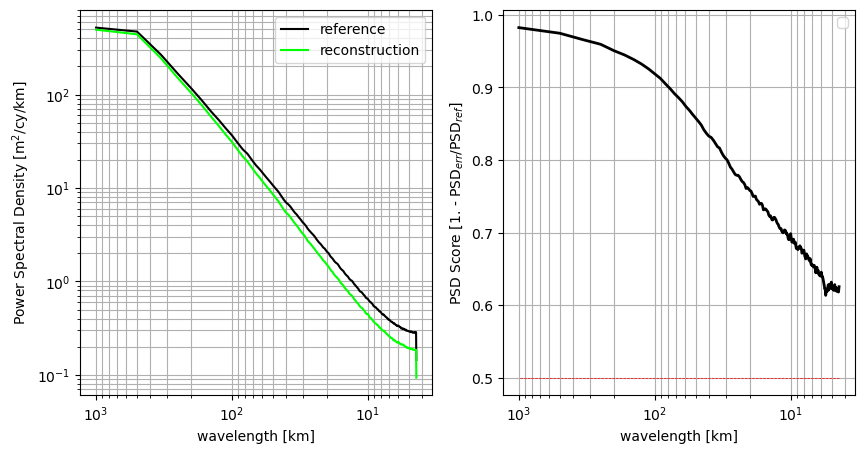

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_DJF.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_DJF.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9984785455309563
INFO:root: 
INFO:root:  STD RMSE Score = 0.0005083192998730267
INFO:root: 
INFO:root:  MEAN RMSE = 0.42612520396808107
INFO:root: 
INFO:root:  STD RMSE = 0.14282769388478134
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_DJF.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


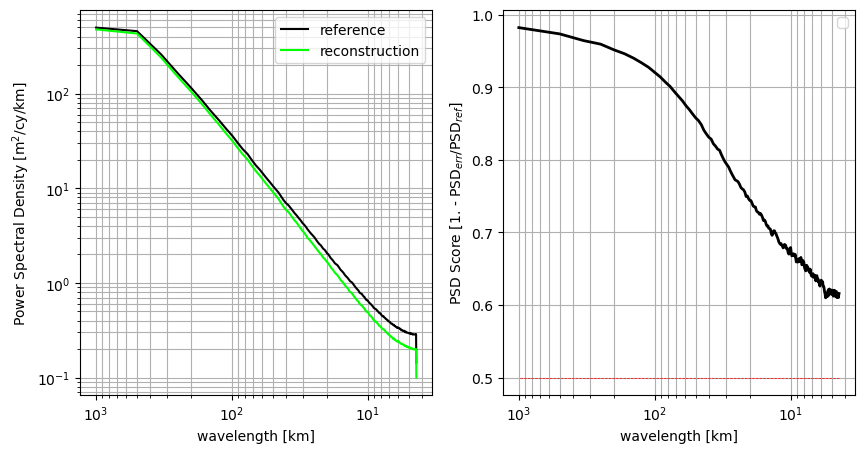

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_DJF.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1_DJF.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9985969733293659
INFO:root: 
INFO:root:  STD RMSE Score = 0.0016289664207288558
INFO:root: 
INFO:root:  MEAN RMSE = 0.3931634220636688
INFO:root: 
INFO:root:  STD RMSE = 0.4544713622630548
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_DJF.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 61km


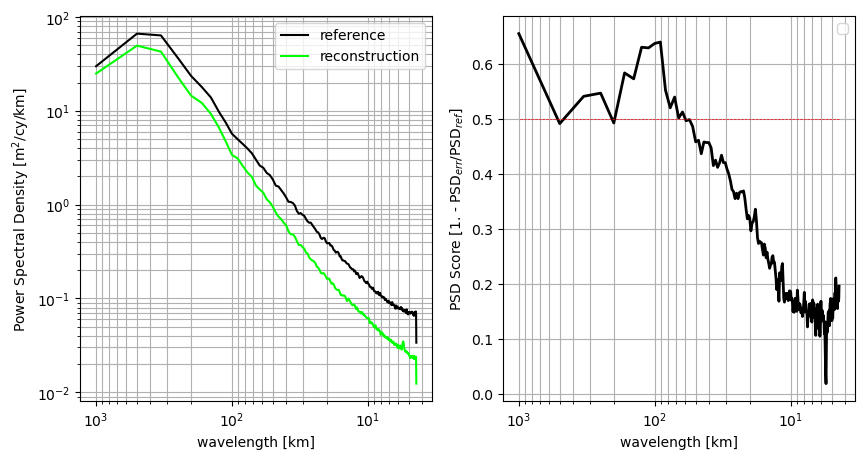

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_DJF.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1_tr_all_DJF.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9986104747040809
INFO:root: 
INFO:root:  STD RMSE Score = 0.0016356633043272163
INFO:root: 
INFO:root:  MEAN RMSE = 0.3893776508003291
INFO:root: 
INFO:root:  STD RMSE = 0.45634103136225296
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_tr_all_DJF.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 141km


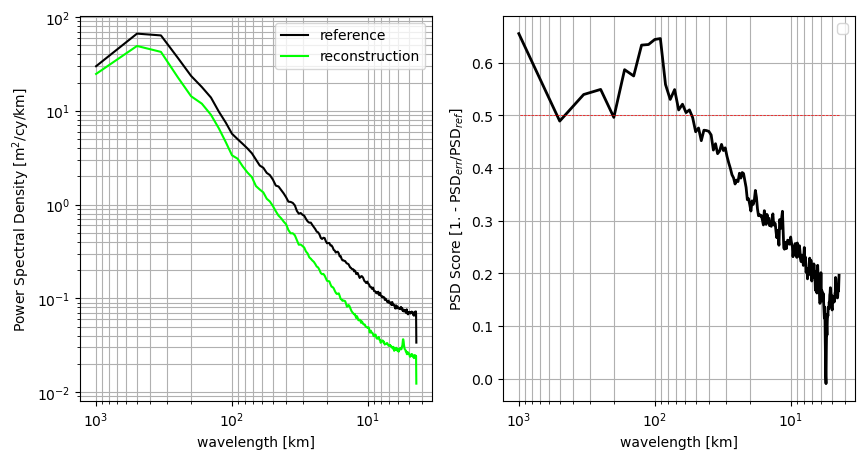

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_DJF.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D1_DJF.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9986178497415343
INFO:root: 
INFO:root:  STD RMSE Score = 0.0016028463218231124
INFO:root: 
INFO:root:  MEAN RMSE = 0.38740526332892444
INFO:root: 
INFO:root:  STD RMSE = 0.44718699301946585
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_DJF.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 56km


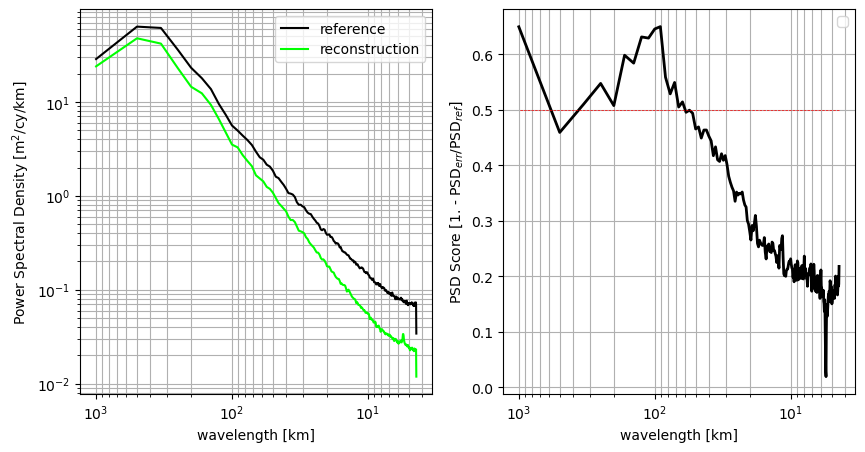

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_DJF.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2_DJF.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9987266756951252
INFO:root: 
INFO:root:  STD RMSE Score = 0.0004899392644232206
INFO:root: 
INFO:root:  MEAN RMSE = 0.35625931011264755
INFO:root: 
INFO:root:  STD RMSE = 0.13704910481990032
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_DJF.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 5km


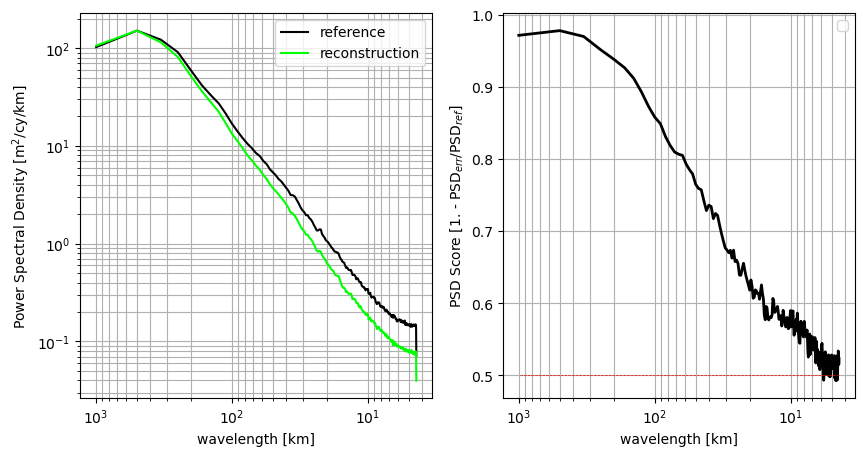

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_DJF.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2_tr_all_DJF.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9987228958500602
INFO:root: 
INFO:root:  STD RMSE Score = 0.0004873354869489709
INFO:root: 
INFO:root:  MEAN RMSE = 0.35731589071979314
INFO:root: 
INFO:root:  STD RMSE = 0.1363166867832297
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_tr_all_DJF.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 6km


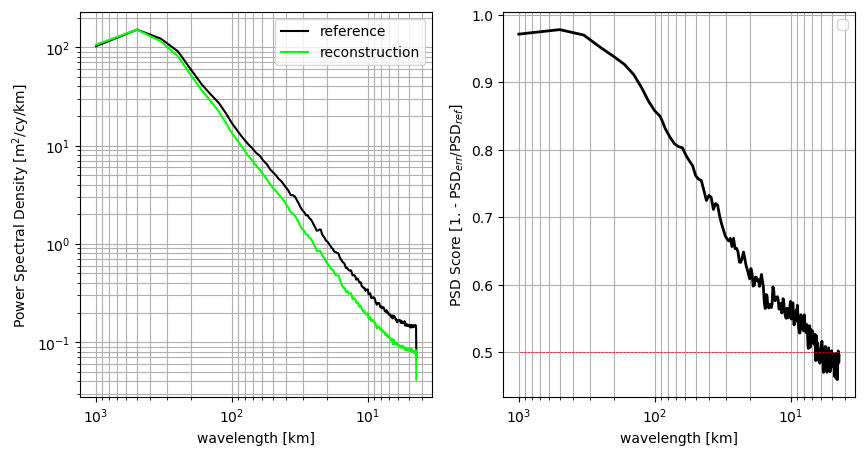

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_DJF.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D2_DJF.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9987456372492571
INFO:root: 
INFO:root:  STD RMSE Score = 0.00047166555279150904
INFO:root: 
INFO:root:  MEAN RMSE = 0.3510146350866077
INFO:root: 
INFO:root:  STD RMSE = 0.13190782299864195
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_DJF.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 4km


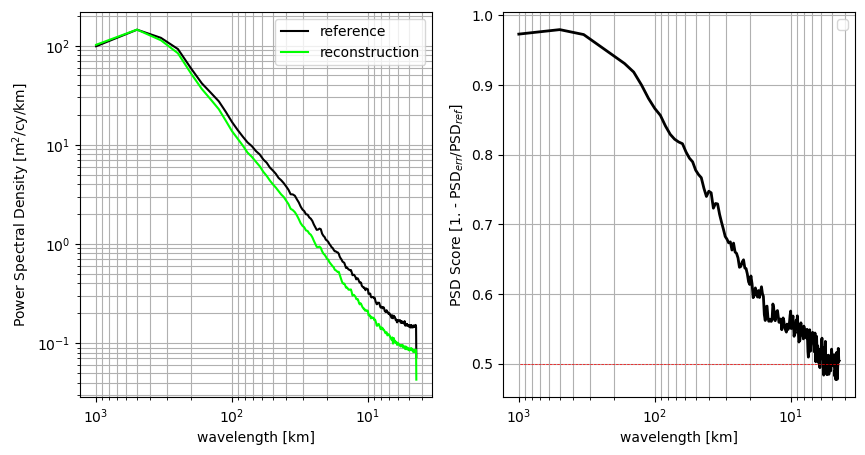

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_DJF.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3_DJF.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.998655304307952
INFO:root: 
INFO:root:  STD RMSE Score = 0.0004804662827586779
INFO:root: 
INFO:root:  MEAN RMSE = 0.37394800066166367
INFO:root: 
INFO:root:  STD RMSE = 0.13333819228464958
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_DJF.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 33km


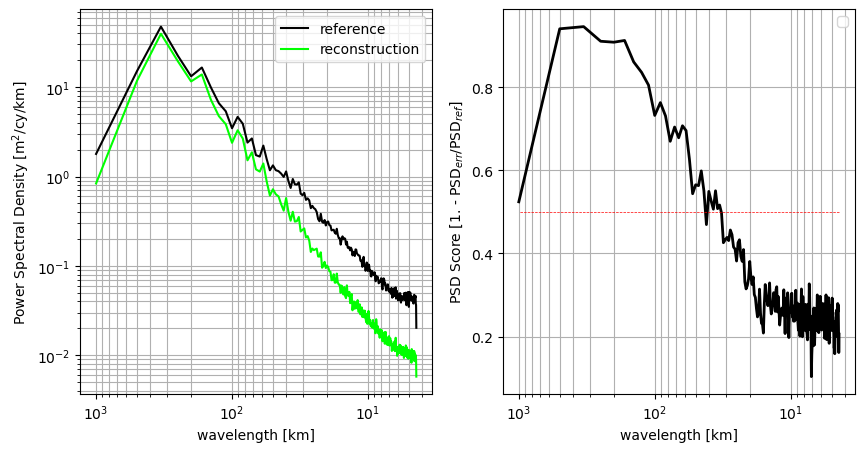

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_DJF.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3_tr_all_DJF.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9986665342146936
INFO:root: 
INFO:root:  STD RMSE Score = 0.00046585892111179874
INFO:root: 
INFO:root:  MEAN RMSE = 0.3708205013026071
INFO:root: 
INFO:root:  STD RMSE = 0.12926385087352674
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_tr_all_DJF.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 36km


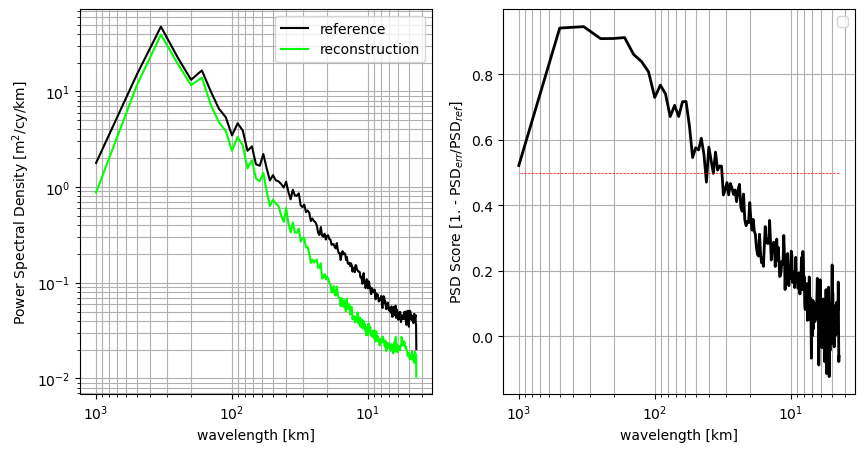

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_DJF.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D3_DJF.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.998630658810197
INFO:root: 
INFO:root:  STD RMSE Score = 0.0004810434939784145
INFO:root: 
INFO:root:  MEAN RMSE = 0.3808497807505158
INFO:root: 
INFO:root:  STD RMSE = 0.13354799127944034
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_DJF.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 33km


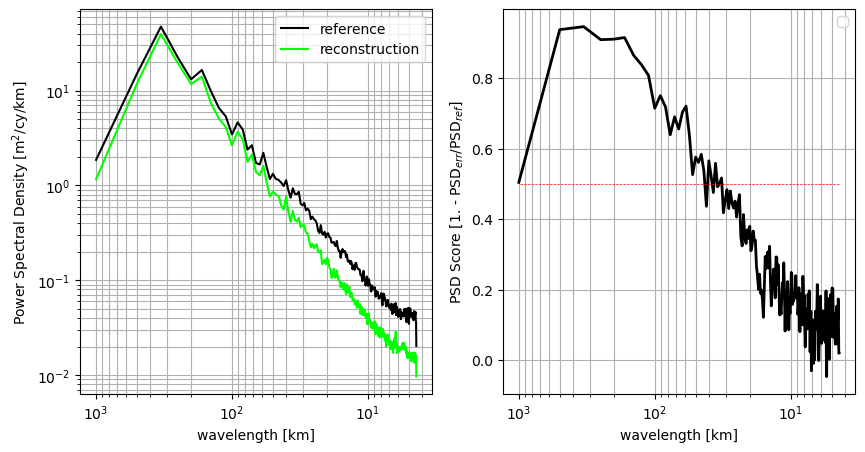

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_MAM.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_MAM.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9986615807193927
INFO:root: 
INFO:root:  STD RMSE Score = 0.0004107752089555018
INFO:root: 
INFO:root:  MEAN RMSE = 0.3753162326170778
INFO:root: 
INFO:root:  STD RMSE = 0.11594376244159409
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_MAM.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 4km


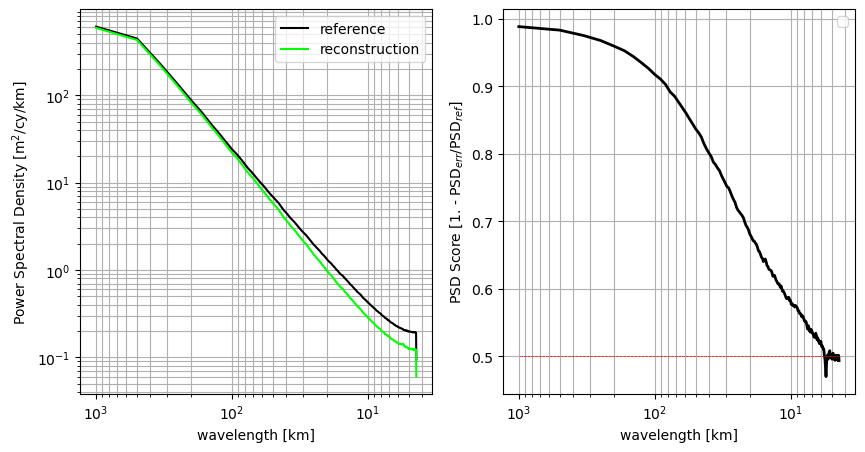

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_MAM.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_MAM.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9986336409635203
INFO:root: 
INFO:root:  STD RMSE Score = 0.00042469330348298735
INFO:root: 
INFO:root:  MEAN RMSE = 0.3831285196419962
INFO:root: 
INFO:root:  STD RMSE = 0.11975596470472205
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_MAM.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 4km


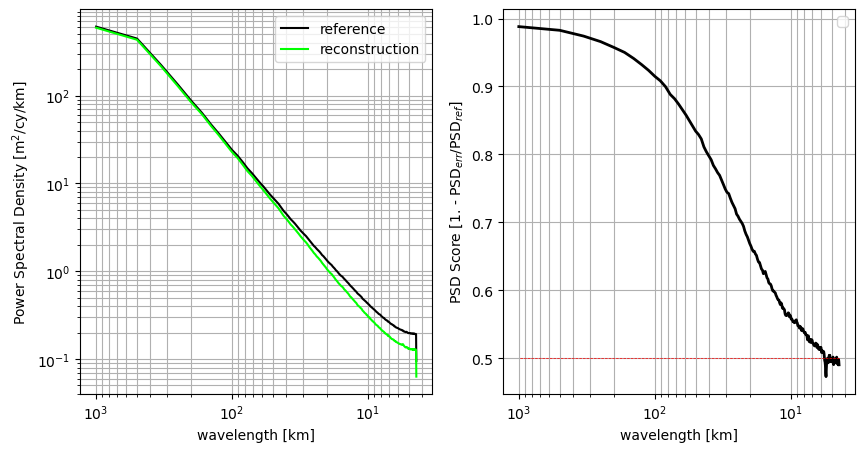

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_MAM.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1_MAM.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9988293595289315
INFO:root: 
INFO:root:  STD RMSE Score = 0.0005915491865941435
INFO:root: 
INFO:root:  MEAN RMSE = 0.3282265457266839
INFO:root: 
INFO:root:  STD RMSE = 0.16668541523192176
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_MAM.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 51km


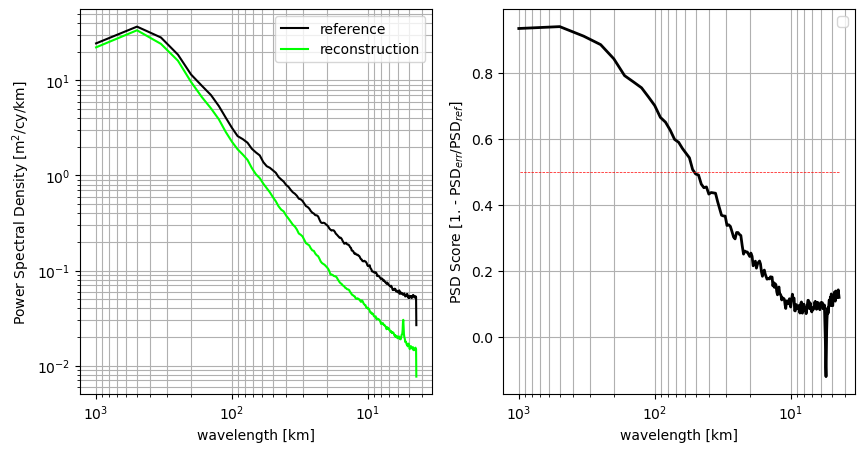

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_MAM.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1_tr_all_MAM.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9988362399518116
INFO:root: 
INFO:root:  STD RMSE Score = 0.0005953283604392275
INFO:root: 
INFO:root:  MEAN RMSE = 0.32630499931382534
INFO:root: 
INFO:root:  STD RMSE = 0.1677290015651173
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_tr_all_MAM.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 46km


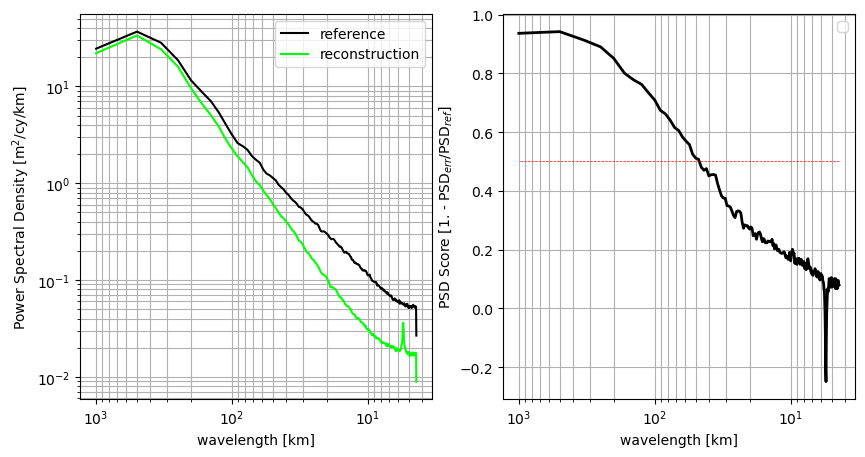

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_MAM.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D1_MAM.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.998827814058539
INFO:root: 
INFO:root:  STD RMSE Score = 0.0005995583494524159
INFO:root: 
INFO:root:  MEAN RMSE = 0.32868102062221927
INFO:root: 
INFO:root:  STD RMSE = 0.16894169730564124
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_MAM.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 50km


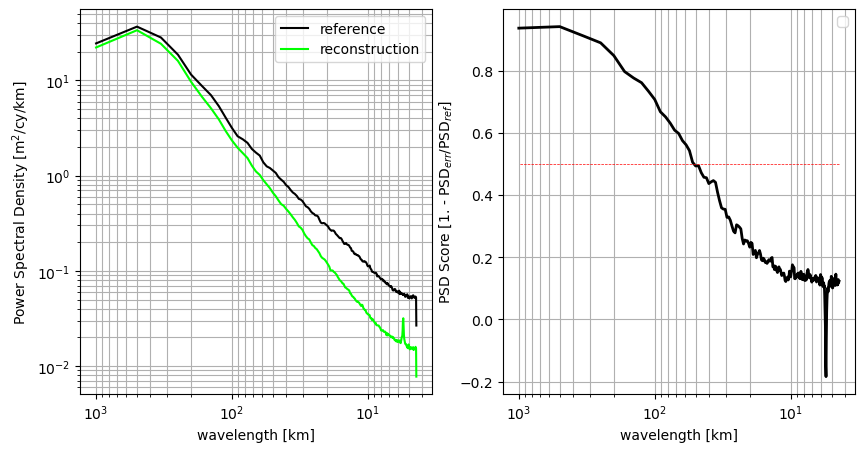

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_MAM.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2_MAM.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9986886122511534
INFO:root: 
INFO:root:  STD RMSE Score = 0.00046824359013030885
INFO:root: 
INFO:root:  MEAN RMSE = 0.36684197112906575
INFO:root: 
INFO:root:  STD RMSE = 0.13068666165468346
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_MAM.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 11km


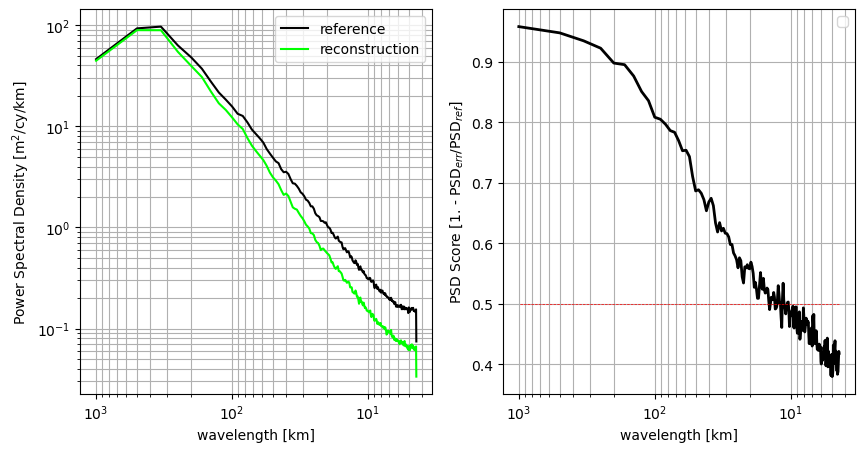

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_MAM.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2_tr_all_MAM.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9986809427523872
INFO:root: 
INFO:root:  STD RMSE Score = 0.00046731695655967355
INFO:root: 
INFO:root:  MEAN RMSE = 0.36898974492325526
INFO:root: 
INFO:root:  STD RMSE = 0.1304234179349873
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_tr_all_MAM.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 16km


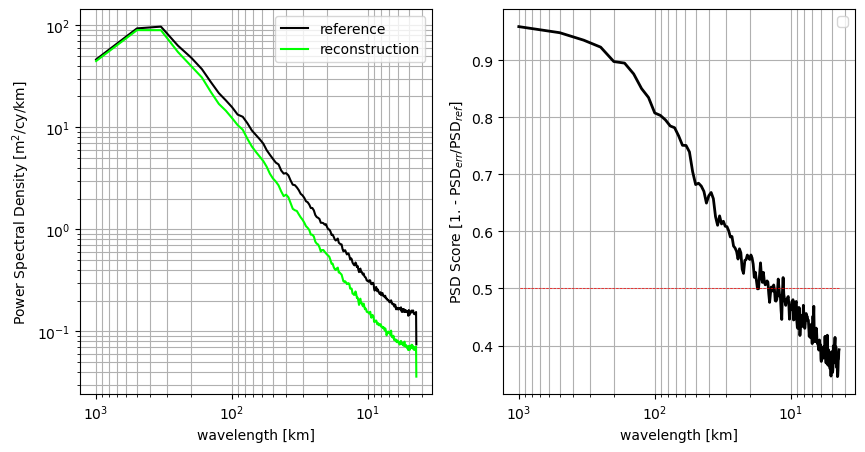

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_MAM.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D2_MAM.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9987017075909592
INFO:root: 
INFO:root:  STD RMSE Score = 0.00048208699391398324
INFO:root: 
INFO:root:  MEAN RMSE = 0.36319127390433736
INFO:root: 
INFO:root:  STD RMSE = 0.13456443848070973
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_MAM.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 14km


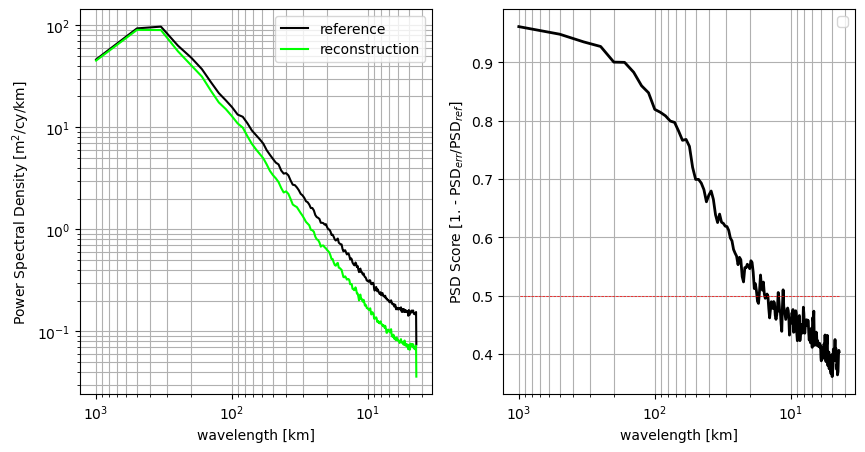

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_MAM.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3_MAM.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9988776597617922
INFO:root: 
INFO:root:  STD RMSE Score = 0.00059893275543361
INFO:root: 
INFO:root:  MEAN RMSE = 0.3133442576108251
INFO:root: 
INFO:root:  STD RMSE = 0.16971948701923023
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_MAM.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 92km


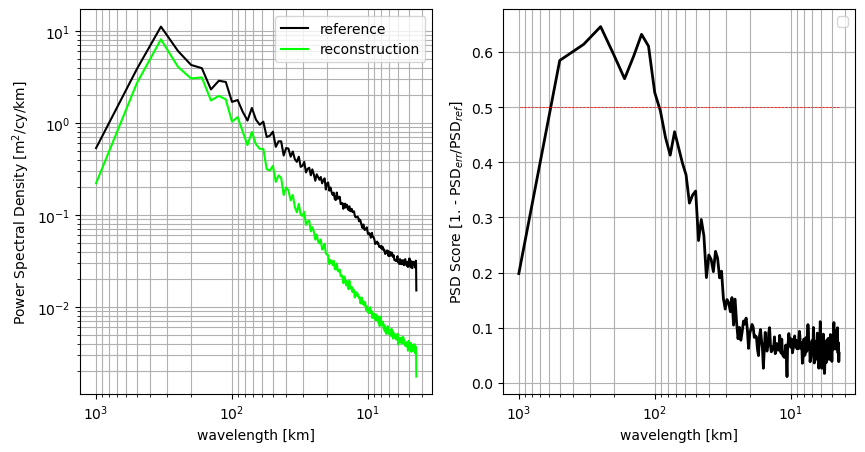

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_MAM.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3_tr_all_MAM.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9988512766351247
INFO:root: 
INFO:root:  STD RMSE Score = 0.0006161709473705801
INFO:root: 
INFO:root:  MEAN RMSE = 0.3207141330499682
INFO:root: 
INFO:root:  STD RMSE = 0.1745923579180112
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_tr_all_MAM.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 86km


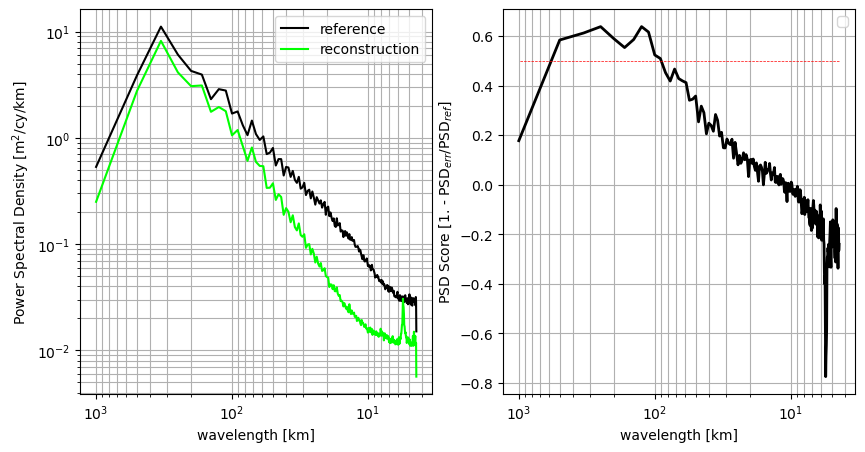

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_MAM.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D3_MAM.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9988291830811985
INFO:root: 
INFO:root:  STD RMSE Score = 0.0006405273952312346
INFO:root: 
INFO:root:  MEAN RMSE = 0.3268498246550361
INFO:root: 
INFO:root:  STD RMSE = 0.18132338499225045
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_MAM.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 124km


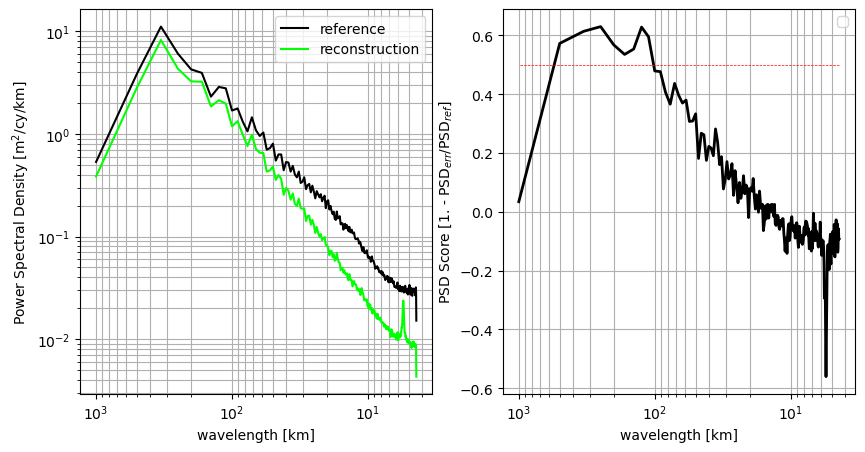

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_JJA.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_JJA.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9979579000167018
INFO:root: 
INFO:root:  STD RMSE Score = 0.0005251894724012403
INFO:root: 
INFO:root:  MEAN RMSE = 0.5894760905636373
INFO:root: 
INFO:root:  STD RMSE = 0.15090419077713726
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_JJA.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


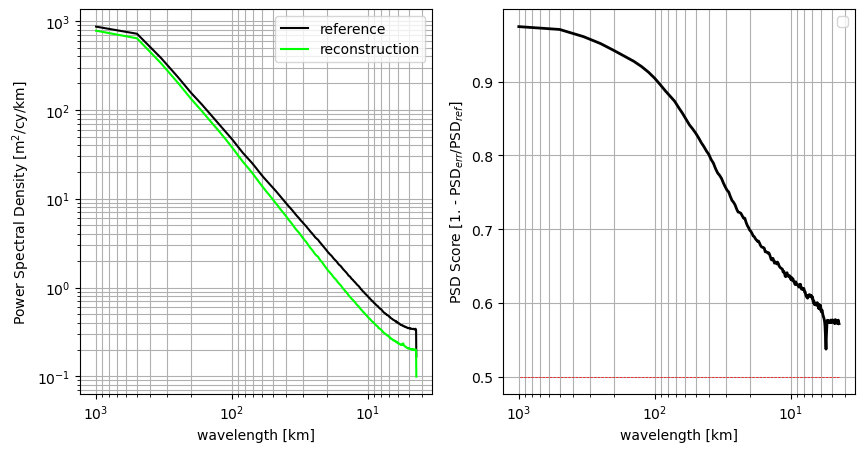

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_JJA.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_JJA.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9979540269112944
INFO:root: 
INFO:root:  STD RMSE Score = 0.0005352855224513584
INFO:root: 
INFO:root:  MEAN RMSE = 0.5905853147220147
INFO:root: 
INFO:root:  STD RMSE = 0.15379788803302993
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_JJA.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


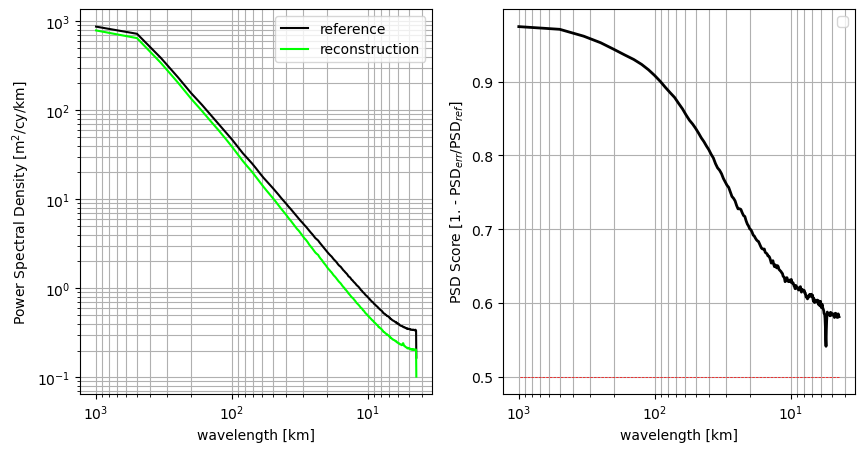

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_JJA.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1_JJA.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.998380368829723
INFO:root: 
INFO:root:  STD RMSE Score = 0.000650356476686578
INFO:root: 
INFO:root:  MEAN RMSE = 0.46787156605724645
INFO:root: 
INFO:root:  STD RMSE = 0.18708579500767122
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_JJA.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 74km


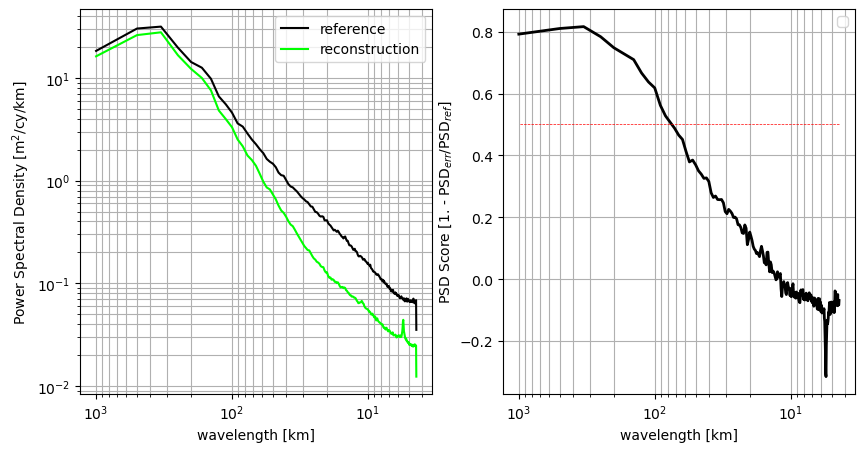

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_JJA.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1_tr_all_JJA.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9983941324019682
INFO:root: 
INFO:root:  STD RMSE Score = 0.0006593512263964452
INFO:root: 
INFO:root:  MEAN RMSE = 0.4638833181470889
INFO:root: 
INFO:root:  STD RMSE = 0.1896585609560506
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_tr_all_JJA.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 68km


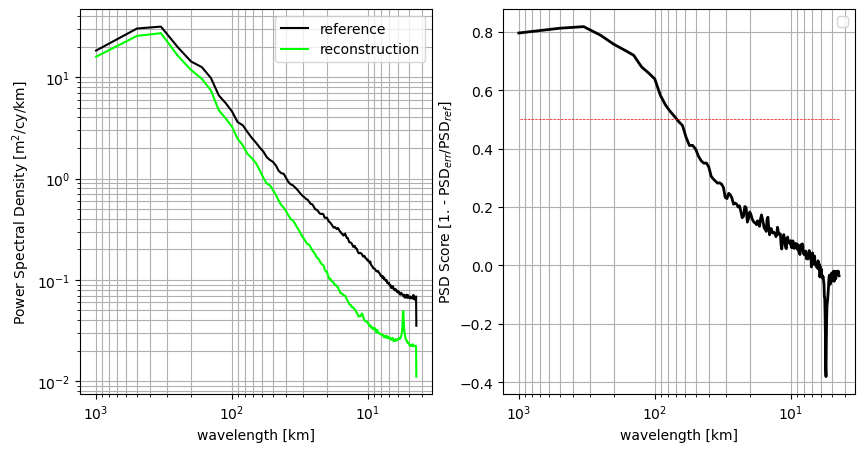

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_JJA.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D1_JJA.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9983665912647158
INFO:root: 
INFO:root:  STD RMSE Score = 0.0006793379641826886
INFO:root: 
INFO:root:  MEAN RMSE = 0.47183010736045927
INFO:root: 
INFO:root:  STD RMSE = 0.19539957888785478
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_JJA.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 72km


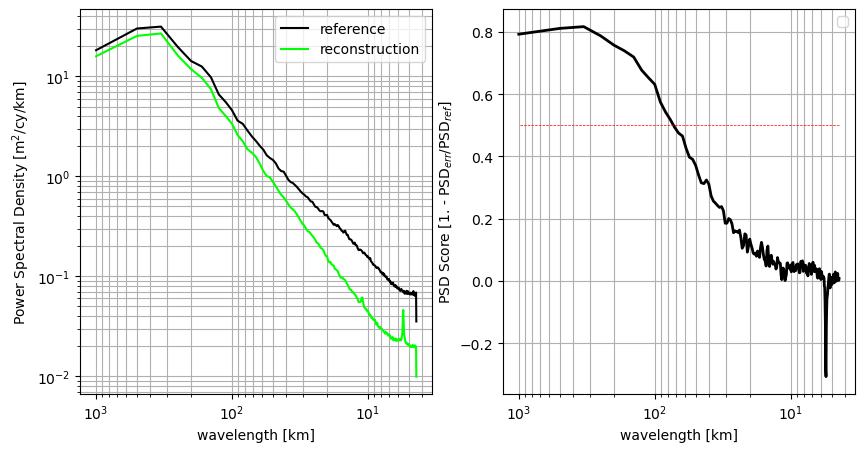

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_JJA.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2_JJA.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9981886748696541
INFO:root: 
INFO:root:  STD RMSE Score = 0.001023836939947009
INFO:root: 
INFO:root:  MEAN RMSE = 0.5159280469000712
INFO:root: 
INFO:root:  STD RMSE = 0.29037763361568625
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_JJA.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 5km


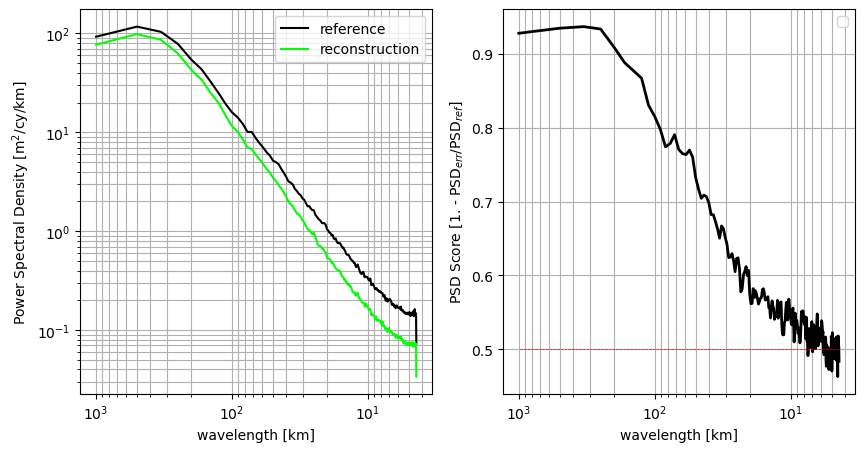

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_JJA.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2_tr_all_JJA.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.998180736643356
INFO:root: 
INFO:root:  STD RMSE Score = 0.00101971752119931
INFO:root: 
INFO:root:  MEAN RMSE = 0.5181847554882503
INFO:root: 
INFO:root:  STD RMSE = 0.28916650305702896
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_tr_all_JJA.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 6km


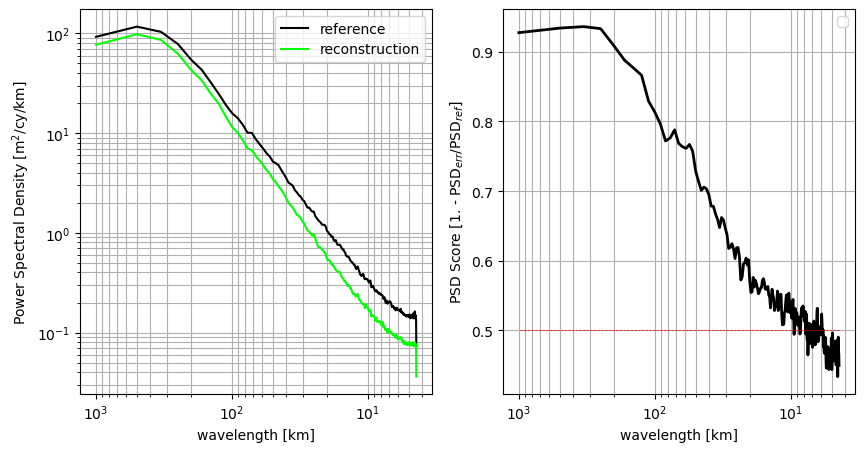

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_JJA.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D2_JJA.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.998124077827702
INFO:root: 
INFO:root:  STD RMSE Score = 0.0010409335781027095
INFO:root: 
INFO:root:  MEAN RMSE = 0.5343539382480487
INFO:root: 
INFO:root:  STD RMSE = 0.2952271006281278
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_JJA.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 6km


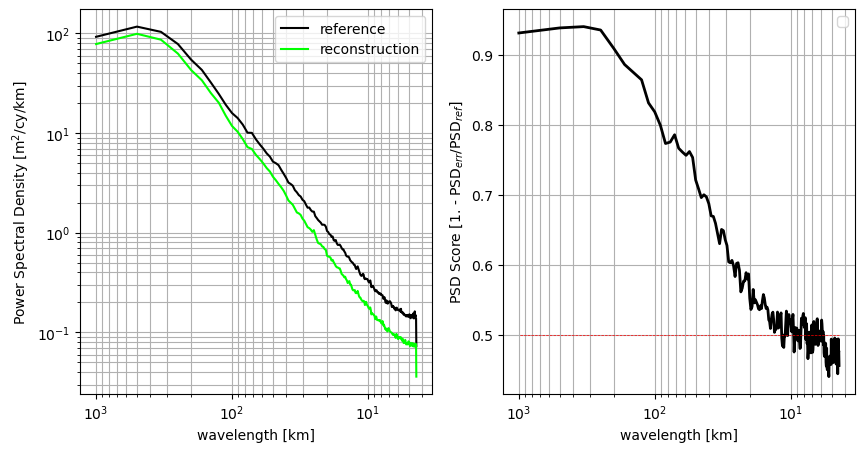

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_JJA.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3_JJA.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9982082996544799
INFO:root: 
INFO:root:  STD RMSE Score = 0.000912210220960304
INFO:root: 
INFO:root:  MEAN RMSE = 0.5232062654328505
INFO:root: 
INFO:root:  STD RMSE = 0.266236377293296
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_JJA.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 11km


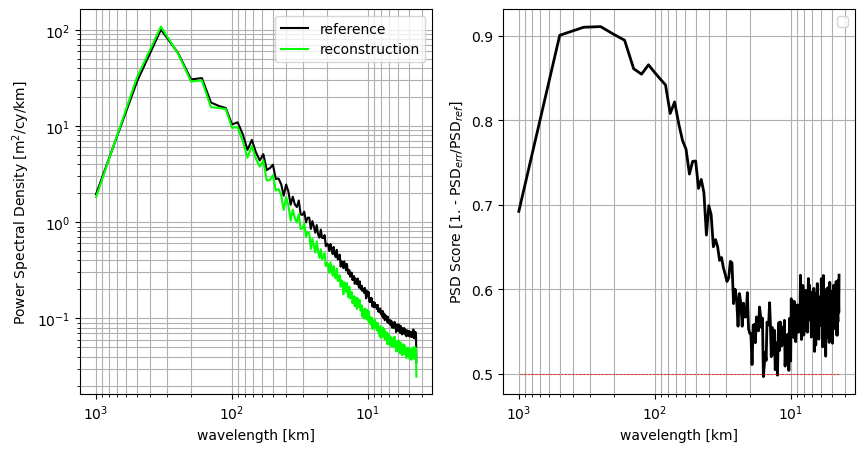

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_JJA.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3_tr_all_JJA.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9981959575687703
INFO:root: 
INFO:root:  STD RMSE Score = 0.0009293677624694942
INFO:root: 
INFO:root:  MEAN RMSE = 0.5268087959773433
INFO:root: 
INFO:root:  STD RMSE = 0.27120494677012463
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_tr_all_JJA.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 8km


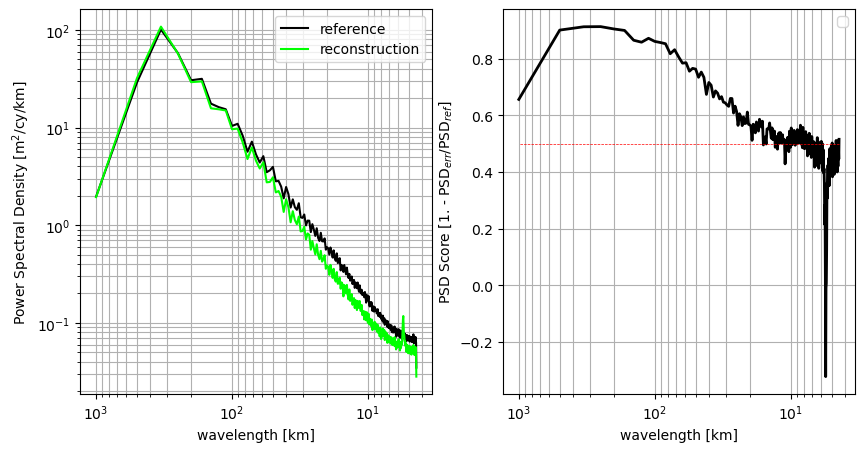

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_JJA.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D3_JJA.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9981753828974587
INFO:root: 
INFO:root:  STD RMSE Score = 0.0009547655569922901
INFO:root: 
INFO:root:  MEAN RMSE = 0.5327916203978471
INFO:root: 
INFO:root:  STD RMSE = 0.27854931726529225
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_JJA.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 9km


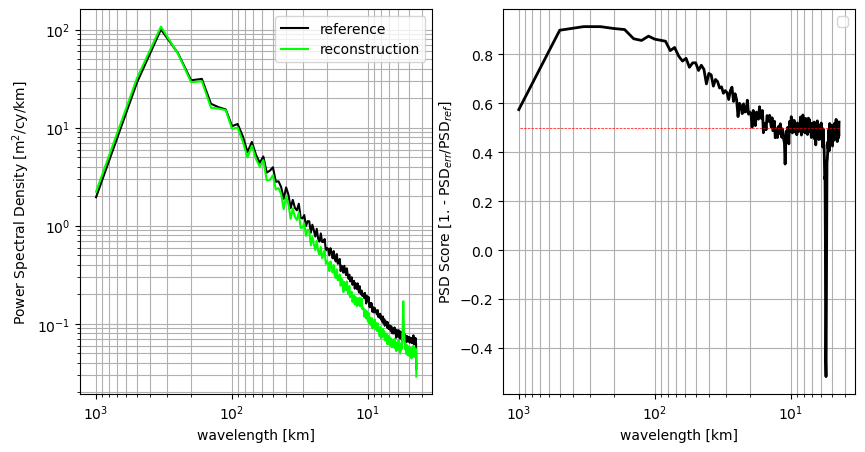

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_SON.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_SON.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.998695163914045
INFO:root: 
INFO:root:  STD RMSE Score = 0.0002639170854109935
INFO:root: 
INFO:root:  MEAN RMSE = 0.37245045662198084
INFO:root: 
INFO:root:  STD RMSE = 0.0750133397802748
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_SON.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 19km


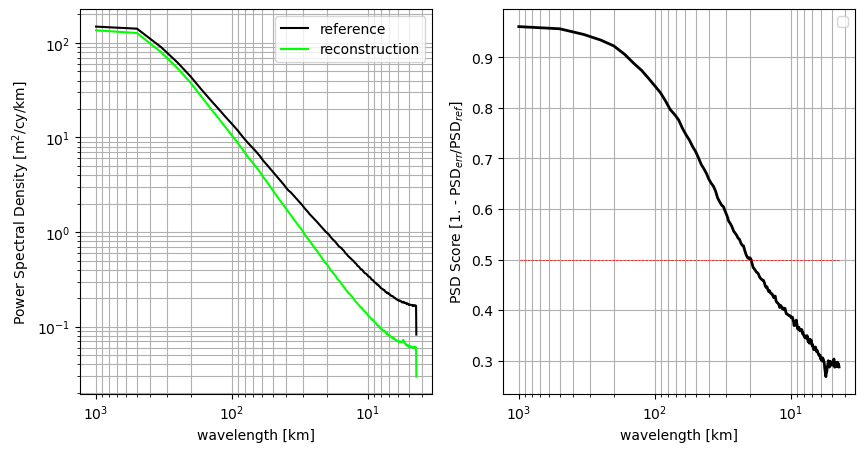

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_SON.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_SON.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9986933433668866
INFO:root: 
INFO:root:  STD RMSE Score = 0.000263553114771677
INFO:root: 
INFO:root:  MEAN RMSE = 0.37295657686792144
INFO:root: 
INFO:root:  STD RMSE = 0.0748237939681995
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_SON.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 20km


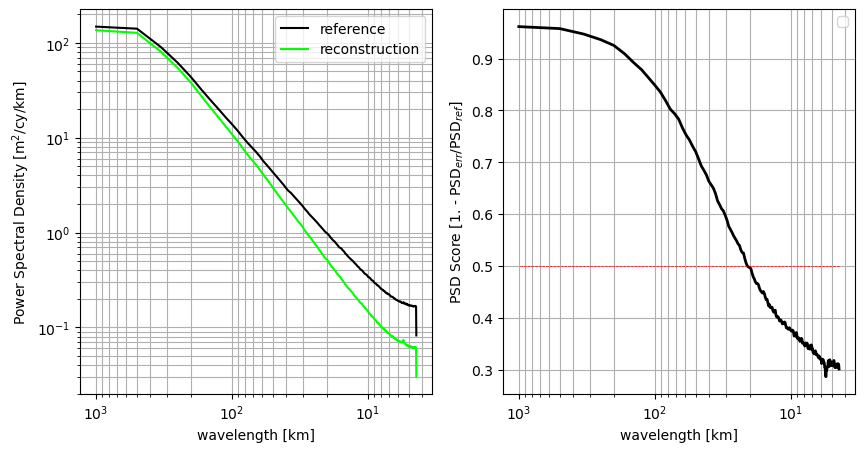

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_SON.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1_SON.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9990157493711014
INFO:root: 
INFO:root:  STD RMSE Score = 0.0003668239254568555
INFO:root: 
INFO:root:  MEAN RMSE = 0.2824624050100659
INFO:root: 
INFO:root:  STD RMSE = 0.10605974075396647
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_SON.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 19km


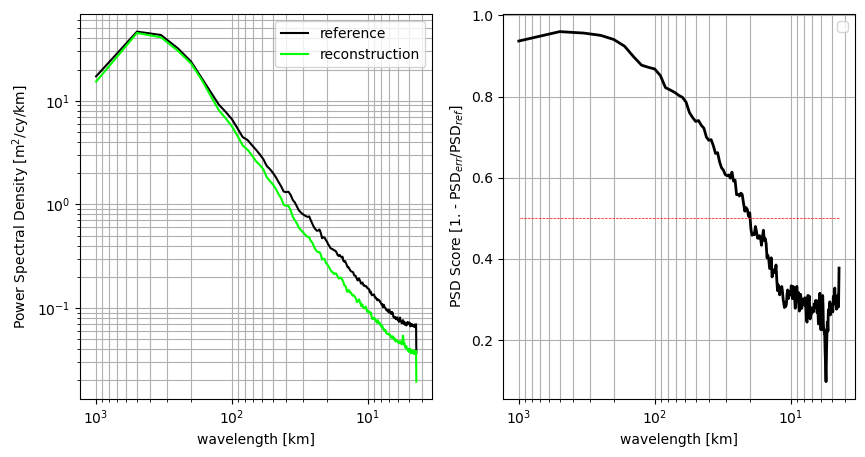

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_SON.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1_tr_all_SON.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9990317999983135
INFO:root: 
INFO:root:  STD RMSE Score = 0.0003685035904910579
INFO:root: 
INFO:root:  MEAN RMSE = 0.27785313047962834
INFO:root: 
INFO:root:  STD RMSE = 0.10650043500251836
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_tr_all_SON.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 17km


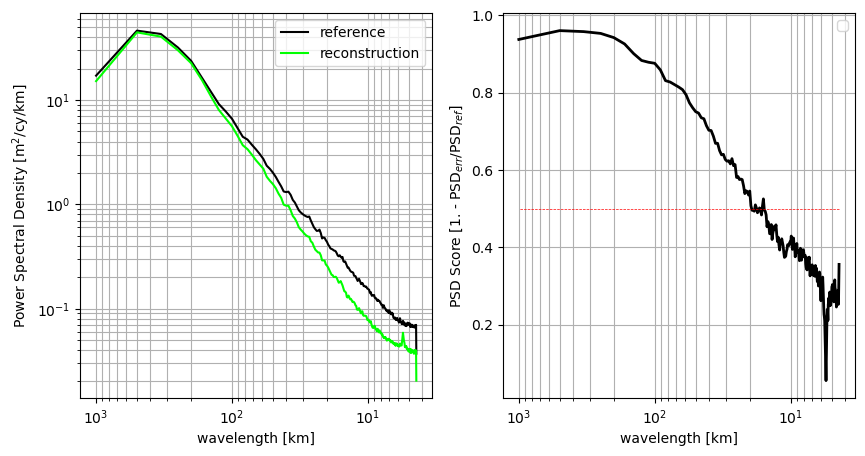

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_SON.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D1_SON.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9990033454842628
INFO:root: 
INFO:root:  STD RMSE Score = 0.0003666837014214404
INFO:root: 
INFO:root:  MEAN RMSE = 0.28599850582082276
INFO:root: 
INFO:root:  STD RMSE = 0.10595178572444072
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_SON.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 20km


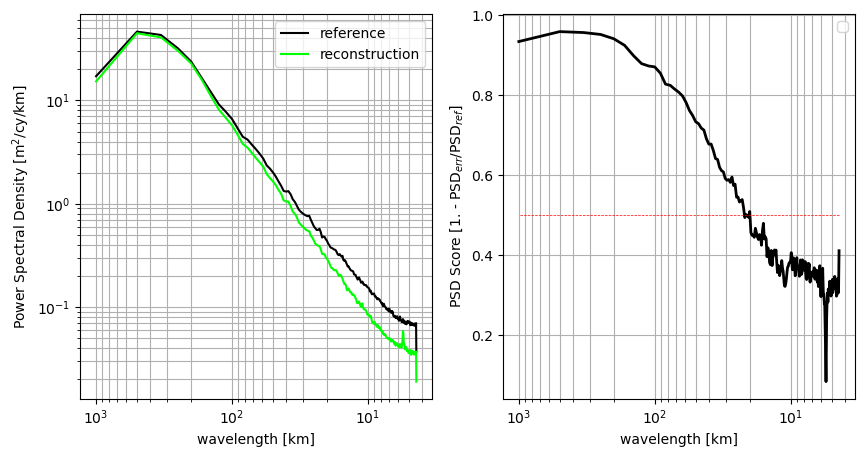

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_SON.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2_SON.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9987369252483652
INFO:root: 
INFO:root:  STD RMSE Score = 0.0006404352764095444
INFO:root: 
INFO:root:  MEAN RMSE = 0.3572794421705026
INFO:root: 
INFO:root:  STD RMSE = 0.1816234859260593
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_SON.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 13km


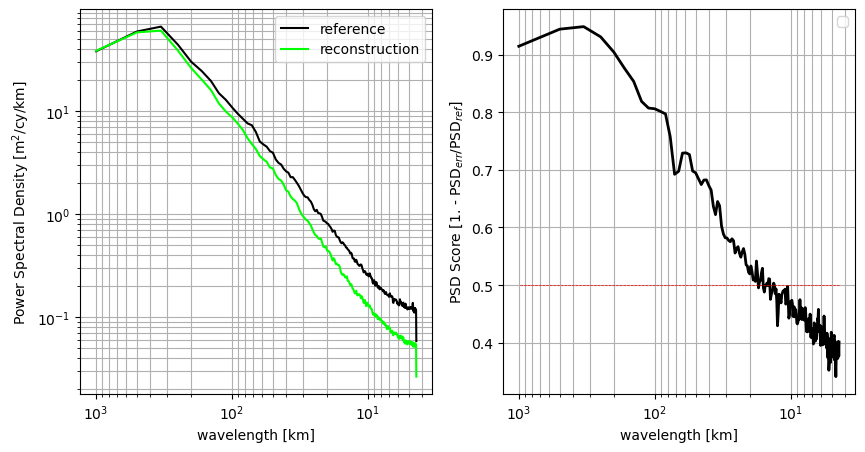

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_SON.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2_tr_all_SON.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9987319450637061
INFO:root: 
INFO:root:  STD RMSE Score = 0.0006348293778726902
INFO:root: 
INFO:root:  MEAN RMSE = 0.35868902573549977
INFO:root: 
INFO:root:  STD RMSE = 0.18004003987340392
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_tr_all_SON.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 15km


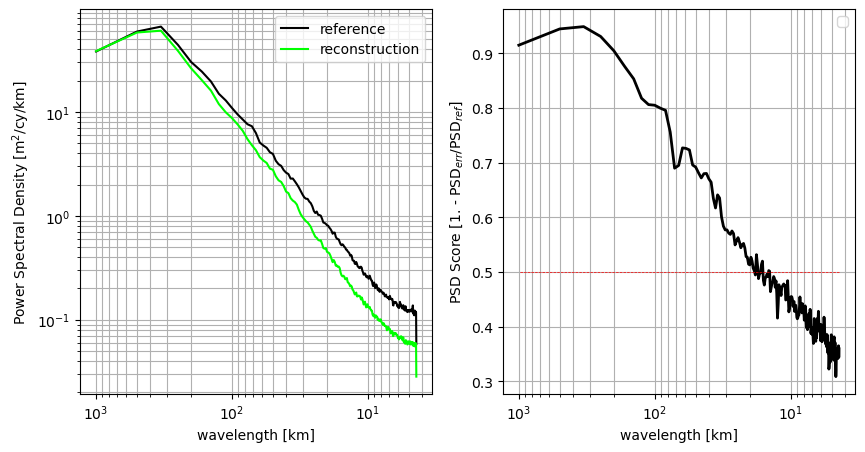

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_SON.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D2_SON.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9987221959835081
INFO:root: 
INFO:root:  STD RMSE Score = 0.0006537636122761257
INFO:root: 
INFO:root:  MEAN RMSE = 0.3614475358795476
INFO:root: 
INFO:root:  STD RMSE = 0.1853972856898002
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_SON.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 19km


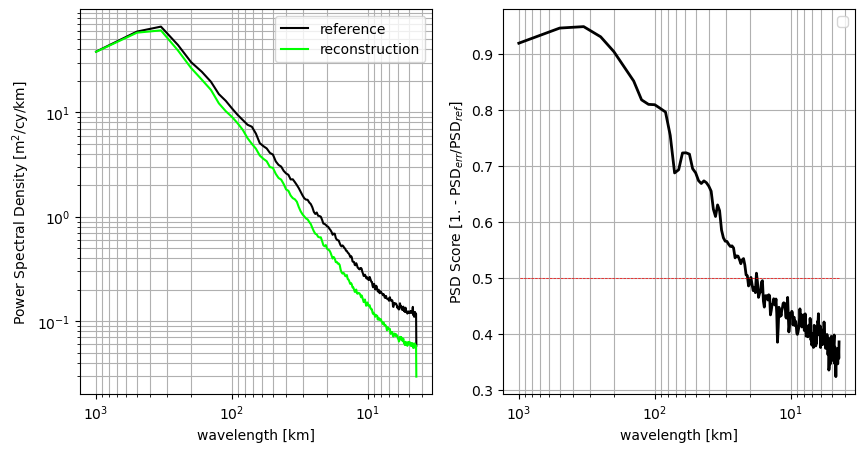

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_SON.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3_SON.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9987807139679294
INFO:root: 
INFO:root:  STD RMSE Score = 0.00037844747219695815
INFO:root: 
INFO:root:  MEAN RMSE = 0.3486535057167538
INFO:root: 
INFO:root:  STD RMSE = 0.10743288933748976
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_SON.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 7km


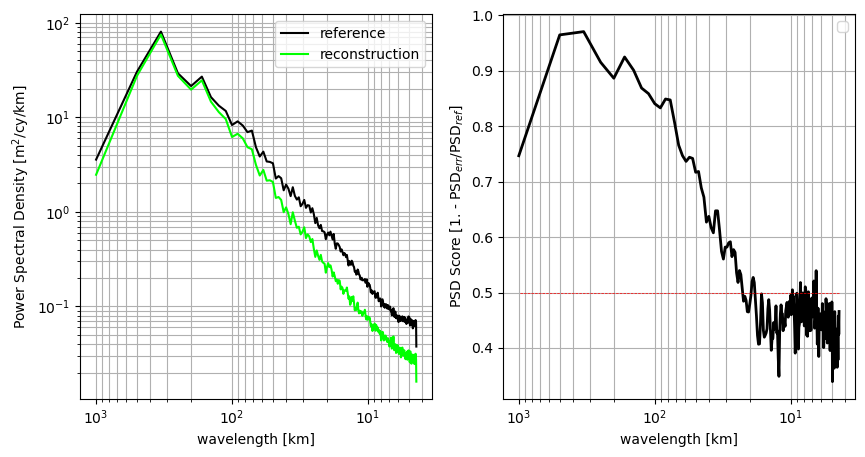

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_SON.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3_tr_all_SON.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9987945929094459
INFO:root: 
INFO:root:  STD RMSE Score = 0.00038217835922452117
INFO:root: 
INFO:root:  MEAN RMSE = 0.344723615531475
INFO:root: 
INFO:root:  STD RMSE = 0.10880040389908606
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_tr_all_SON.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 15km


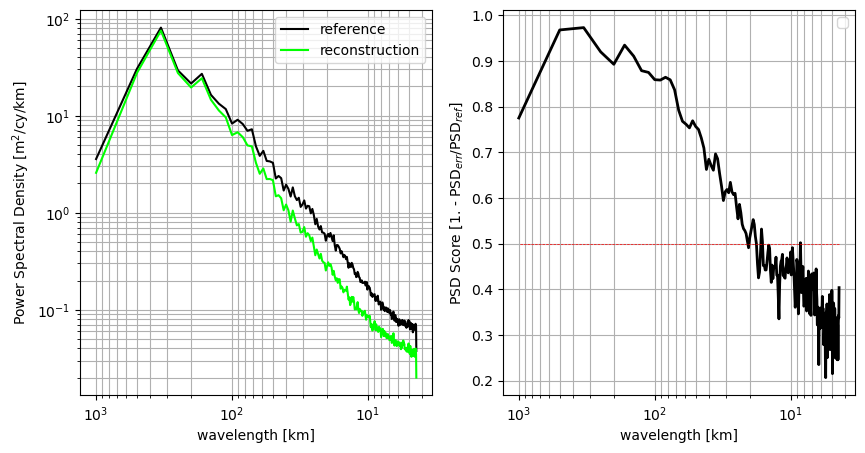

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_SON.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D3_SON.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.9987932318764813
INFO:root: 
INFO:root:  STD RMSE Score = 0.0004163497808462733
INFO:root: 
INFO:root:  MEAN RMSE = 0.3450980468833207
INFO:root: 
INFO:root:  STD RMSE = 0.11867819620138223
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_SON.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 10km


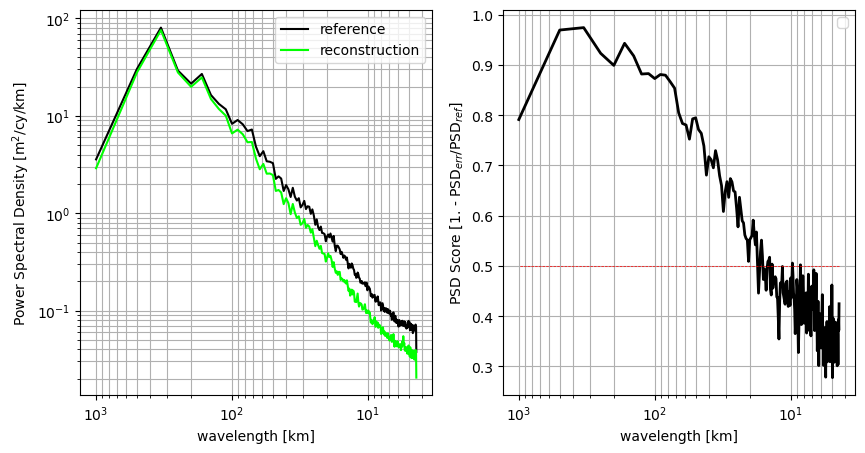

In [9]:
file_dl = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext.nc"
file_dl_dm1 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval.nc"
file_dl_dm2 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval.nc"
file_dl_dm3 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval.nc"
file_oi = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc"

bin_lat_step = 0.1
bin_lon_step = 0.1
bin_time_step = '1D'
delta_t = 0.9434  # s
velocity = 6.77   # km/s
delta_x = velocity * delta_t
delta_x = 2.2
lenght_scale = 1000 # km

sel_time = ["DJF"]
# NS-BS Seas
lon_min = np.min(xr.open_dataset(file_dl).lon.data)
lon_max = np.max(xr.open_dataset(file_dl).lon.data)
lat_min = np.min(xr.open_dataset(file_dl).lat.data)
lat_max = np.max(xr.open_dataset(file_dl).lat.data)
leaderboard_DJF_nrmse_dl, leaderboard_DJF_nrmse_std_dl, leaderboard_DJF_psds_score_dl = run_comparison(file_dl,"4DVarNet_DJF",byseason=True,crop=True)
leaderboard_DJF_nrmse_oi, leaderboard_DJF_nrmse_std_oi, leaderboard_DJF_psds_score_oi = run_comparison(file_oi,"OI_DJF",byseason=True,crop=True)
# D1
lon_min = np.min(xr.open_dataset(file_dl_dm1).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm1).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm1).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm1).lat.data)
leaderboard_DJF_nrmse_dl_dm1, leaderboard_DJF_nrmse_std_dl_dm1, leaderboard_DJF_psds_score_dl_dm1 = run_comparison(file_dl_dm1,"4DVarNet_D1_DJF",byseason=True)
leaderboard_DJF_nrmse_dl_dm1_tr_all, leaderboard_DJF_nrmse_std_dl_dm1_tr_all, leaderboard_DJF_psds_score_dl_dm1_tr_all = run_comparison(file_dl,"4DVarNet_D1_tr_all_DJF",crop=True,byseason=True)
leaderboard_DJF_nrmse_oi_dm1, leaderboard_DJF_nrmse_std_oi_dm1, leaderboard_DJF_psds_score_oi_dm1 = run_comparison(file_oi,"OI_D1_DJF",crop=True,byseason=True)
# D2
lon_min = np.min(xr.open_dataset(file_dl_dm2).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm2).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm2).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm2).lat.data)
leaderboard_DJF_nrmse_dl_dm2, leaderboard_DJF_nrmse_std_dl_dm2, leaderboard_DJF_psds_score_dl_dm2 = run_comparison(file_dl_dm2,"4DVarNet_D2_DJF",byseason=True)
leaderboard_DJF_nrmse_dl_dm2_tr_all, leaderboard_DJF_nrmse_std_dl_dm2_tr_all, leaderboard_DJF_psds_score_dl_dm2_tr_all = run_comparison(file_dl,"4DVarNet_D2_tr_all_DJF",crop=True,byseason=True)
leaderboard_DJF_nrmse_oi_dm2, leaderboard_DJF_nrmse_std_oi_dm2, leaderboard_DJF_psds_score_oi_dm2 = run_comparison(file_oi,"OI_D2_DJF",crop=True,byseason=True)
# D3
lon_min = np.min(xr.open_dataset(file_dl_dm3).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm3).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm3).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm3).lat.data)
leaderboard_DJF_nrmse_dl_dm3, leaderboard_DJF_nrmse_std_dl_dm3, leaderboard_DJF_psds_score_dl_dm3 = run_comparison(file_dl_dm3,"4DVarNet_D3_DJF",byseason=True)
leaderboard_DJF_nrmse_dl_dm3_tr_all, leaderboard_DJF_nrmse_std_dl_dm3_tr_all, leaderboard_DJF_psds_score_dl_dm3_tr_all = run_comparison(file_dl,"4DVarNet_D3_tr_all_DJF",crop=True,byseason=True)
leaderboard_DJF_nrmse_oi_dm3, leaderboard_DJF_nrmse_std_oi_dm3, leaderboard_DJF_psds_score_oi_dm3 = run_comparison(file_oi,"OI_D3_DJF",crop=True,byseason=True)

sel_time = ["MAM"]
# NS-BS Seas
lon_min = np.min(xr.open_dataset(file_dl).lon.data)
lon_max = np.max(xr.open_dataset(file_dl).lon.data)
lat_min = np.min(xr.open_dataset(file_dl).lat.data)
lat_max = np.max(xr.open_dataset(file_dl).lat.data)
leaderboard_MAM_nrmse_dl, leaderboard_MAM_nrmse_std_dl, leaderboard_MAM_psds_score_dl = run_comparison(file_dl,"4DVarNet_MAM",byseason=True,crop=True)
leaderboard_MAM_nrmse_oi, leaderboard_MAM_nrmse_std_oi, leaderboard_MAM_psds_score_oi = run_comparison(file_oi,"OI_MAM",byseason=True,crop=True)
# D1
lon_min = np.min(xr.open_dataset(file_dl_dm1).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm1).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm1).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm1).lat.data)
leaderboard_MAM_nrmse_dl_dm1, leaderboard_MAM_nrmse_std_dl_dm1, leaderboard_MAM_psds_score_dl_dm1 = run_comparison(file_dl_dm1,"4DVarNet_D1_MAM",byseason=True)
leaderboard_MAM_nrmse_dl_dm1_tr_all, leaderboard_MAM_nrmse_std_dl_dm1_tr_all, leaderboard_MAM_psds_score_dl_dm1_tr_all = run_comparison(file_dl,"4DVarNet_D1_tr_all_MAM",crop=True,byseason=True)
leaderboard_MAM_nrmse_oi_dm1, leaderboard_MAM_nrmse_std_oi_dm1, leaderboard_MAM_psds_score_oi_dm1 = run_comparison(file_oi,"OI_D1_MAM",crop=True,byseason=True)
# D2
lon_min = np.min(xr.open_dataset(file_dl_dm2).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm2).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm2).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm2).lat.data)
leaderboard_MAM_nrmse_dl_dm2, leaderboard_MAM_nrmse_std_dl_dm2, leaderboard_MAM_psds_score_dl_dm2 = run_comparison(file_dl_dm2,"4DVarNet_D2_MAM",byseason=True)
leaderboard_MAM_nrmse_dl_dm2_tr_all, leaderboard_MAM_nrmse_std_dl_dm2_tr_all, leaderboard_MAM_psds_score_dl_dm2_tr_all = run_comparison(file_dl,"4DVarNet_D2_tr_all_MAM",crop=True,byseason=True)
leaderboard_MAM_nrmse_oi_dm2, leaderboard_MAM_nrmse_std_oi_dm2, leaderboard_MAM_psds_score_oi_dm2 = run_comparison(file_oi,"OI_D2_MAM",crop=True,byseason=True)
# D3
lon_min = np.min(xr.open_dataset(file_dl_dm3).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm3).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm3).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm3).lat.data)
leaderboard_MAM_nrmse_dl_dm3, leaderboard_MAM_nrmse_std_dl_dm3, leaderboard_MAM_psds_score_dl_dm3 = run_comparison(file_dl_dm3,"4DVarNet_D3_MAM",byseason=True)
leaderboard_MAM_nrmse_dl_dm3_tr_all, leaderboard_MAM_nrmse_std_dl_dm3_tr_all, leaderboard_MAM_psds_score_dl_dm3_tr_all = run_comparison(file_dl,"4DVarNet_D3_tr_all_MAM",crop=True,byseason=True)
leaderboard_MAM_nrmse_oi_dm3, leaderboard_MAM_nrmse_std_oi_dm3, leaderboard_MAM_psds_score_oi_dm3 = run_comparison(file_oi,"OI_D3_MAM",crop=True,byseason=True)

sel_time = ["JJA"]
# NS-BS Seas
lon_min = np.min(xr.open_dataset(file_dl).lon.data)
lon_max = np.max(xr.open_dataset(file_dl).lon.data)
lat_min = np.min(xr.open_dataset(file_dl).lat.data)
lat_max = np.max(xr.open_dataset(file_dl).lat.data)
leaderboard_JJA_nrmse_dl, leaderboard_JJA_nrmse_std_dl, leaderboard_JJA_psds_score_dl = run_comparison(file_dl,"4DVarNet_JJA",byseason=True,crop=True)
leaderboard_JJA_nrmse_oi, leaderboard_JJA_nrmse_std_oi, leaderboard_JJA_psds_score_oi = run_comparison(file_oi,"OI_JJA",byseason=True,crop=True)
# D1
lon_min = np.min(xr.open_dataset(file_dl_dm1).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm1).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm1).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm1).lat.data)
leaderboard_JJA_nrmse_dl_dm1, leaderboard_JJA_nrmse_std_dl_dm1, leaderboard_JJA_psds_score_dl_dm1 = run_comparison(file_dl_dm1,"4DVarNet_D1_JJA",byseason=True)
leaderboard_JJA_nrmse_dl_dm1_tr_all, leaderboard_JJA_nrmse_std_dl_dm1_tr_all, leaderboard_JJA_psds_score_dl_dm1_tr_all = run_comparison(file_dl,"4DVarNet_D1_tr_all_JJA",crop=True,byseason=True)
leaderboard_JJA_nrmse_oi_dm1, leaderboard_JJA_nrmse_std_oi_dm1, leaderboard_JJA_psds_score_oi_dm1 = run_comparison(file_oi,"OI_D1_JJA",crop=True,byseason=True)
# D2
lon_min = np.min(xr.open_dataset(file_dl_dm2).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm2).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm2).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm2).lat.data)
leaderboard_JJA_nrmse_dl_dm2, leaderboard_JJA_nrmse_std_dl_dm2, leaderboard_JJA_psds_score_dl_dm2 = run_comparison(file_dl_dm2,"4DVarNet_D2_JJA",byseason=True)
leaderboard_JJA_nrmse_dl_dm2_tr_all, leaderboard_JJA_nrmse_std_dl_dm2_tr_all, leaderboard_JJA_psds_score_dl_dm2_tr_all = run_comparison(file_dl,"4DVarNet_D2_tr_all_JJA",crop=True,byseason=True)
leaderboard_JJA_nrmse_oi_dm2, leaderboard_JJA_nrmse_std_oi_dm2, leaderboard_JJA_psds_score_oi_dm2 = run_comparison(file_oi,"OI_D2_JJA",crop=True,byseason=True)
# D3
lon_min = np.min(xr.open_dataset(file_dl_dm3).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm3).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm3).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm3).lat.data)
leaderboard_JJA_nrmse_dl_dm3, leaderboard_JJA_nrmse_std_dl_dm3, leaderboard_JJA_psds_score_dl_dm3 = run_comparison(file_dl_dm3,"4DVarNet_D3_JJA",byseason=True)
leaderboard_JJA_nrmse_dl_dm3_tr_all, leaderboard_JJA_nrmse_std_dl_dm3_tr_all, leaderboard_JJA_psds_score_dl_dm3_tr_all = run_comparison(file_dl,"4DVarNet_D3_tr_all_JJA",crop=True,byseason=True)
leaderboard_JJA_nrmse_oi_dm3, leaderboard_JJA_nrmse_std_oi_dm3, leaderboard_JJA_psds_score_oi_dm3 = run_comparison(file_oi,"OI_D3_JJA",crop=True,byseason=True)

sel_time = ["SON"]
# NS-BS Seas
lon_min = np.min(xr.open_dataset(file_dl).lon.data)
lon_max = np.max(xr.open_dataset(file_dl).lon.data)
lat_min = np.min(xr.open_dataset(file_dl).lat.data)
lat_max = np.max(xr.open_dataset(file_dl).lat.data)
leaderboard_SON_nrmse_dl, leaderboard_SON_nrmse_std_dl, leaderboard_SON_psds_score_dl = run_comparison(file_dl,"4DVarNet_SON",byseason=True,crop=True)
leaderboard_SON_nrmse_oi, leaderboard_SON_nrmse_std_oi, leaderboard_SON_psds_score_oi = run_comparison(file_oi,"OI_SON",byseason=True,crop=True)
# D1
lon_min = np.min(xr.open_dataset(file_dl_dm1).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm1).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm1).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm1).lat.data)
leaderboard_SON_nrmse_dl_dm1, leaderboard_SON_nrmse_std_dl_dm1, leaderboard_SON_psds_score_dl_dm1 = run_comparison(file_dl_dm1,"4DVarNet_D1_SON",byseason=True)
leaderboard_SON_nrmse_dl_dm1_tr_all, leaderboard_SON_nrmse_std_dl_dm1_tr_all, leaderboard_SON_psds_score_dl_dm1_tr_all = run_comparison(file_dl,"4DVarNet_D1_tr_all_SON",crop=True,byseason=True)
leaderboard_SON_nrmse_oi_dm1, leaderboard_SON_nrmse_std_oi_dm1, leaderboard_SON_psds_score_oi_dm1 = run_comparison(file_oi,"OI_D1_SON",crop=True,byseason=True)
# D2
lon_min = np.min(xr.open_dataset(file_dl_dm2).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm2).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm2).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm2).lat.data)
leaderboard_SON_nrmse_dl_dm2, leaderboard_SON_nrmse_std_dl_dm2, leaderboard_SON_psds_score_dl_dm2 = run_comparison(file_dl_dm2,"4DVarNet_D2_SON",byseason=True)
leaderboard_SON_nrmse_dl_dm2_tr_all, leaderboard_SON_nrmse_std_dl_dm2_tr_all, leaderboard_SON_psds_score_dl_dm2_tr_all = run_comparison(file_dl,"4DVarNet_D2_tr_all_SON",crop=True,byseason=True)
leaderboard_SON_nrmse_oi_dm2, leaderboard_SON_nrmse_std_oi_dm2, leaderboard_SON_psds_score_oi_dm2 = run_comparison(file_oi,"OI_D2_SON",crop=True,byseason=True)
# D3
lon_min = np.min(xr.open_dataset(file_dl_dm3).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm3).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm3).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm3).lat.data)
leaderboard_SON_nrmse_dl_dm3, leaderboard_SON_nrmse_std_dl_dm3, leaderboard_SON_psds_score_dl_dm3 = run_comparison(file_dl_dm3,"4DVarNet_D3_SON",byseason=True)
leaderboard_SON_nrmse_dl_dm3_tr_all, leaderboard_SON_nrmse_std_dl_dm3_tr_all, leaderboard_SON_psds_score_dl_dm3_tr_all = run_comparison(file_dl,"4DVarNet_D3_tr_all_SON",crop=True,byseason=True)
leaderboard_SON_nrmse_oi_dm3, leaderboard_SON_nrmse_std_oi_dm3, leaderboard_SON_psds_score_oi_dm3 = run_comparison(file_oi,"OI_D3_SON",crop=True,byseason=True)

#### 2.2.2.2 Spatial RMSE gain mapping 

In [9]:
spa_stat_filenames_OI_DJF = ['/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_DJF.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_DJF.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_DJF.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_DJF.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_DJF.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_DJF.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_DJF.nc']
spa_stat_filenames_4DVarNet_DJF = ['/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_DJF.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_DJF.nc',
                         '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_DJF.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_DJF.nc',
                         '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_DJF.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_DJF.nc',
                        '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_DJF.nc']

spa_stat_filenames_OI_MAM = ['/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_MAM.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_MAM.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_MAM.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_MAM.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_MAM.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_MAM.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_MAM.nc']
spa_stat_filenames_4DVarNet_MAM = ['/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_MAM.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_MAM.nc',
                         '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_MAM.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_MAM.nc',
                         '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_MAM.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_MAM.nc',
                        '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_MAM.nc']

spa_stat_filenames_OI_JJA = ['/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_JJA.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_JJA.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_JJA.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_JJA.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_JJA.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_JJA.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_JJA.nc']
spa_stat_filenames_4DVarNet_JJA = ['/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_JJA.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_JJA.nc',
                         '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_JJA.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_JJA.nc',
                         '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_JJA.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_JJA.nc',
                        '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_JJA.nc']

spa_stat_filenames_OI_SON = ['/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_SON.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_SON.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_SON.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_SON.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_SON.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_SON.nc',
                  '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_SON.nc']
spa_stat_filenames_4DVarNet_SON = ['/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_SON.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_SON.nc',
                         '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_SON.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_SON.nc',
                         '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_SON.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_SON.nc',
                        '/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_SON.nc']

file_dl = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext.nc"
file_dl_dm1 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval.nc"
file_dl_dm2 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval.nc"
file_dl_dm3 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval.nc"
file_oi = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc"

spa_filenames_DJF =  spa_stat_filenames_OI_DJF + spa_stat_filenames_4DVarNet_DJF
spa_filenames_MAM =  spa_stat_filenames_OI_MAM + spa_stat_filenames_4DVarNet_MAM
spa_filenames_JJA =  spa_stat_filenames_OI_JJA + spa_stat_filenames_4DVarNet_JJA
spa_filenames_SON =  spa_stat_filenames_OI_SON + spa_stat_filenames_4DVarNet_SON
filenames = [file_dl_dm1,file_dl_dm1,file_dl_dm2,file_dl_dm2,file_dl_dm3,file_dl_dm3,file_dl]
filenames = filenames + filenames

0 0
0 1
1 0
1 1
0 0
0 1
1 0
1 1
0 0
0 1
1 0
1 1
0 0
0 1
1 0
1 1


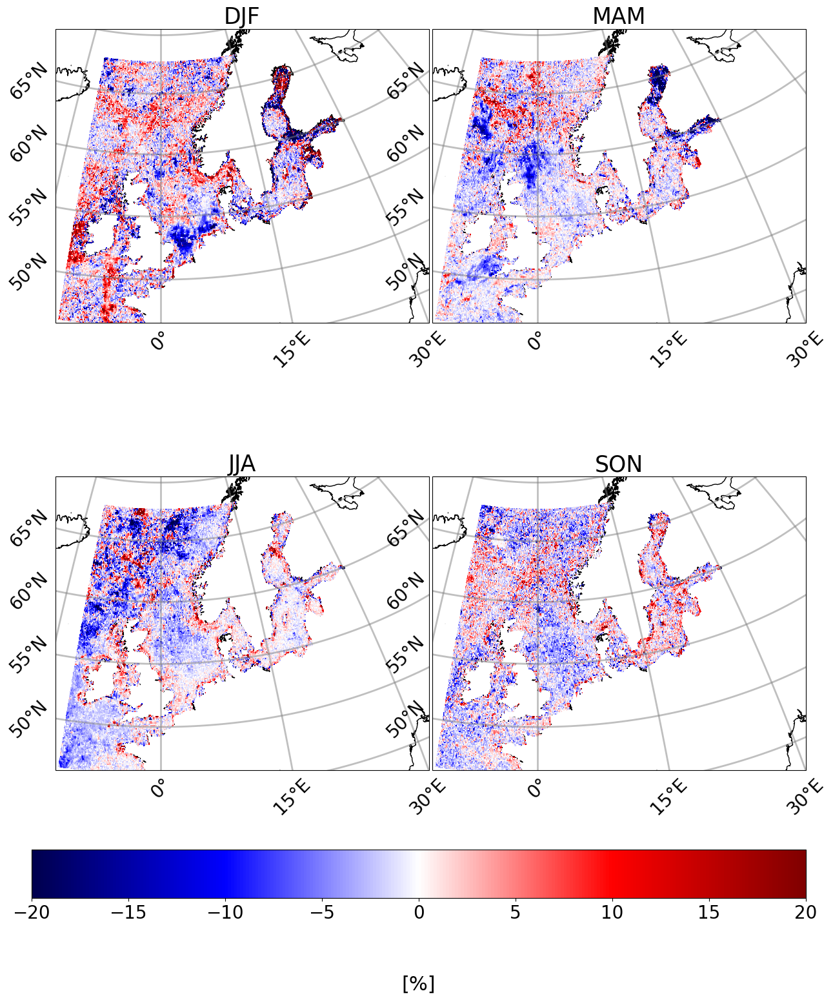

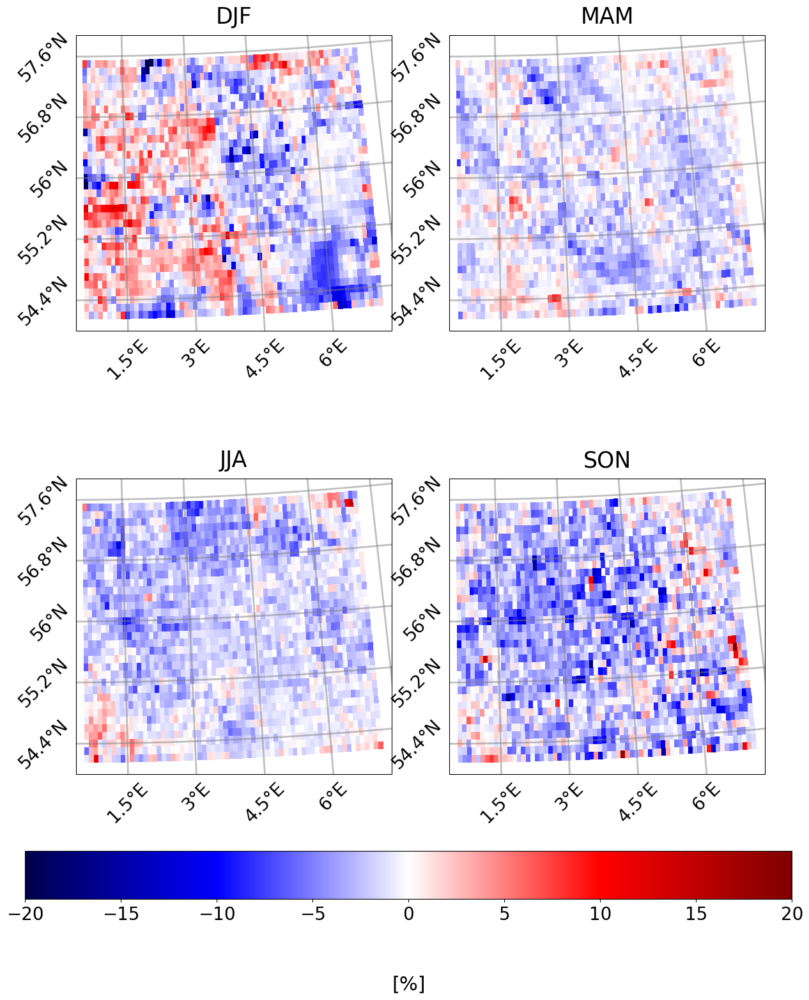

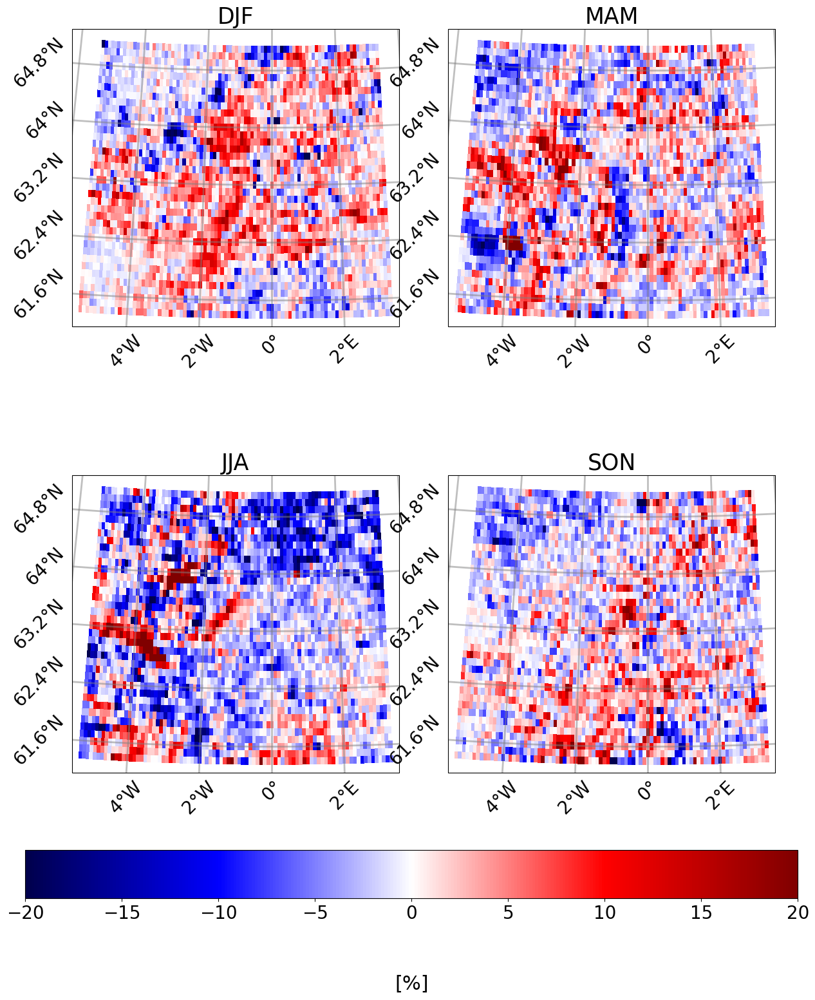

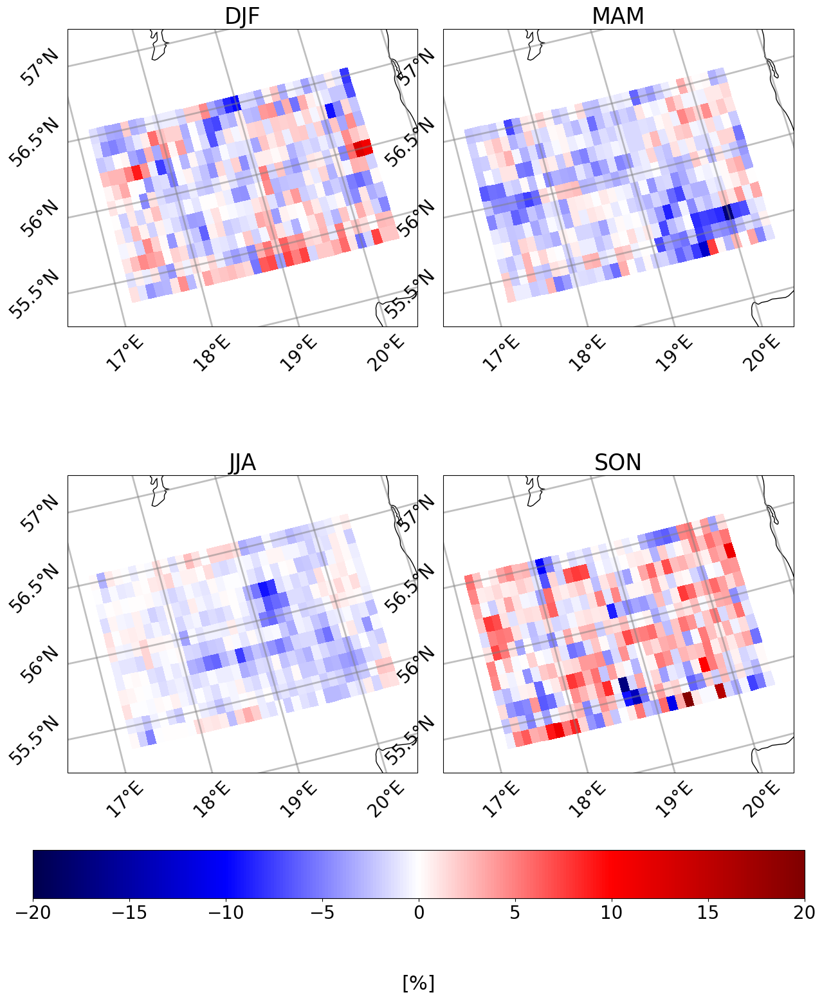

In [10]:
ds_DJF = [ xr.open_dataset(spa_filenames_DJF[i],group='diff').rmse for i in range(len(spa_filenames_DJF))] 
ds_MAM = [ xr.open_dataset(spa_filenames_MAM[i],group='diff').rmse for i in range(len(spa_filenames_MAM))] 
ds_JJA = [ xr.open_dataset(spa_filenames_JJA[i],group='diff').rmse for i in range(len(spa_filenames_JJA))] 
ds_SON = [ xr.open_dataset(spa_filenames_SON[i],group='diff').rmse for i in range(len(spa_filenames_SON))] 
for i in range(len(ds_DJF)):
    lon_min = np.min(xr.open_dataset(filenames[i]).lon.data)
    lon_max = np.max(xr.open_dataset(filenames[i]).lon.data)
    lat_min = np.min(xr.open_dataset(filenames[i]).lat.data)
    lat_max = np.max(xr.open_dataset(filenames[i]).lat.data)
    ds_DJF[i] = ds_DJF[i].assign_coords(lon=np.mod(ds_DJF[i].lon -180.0,360.0)-180.0)
    ds_DJF[i] = ds_DJF[i].sortby(ds_DJF[i].lon).sel(lon=slice(lon_min,lon_max),lat=slice(lat_min,lat_max))
    ds_MAM[i] = ds_MAM[i].assign_coords(lon=np.mod(ds_MAM[i].lon -180.0,360.0)-180.0)
    ds_MAM[i] = ds_MAM[i].sortby(ds_MAM[i].lon).sel(lon=slice(lon_min,lon_max),lat=slice(lat_min,lat_max))
    ds_JJA[i] = ds_JJA[i].assign_coords(lon=np.mod(ds_JJA[i].lon -180.0,360.0)-180.0)
    ds_JJA[i] = ds_JJA[i].sortby(ds_JJA[i].lon).sel(lon=slice(lon_min,lon_max),lat=slice(lat_min,lat_max))
    ds_SON[i] = ds_SON[i].assign_coords(lon=np.mod(ds_SON[i].lon -180.0,360.0)-180.0)
    ds_SON[i] = ds_SON[i].sortby(ds_SON[i].lon).sel(lon=slice(lon_min,lon_max),lat=slice(lat_min,lat_max))
    
itrcp_spa_diff('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_byseason.png',
               [ ds_DJF[6], ds_MAM[6], ds_JJA[6], ds_SON[6] ], 
               [ ds_DJF[13], ds_MAM[13], ds_JJA[13], ds_SON[13] ],
               ds_DJF[6].lon, ds_DJF[6].lat, ["DJF","MAM","JJA","SON"],
               nr=2,nc=2,
               figsize=(15,15),
               vmin=-20,vmax=20)

itrcp_spa_diff('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_dm1_byseason.png',
               [ ds_DJF[0], ds_MAM[0], ds_JJA[0], ds_SON[0] ], 
               [ ds_DJF[8], ds_MAM[8], ds_JJA[8], ds_SON[8] ],
               ds_DJF[0].lon, ds_DJF[0].lat, ["DJF","MAM","JJA","SON"],
               nr=2,nc=2,
               figsize=(15,15),
               vmin=-20,vmax=20)

itrcp_spa_diff('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_dm2_byseason.png',
               [ ds_DJF[2], ds_MAM[2], ds_JJA[2], ds_SON[2] ], 
               [ ds_DJF[10], ds_MAM[10], ds_JJA[10], ds_SON[10] ],
               ds_DJF[2].lon, ds_DJF[2].lat, ["DJF","MAM","JJA","SON"],
               nr=2,nc=2,
               figsize=(15,15),
               vmin=-20,vmax=20)

itrcp_spa_diff('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_dm3_byseason.png',
               [ ds_DJF[4], ds_MAM[4], ds_JJA[4], ds_SON[4] ], 
               [ ds_DJF[12], ds_MAM[12], ds_JJA[12], ds_SON[12] ],
               ds_DJF[4].lon, ds_DJF[4].lat, ["DJF","MAM","JJA","SON"],
               nr=2,nc=2,
               figsize=(15,15),
               vmin=-20,vmax=20)

from PIL import Image
from IPython.display import display
img = Image.open('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_byseason.png')
display(img)
img = Image.open('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_dm1_byseason.png')
display(img)
img = Image.open('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_dm2_byseason.png')
display(img)
img = Image.open('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_dm3_byseason.png')
display(img)

#### 2.2.2.3 Spectral plots

INFO:root: 
INFO:root:  Minimum spatial scale resolved = 4km
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 19km
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 4km
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 7km


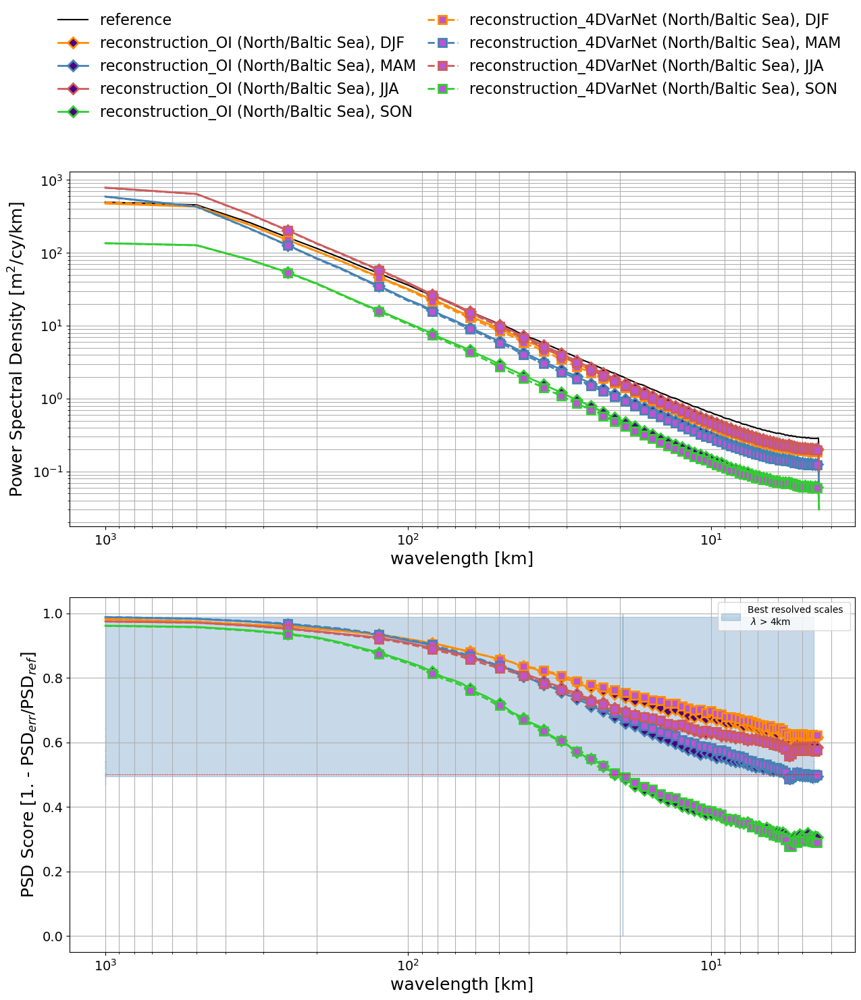

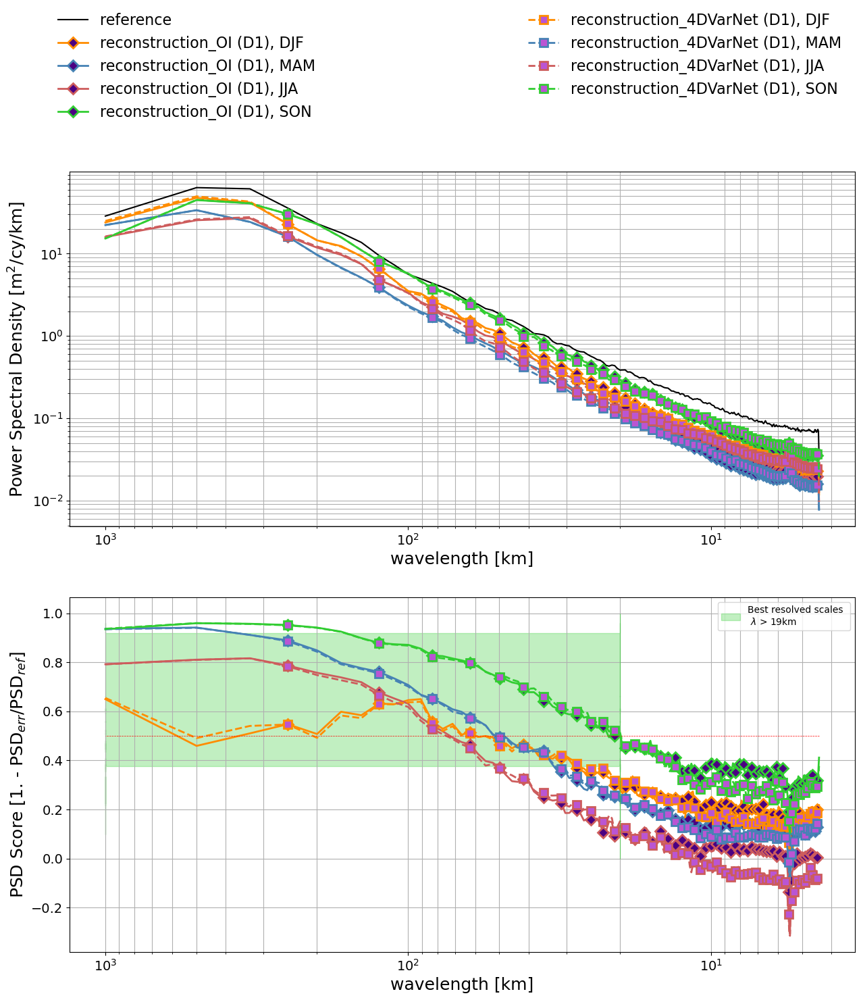

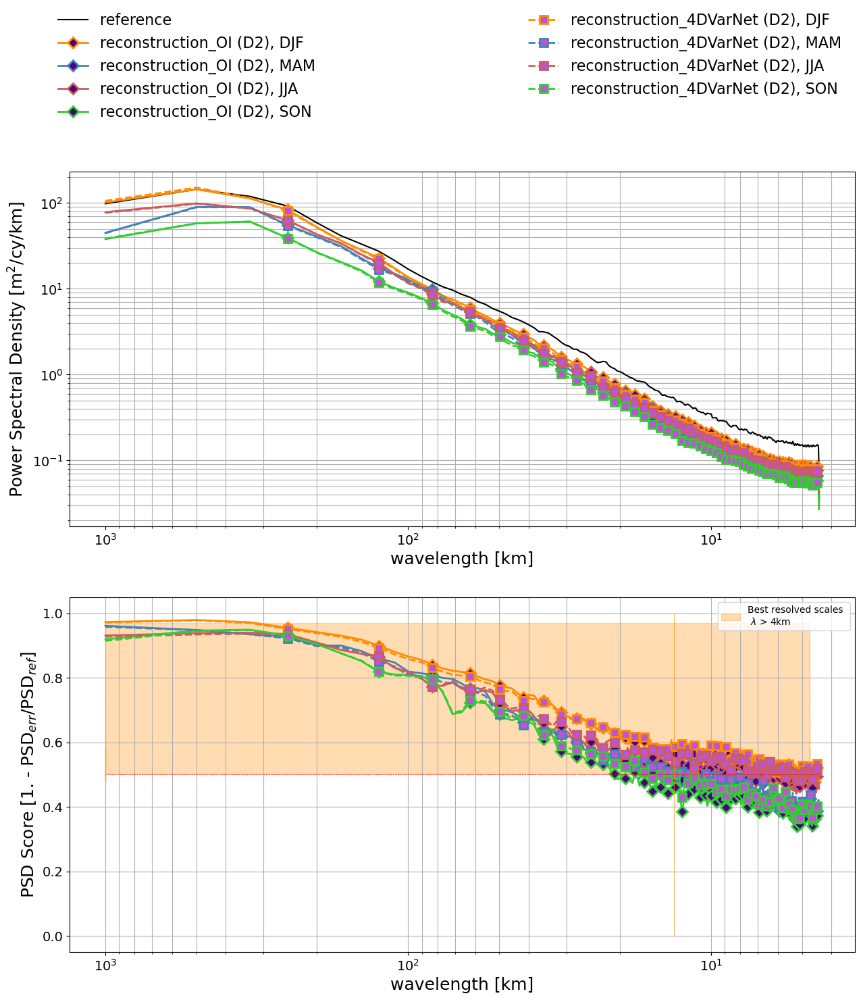

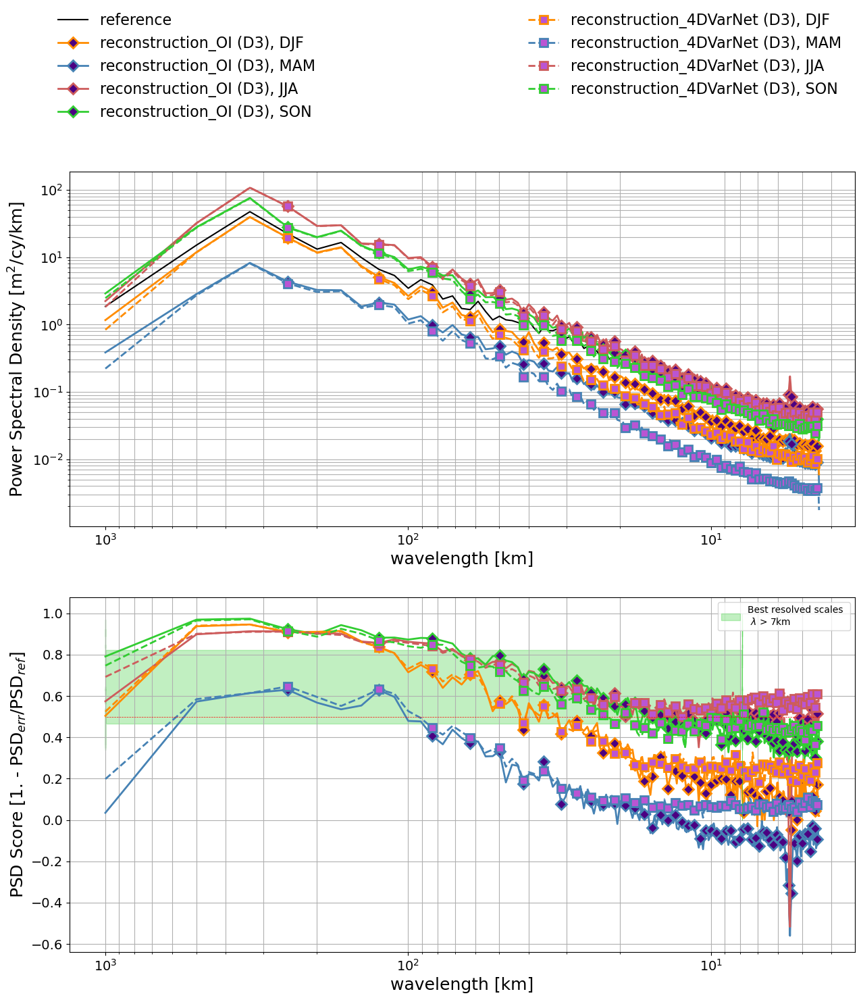

In [70]:
spectrum_filenames = ['/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_DJF.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_MAM.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_JJA.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_SON.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_DJF.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_MAM.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_JJA.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_SON.nc']
methods = ['OI (North/Baltic Sea), DJF',
           'OI (North/Baltic Sea), MAM',
           'OI (North/Baltic Sea), JJA',
           'OI (North/Baltic Sea), SON',
           '4DVarNet (North/Baltic Sea), DJF',
           '4DVarNet (North/Baltic Sea), MAM',
           '4DVarNet (North/Baltic Sea), JJA',
           '4DVarNet (North/Baltic Sea), SON']
marker = ["D","D","D","D","s","s","s","s"]
linestyle = ["solid","solid","solid","solid","dashed","dashed","dashed","dashed",]
colors = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
markerfacecolor = ["indigo","indigo","indigo","indigo","mediumorchid","mediumorchid","mediumorchid","mediumorchid"]
markeredgecolor = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
itrcp_spectrum('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spectrum_season.png',
                               spectrum_filenames,
                               methods,
                               colors,
                               linestyle,
                               marker,
                               markerfacecolor,
                               markeredgecolor
              )

spectrum_filenames = ['/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_DJF.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_MAM.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_JJA.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_SON.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_DJF.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_MAM.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_JJA.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_SON.nc']
methods = ['OI (D1), DJF',
           'OI (D1), MAM',
           'OI (D1), JJA',
           'OI (D1), SON',
           '4DVarNet (D1), DJF',
           '4DVarNet (D1), MAM',
           '4DVarNet (D1), JJA',
           '4DVarNet (D1), SON']
marker = ["D","D","D","D","s","s","s","s"]
linestyle = ["solid","solid","solid","solid","dashed","dashed","dashed","dashed",]
colors = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
markerfacecolor = ["indigo","indigo","indigo","indigo","mediumorchid","mediumorchid","mediumorchid","mediumorchid"]
markeredgecolor = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
itrcp_spectrum('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spectrum_D1_season.png',
                               spectrum_filenames,
                               methods,
                               colors,
                               linestyle,
                               marker,
                               markerfacecolor,
                               markeredgecolor
              )

spectrum_filenames = ['/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_DJF.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_MAM.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_JJA.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_SON.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_DJF.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_MAM.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_JJA.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_SON.nc']
methods = ['OI (D2), DJF',
           'OI (D2), MAM',
           'OI (D2), JJA',
           'OI (D2), SON',
           '4DVarNet (D2), DJF',
           '4DVarNet (D2), MAM',
           '4DVarNet (D2), JJA',
           '4DVarNet (D2), SON']
marker = ["D","D","D","D","s","s","s","s"]
linestyle = ["solid","solid","solid","solid","dashed","dashed","dashed","dashed",]
colors = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
markerfacecolor = ["indigo","indigo","indigo","indigo","mediumorchid","mediumorchid","mediumorchid","mediumorchid"]
markeredgecolor = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
itrcp_spectrum('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spectrum_D2_season.png',
                               spectrum_filenames,
                               methods,
                               colors,
                               linestyle,
                               marker,
                               markerfacecolor,
                               markeredgecolor
              )

spectrum_filenames = ['/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_DJF.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_MAM.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_JJA.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_SON.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_DJF.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_MAM.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_JJA.nc',
                      '/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_SON.nc']
methods = ['OI (D3), DJF',
           'OI (D3), MAM',
           'OI (D3), JJA',
           'OI (D3), SON',
           '4DVarNet (D3), DJF',
           '4DVarNet (D3), MAM',
           '4DVarNet (D3), JJA',
           '4DVarNet (D3), SON']
marker = ["D","D","D","D","s","s","s","s"]
linestyle = ["solid","solid","solid","solid","dashed","dashed","dashed","dashed",]
colors = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
markerfacecolor = ["indigo","indigo","indigo","indigo","mediumorchid","mediumorchid","mediumorchid","mediumorchid"]
markeredgecolor = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
itrcp_spectrum('/DATASET/mbeauchamp/DMI/postpro/Benchmark_spectrum_D3_season.png',
                               spectrum_filenames,
                               methods,
                               colors,
                               linestyle,
                               marker,
                               markerfacecolor,
                               markeredgecolor
              )

#### 2.2.2.4 Leaderboard

In [ ]:
data = np.array([
                 ['OI_DJF',leaderboard_DJF_nrmse_oi,leaderboard_DJF_nrmse_std_oi,int(leaderboard_DJF_psds_score_oi)],
                 ['4DVarNet_DJF',leaderboard_DJF_nrmse_dl,leaderboard_DJF_nrmse_std_dl,int(leaderboard_DJF_psds_score_dl)],
                 ['OI_dm1_DJF',leaderboard_DJF_nrmse_oi_dm1,leaderboard_DJF_nrmse_std_oi_dm1,int(leaderboard_DJF_psds_score_oi_dm1)],
                 ['4DVarNet_dm1r_DJF',leaderboard_DJF_nrmse_dl_dm1,leaderboard_DJF_nrmse_std_dl_dm1,int(leaderboard_DJF_psds_score_dl_dm1)],
                 ['4DVarNet_dm1l_DJF',leaderboard_DJF_nrmse_dl_dm1_tr_all,leaderboard_DJF_nrmse_std_dl_dm1_tr_all,int(leaderboard_DJF_psds_score_dl_dm1_tr_all)],
                 ['OI_dm2_DJF',leaderboard_DJF_nrmse_oi_dm2,leaderboard_DJF_nrmse_std_oi_dm2,int(leaderboard_DJF_psds_score_oi_dm2)],
                 ['4DVarNet_dm2r_DJF',leaderboard_DJF_nrmse_dl_dm2,leaderboard_DJF_nrmse_std_dl_dm2,int(leaderboard_DJF_psds_score_dl_dm2)],
                 ['4DVarNet_dm2l_DJF',leaderboard_DJF_nrmse_dl_dm2_tr_all,leaderboard_DJF_nrmse_std_dl_dm2_tr_all,int(leaderboard_DJF_psds_score_dl_dm2_tr_all)],
                 ['OI_dm3_DJF',leaderboard_DJF_nrmse_oi_dm3,leaderboard_DJF_nrmse_std_oi_dm3,int(leaderboard_DJF_psds_score_oi_dm3)],
                 ['4DVarNet_dm3r_DJF',leaderboard_DJF_nrmse_dl_dm3,leaderboard_DJF_nrmse_std_dl_dm3,int(leaderboard_DJF_psds_score_dl_dm3)],
                 ['4DVarNet_dm3l_DJF',leaderboard_DJF_nrmse_dl_dm3_tr_all,leaderboard_DJF_nrmse_std_dl_dm3_tr_all,int(leaderboard_DJF_psds_score_dl_dm3_tr_all)], 
                 ['OI_MAM',leaderboard_MAM_nrmse_oi,leaderboard_MAM_nrmse_std_oi,int(leaderboard_MAM_psds_score_oi)],
                 ['4DVarNet_MAM',leaderboard_MAM_nrmse_dl,leaderboard_MAM_nrmse_std_dl,int(leaderboard_MAM_psds_score_dl)],
                 ['OI_dm1_MAM',leaderboard_MAM_nrmse_oi_dm1,leaderboard_MAM_nrmse_std_oi_dm1,int(leaderboard_MAM_psds_score_oi_dm1)],
                 ['4DVarNet_dm1r_MAM',leaderboard_MAM_nrmse_dl_dm1,leaderboard_MAM_nrmse_std_dl_dm1,int(leaderboard_MAM_psds_score_dl_dm1)],
                 ['4DVarNet_dm1l_MAM',leaderboard_MAM_nrmse_dl_dm1_tr_all,leaderboard_MAM_nrmse_std_dl_dm1_tr_all,int(leaderboard_MAM_psds_score_dl_dm1_tr_all)],
                 ['OI_dm2_MAM',leaderboard_MAM_nrmse_oi_dm2,leaderboard_MAM_nrmse_std_oi_dm2,int(leaderboard_MAM_psds_score_oi_dm2)],
                 ['4DVarNet_dm2r_MAM',leaderboard_MAM_nrmse_dl_dm2,leaderboard_MAM_nrmse_std_dl_dm2,int(leaderboard_MAM_psds_score_dl_dm2)],
                 ['4DVarNet_dm2l_MAM',leaderboard_MAM_nrmse_dl_dm2_tr_all,leaderboard_MAM_nrmse_std_dl_dm2_tr_all,int(leaderboard_MAM_psds_score_dl_dm2_tr_all)],
                 ['OI_dm3_MAM',leaderboard_MAM_nrmse_oi_dm3,leaderboard_MAM_nrmse_std_oi_dm3,int(leaderboard_MAM_psds_score_oi_dm3)],
                 ['4DVarNet_dm3r_MAM',leaderboard_MAM_nrmse_dl_dm3,leaderboard_MAM_nrmse_std_dl_dm3,int(leaderboard_MAM_psds_score_dl_dm3)],
                 ['4DVarNet_dm3l_MAM',leaderboard_MAM_nrmse_dl_dm3_tr_all,leaderboard_MAM_nrmse_std_dl_dm3_tr_all,int(leaderboard_MAM_psds_score_dl_dm3_tr_all)],      
                 ['OI_JJA',leaderboard_JJA_nrmse_oi,leaderboard_JJA_nrmse_std_oi,int(leaderboard_JJA_psds_score_oi)],
                 ['4DVarNet_JJA',leaderboard_JJA_nrmse_dl,leaderboard_JJA_nrmse_std_dl,int(leaderboard_JJA_psds_score_dl)],
                 ['OI_dm1_JJA',leaderboard_JJA_nrmse_oi_dm1,leaderboard_JJA_nrmse_std_oi_dm1,int(leaderboard_JJA_psds_score_oi_dm1)],
                 ['4DVarNet_dm1r_JJA',leaderboard_JJA_nrmse_dl_dm1,leaderboard_JJA_nrmse_std_dl_dm1,int(leaderboard_JJA_psds_score_dl_dm1)],
                 ['4DVarNet_dm1l_JJA',leaderboard_JJA_nrmse_dl_dm1_tr_all,leaderboard_JJA_nrmse_std_dl_dm1_tr_all,int(leaderboard_JJA_psds_score_dl_dm1_tr_all)],
                 ['OI_dm2_JJA',leaderboard_JJA_nrmse_oi_dm2,leaderboard_JJA_nrmse_std_oi_dm2,int(leaderboard_JJA_psds_score_oi_dm2)],
                 ['4DVarNet_dm2r_JJA',leaderboard_JJA_nrmse_dl_dm2,leaderboard_JJA_nrmse_std_dl_dm2,int(leaderboard_JJA_psds_score_dl_dm2)],
                 ['4DVarNet_dm2l_JJA',leaderboard_JJA_nrmse_dl_dm2_tr_all,leaderboard_JJA_nrmse_std_dl_dm2_tr_all,int(leaderboard_JJA_psds_score_dl_dm2_tr_all)],
                 ['OI_dm3_JJA',leaderboard_JJA_nrmse_oi_dm3,leaderboard_JJA_nrmse_std_oi_dm3,int(leaderboard_JJA_psds_score_oi_dm3)],
                 ['4DVarNet_dm3r_JJA',leaderboard_JJA_nrmse_dl_dm3,leaderboard_JJA_nrmse_std_dl_dm3,int(leaderboard_JJA_psds_score_dl_dm3)],
                 ['4DVarNet_dm3l_JJA',leaderboard_JJA_nrmse_dl_dm3_tr_all,leaderboard_JJA_nrmse_std_dl_dm3_tr_all,int(leaderboard_JJA_psds_score_dl_dm3_tr_all)],      
                 ['OI_SON',leaderboard_SON_nrmse_oi,leaderboard_SON_nrmse_std_oi,int(leaderboard_SON_psds_score_oi)],
                 ['4DVarNet_SON',leaderboard_SON_nrmse_dl,leaderboard_SON_nrmse_std_dl,int(leaderboard_SON_psds_score_dl)],
                 ['OI_dm1_SON',leaderboard_SON_nrmse_oi_dm1,leaderboard_SON_nrmse_std_oi_dm1,int(leaderboard_SON_psds_score_oi_dm1)],
                 ['4DVarNet_dm1r_SON',leaderboard_SON_nrmse_dl_dm1,leaderboard_SON_nrmse_std_dl_dm1,int(leaderboard_SON_psds_score_dl_dm1)],
                 ['4DVarNet_dm1l_SON',leaderboard_SON_nrmse_dl_dm1_tr_all,leaderboard_SON_nrmse_std_dl_dm1_tr_all,int(leaderboard_SON_psds_score_dl_dm1_tr_all)],
                 ['OI_dm2_SON',leaderboard_SON_nrmse_oi_dm2,leaderboard_SON_nrmse_std_oi_dm2,int(leaderboard_SON_psds_score_oi_dm2)],
                 ['4DVarNet_dm2r_SON',leaderboard_SON_nrmse_dl_dm2,leaderboard_SON_nrmse_std_dl_dm2,int(leaderboard_SON_psds_score_dl_dm2)],
                 ['4DVarNet_dm2l_SON',leaderboard_SON_nrmse_dl_dm2_tr_all,leaderboard_SON_nrmse_std_dl_dm2_tr_all,int(leaderboard_SON_psds_score_dl_dm2_tr_all)],
                 ['OI_dm3_SON',leaderboard_SON_nrmse_oi_dm3,leaderboard_SON_nrmse_std_oi_dm3,int(leaderboard_SON_psds_score_oi_dm3)],
                 ['4DVarNet_dm3r_SON',leaderboard_SON_nrmse_dl_dm3,leaderboard_SON_nrmse_std_dl_dm3,int(leaderboard_SON_psds_score_dl_dm3)],
                 ['4DVarNet_dm3l_SON',leaderboard_SON_nrmse_dl_dm3_tr_all,leaderboard_SON_nrmse_std_dl_dm3_tr_all,int(leaderboard_SON_psds_score_dl_dm3_tr_all)],                                  
                ])
Leaderboard_season = pd.DataFrame(data, 
                           columns=['Method', 
                                    "µ(RMSE) ", 
                                    "σ(RMSE)", 
                                    'λx (km)'])
print("Summary of the seasonal leaderboard metrics:")
Leaderboard_season
print(Leaderboard_season.to_markdown()) 

## 2.3 Filtered analysis

### 2.3.1 Yearly analysis

#### 2.3.1.1 Compute NetCDF metrics file (spatial, temporal, spectral)

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_flt50.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_flt50.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.0041153172251931
INFO:root: 
INFO:root:  STD RMSE Score = 0.007463533481876312
INFO:root: 
INFO:root:  MEAN RMSE = 7.563968916404748
INFO:root: 
INFO:root:  STD RMSE = 32.35513404396982
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_flt50.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


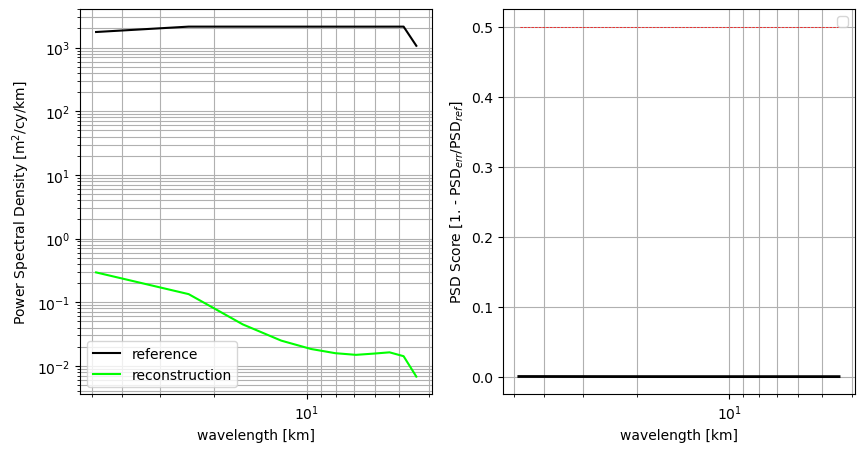

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_flt50.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_flt50.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.0034240040621035146
INFO:root: 
INFO:root:  STD RMSE Score = 0.0075520534587095196
INFO:root: 
INFO:root:  MEAN RMSE = 7.514453171950042
INFO:root: 
INFO:root:  STD RMSE = 32.35252798233777
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_flt50.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


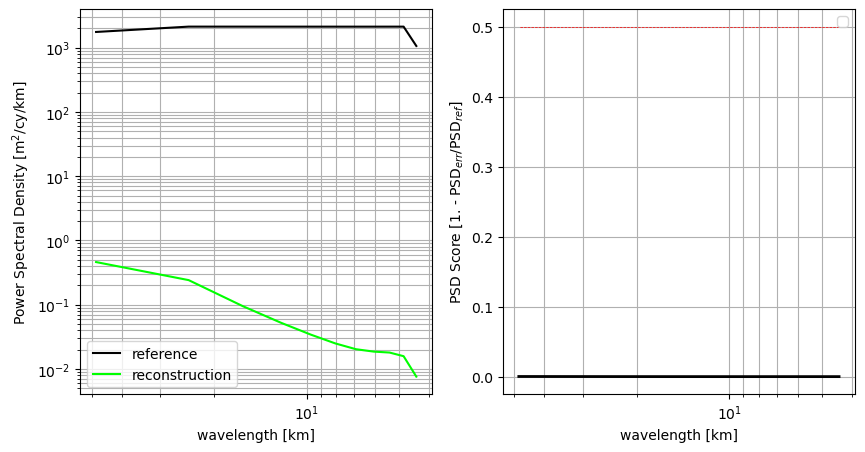

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_flt50.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1_flt50.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = -0.022683095034268096
INFO:root: 
INFO:root:  STD RMSE Score = 0.098252604759026
INFO:root: 
INFO:root:  MEAN RMSE = 0.845759967743862
INFO:root: 
INFO:root:  STD RMSE = 1.5978982898074408
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_flt50.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


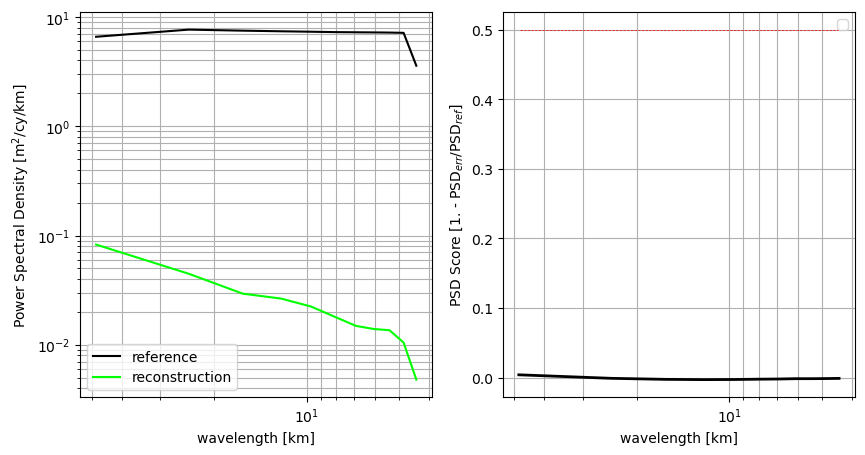

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_flt50.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1_tr_all_flt50.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = -0.008655949183588326
INFO:root: 
INFO:root:  STD RMSE Score = 0.10256540914844847
INFO:root: 
INFO:root:  MEAN RMSE = 0.8422097764069624
INFO:root: 
INFO:root:  STD RMSE = 1.5990971968411627
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_tr_all_flt50.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


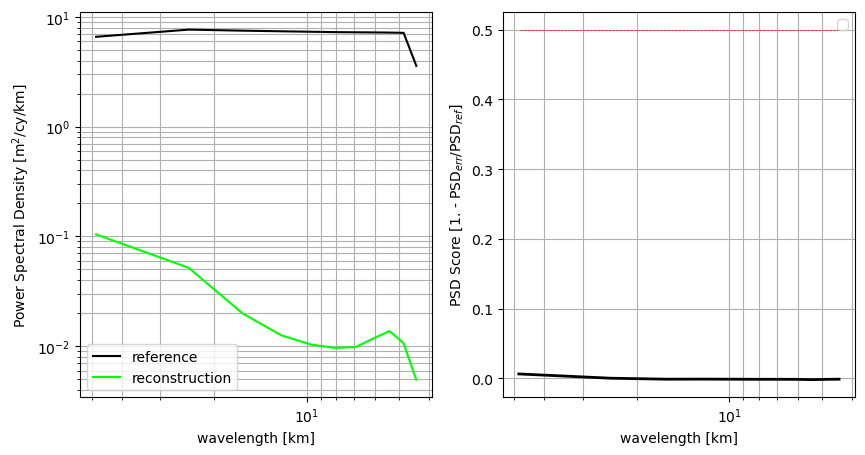

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_flt50.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D1_flt50.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = -0.029444965003513696
INFO:root: 
INFO:root:  STD RMSE Score = 0.15449981264696994
INFO:root: 
INFO:root:  MEAN RMSE = 0.8466746606916187
INFO:root: 
INFO:root:  STD RMSE = 1.5977554736710127
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_flt50.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


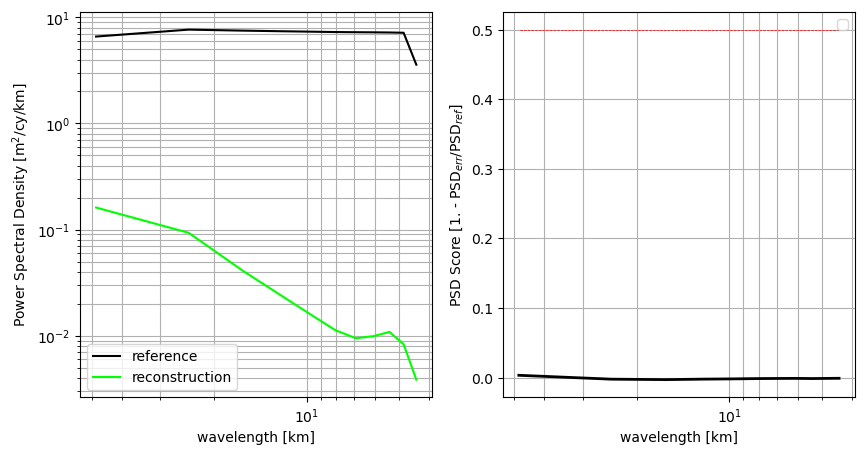

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_flt50.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2_flt50.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.008981188089081125
INFO:root: 
INFO:root:  STD RMSE Score = 0.07060600197119775
INFO:root: 
INFO:root:  MEAN RMSE = 4.128680828292076
INFO:root: 
INFO:root:  STD RMSE = 18.29987148560275
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_flt50.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


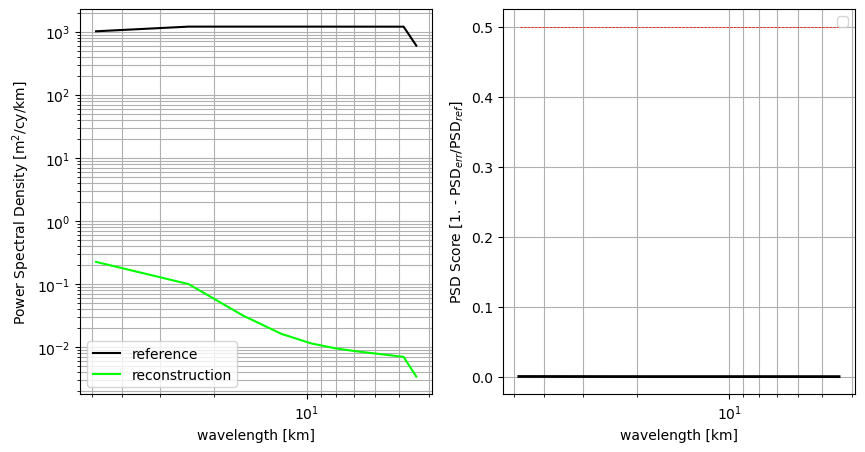

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_flt50.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2_tr_all_flt50.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.005611022328682737
INFO:root: 
INFO:root:  STD RMSE Score = 0.07195817552021479
INFO:root: 
INFO:root:  MEAN RMSE = 4.129766667891981
INFO:root: 
INFO:root:  STD RMSE = 18.299611979404414
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_tr_all_flt50.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


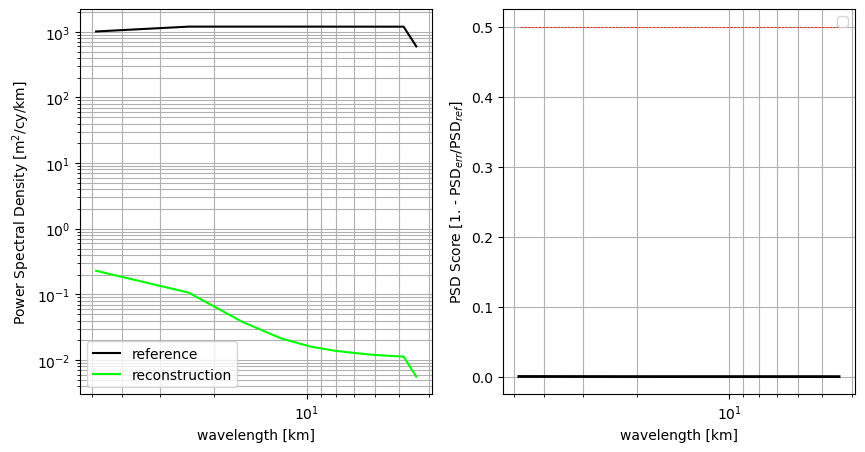

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_flt50.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D2_flt50.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = -0.010078296982173812
INFO:root: 
INFO:root:  STD RMSE Score = 0.11593652528723768
INFO:root: 
INFO:root:  MEAN RMSE = 4.133999461693029
INFO:root: 
INFO:root:  STD RMSE = 18.298815004823496
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_flt50.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


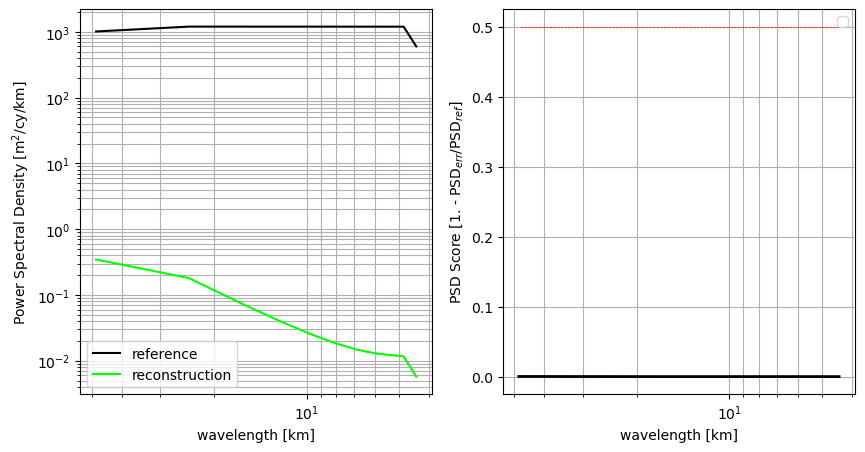

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_flt50.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3_flt50.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.05552973997664888
INFO:root: 
INFO:root:  STD RMSE Score = 0.10149806986112225
INFO:root: 
INFO:root:  MEAN RMSE = 1.0710744878872407
INFO:root: 
INFO:root:  STD RMSE = 7.205135890249739
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_flt50.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


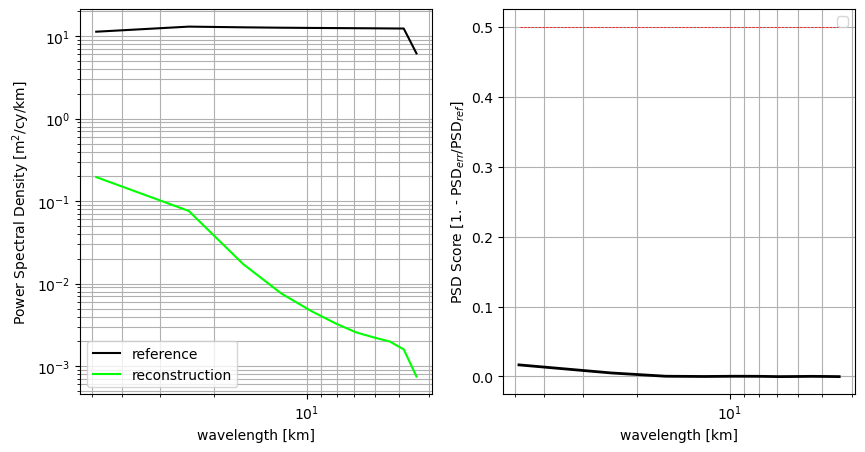

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_flt50.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3_tr_all_flt50.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.057990293406721266
INFO:root: 
INFO:root:  STD RMSE Score = 0.1282173308996632
INFO:root: 
INFO:root:  MEAN RMSE = 1.0694741244054418
INFO:root: 
INFO:root:  STD RMSE = 7.204777477526115
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_tr_all_flt50.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


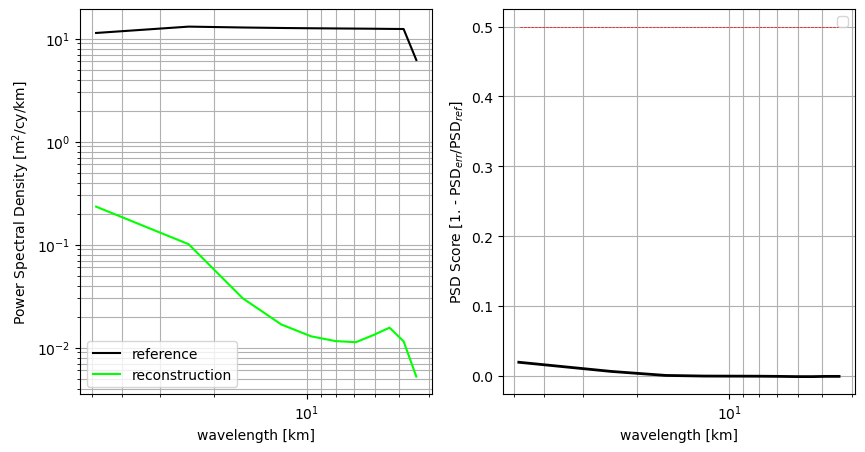

INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_flt50.nc
INFO:root: 
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/TS_OI_D3_flt50.nc
INFO:root: 
INFO:root:  MEAN RMSE Score = 0.038609005317657596
INFO:root: 
INFO:root:  STD RMSE Score = 0.19604643052067802
INFO:root: 
INFO:root:  MEAN RMSE = 1.0726091355514964
INFO:root: 
INFO:root:  STD RMSE = 7.204360034565967
INFO:root:  Results saved in: /DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_flt50.nc
INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


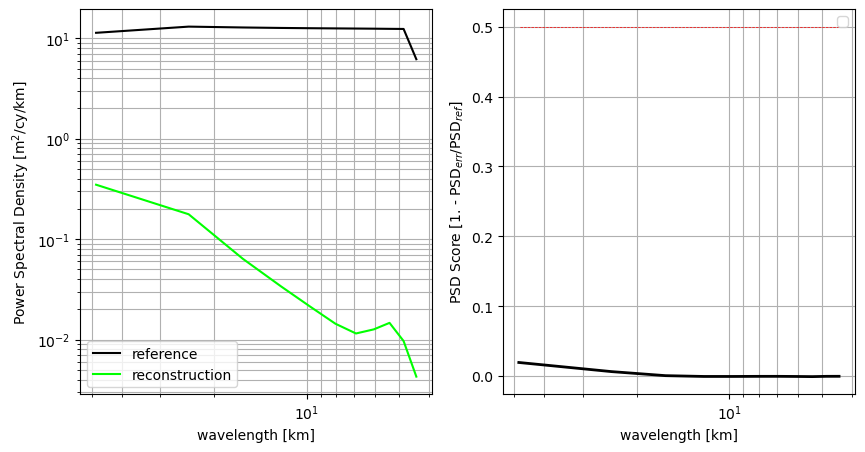

In [24]:
val_flt = "50"
file_dl = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext_flt"+val_flt+".nc"
file_dl_dm1 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval_flt"+val_flt+".nc"
file_dl_dm2 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval_flt"+val_flt+".nc"
file_dl_dm3 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval_flt"+val_flt+".nc"
file_oi = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation_flt"+val_flt+".nc"

bin_lat_step = 0.1
bin_lon_step = 0.1
bin_time_step = '1D'
time_min = '2021-01-15'
time_max = '2021-12-31'
sel_time = slice(time_min, time_max)
delta_t = 0.9434  # s
velocity = 6.77   # km/s
delta_x = velocity * delta_t
delta_x = 2.2
lenght_scale = 50 #1000 # km

# NS-BS Seas
lon_min = np.min(xr.open_dataset(file_dl).lon.data)
lon_max = np.max(xr.open_dataset(file_dl).lon.data)
lat_min = np.min(xr.open_dataset(file_dl).lat.data)
lat_max = np.max(xr.open_dataset(file_dl).lat.data)
leaderboard_nrmse_dl, leaderboard_nrmse_std_dl, leaderboard_psds_score_dl = run_comparison(file_dl,"4DVarNet_flt"+val_flt,crop=True,
                                                                                          file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_nrmse_oi, leaderboard_nrmse_std_oi, leaderboard_psds_score_oi = run_comparison(file_oi,"OI_flt"+val_flt,crop=True,
                                                                                          file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")


# D1
lon_min = np.min(xr.open_dataset(file_dl_dm1).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm1).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm1).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm1).lat.data)
leaderboard_nrmse_dl_dm1, leaderboard_nrmse_std_dl_dm1, leaderboard_psds_score_dl_dm1 = run_comparison(file_dl_dm1,"4DVarNet_D1_flt"+val_flt,
                                                                                                       file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_nrmse_dl_dm1_tr_all, leaderboard_nrmse_std_dl_dm1_tr_all, leaderboard_psds_score_dl_dm1_tr_all = run_comparison(file_dl,"4DVarNet_D1_tr_all_flt"+val_flt,crop=True,
                                                                                                                           file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_nrmse_oi_dm1, leaderboard_nrmse_std_oi_dm1, leaderboard_psds_score_oi_dm1 = run_comparison(file_oi,"OI_D1_flt"+val_flt,crop=True,file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")

# D2
lon_min = np.min(xr.open_dataset(file_dl_dm2).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm2).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm2).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm2).lat.data)
leaderboard_nrmse_dl_dm2, leaderboard_nrmse_std_dl_dm2, leaderboard_psds_score_dl_dm2 = run_comparison(file_dl_dm2,"4DVarNet_D2_flt"+val_flt,
                                                                                                      file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_nrmse_dl_dm2_tr_all, leaderboard_nrmse_std_dl_dm2_tr_all, leaderboard_psds_score_dl_dm2_tr_all = run_comparison(file_dl,"4DVarNet_D2_tr_all_flt"+val_flt,crop=True,
                                                                                                                            file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_nrmse_oi_dm2, leaderboard_nrmse_std_oi_dm2, leaderboard_psds_score_oi_dm2 = run_comparison(file_oi,"OI_D2_flt"+val_flt,crop=True,file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")

# D3
lon_min = np.min(xr.open_dataset(file_dl_dm3).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm3).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm3).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm3).lat.data)
leaderboard_nrmse_dl_dm3, leaderboard_nrmse_std_dl_dm3, leaderboard_psds_score_dl_dm3 = run_comparison(file_dl_dm3,"4DVarNet_D3_flt"+val_flt,
                                                                                                      file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_nrmse_dl_dm3_tr_all, leaderboard_nrmse_std_dl_dm3_tr_all, leaderboard_psds_score_dl_dm3_tr_all = run_comparison(file_dl,"4DVarNet_D3_tr_all_flt"+val_flt,crop=True,
                                                                                                                            file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_nrmse_oi_dm3, leaderboard_nrmse_std_oi_dm3, leaderboard_psds_score_oi_dm3 = run_comparison(file_oi,"OI_D3_flt"+val_flt,crop=True,file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")

#### 2.3.1.2 Compute RMSE score intercomparison

In [26]:
val_flt="50"
file_dl = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext_flt"+val_flt+".nc"
file_dl_dm1 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval_flt"+val_flt+".nc"
file_dl_dm2 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval_flt"+val_flt+".nc"
file_dl_dm3 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval_flt"+val_flt+".nc"
file_oi = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc"

bin_lat_step = 0.1
bin_lon_step = 0.1
bin_time_step = "1D"
time_min = "2021-01-15"
time_max = "2021-12-31"
sel_time = slice(time_min, time_max)
delta_t = 0.9434  # s
velocity = 6.77   # km/s
delta_x = velocity * delta_t
delta_x = 2.2
lenght_scale = 1000 # km

TS_filenames_OI = ["/DATASET/mbeauchamp/DMI/postpro/TS_OI_D1_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/TS_OI_D1_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/TS_OI_D2_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/TS_OI_D2_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/TS_OI_D3_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/TS_OI_D3_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/TS_OI_flt"+val_flt+".nc"]

TS_filenames_4DVarNet = ["/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D1_tr_all_flt"+val_flt+".nc",
                         "/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D2_tr_all_flt"+val_flt+".nc",
                         "/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_D3_tr_all_flt"+val_flt+".nc",
                        "/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_flt"+val_flt+".nc"]

ds_oi = [xr.open_dataset(file, group="diff") for file in TS_filenames_OI]
methods_oi =  ["dm1_flt"+val_flt, "dm1_tr_all_flt"+val_flt,"dm2_flt"+val_flt, "dm2_tr_all_flt"+val_flt,"dm3_flt"+val_flt, "dm3_tr_all_flt"+val_flt,"NB_seas_flt"+val_flt]
ds_4DVarNet = [xr.open_dataset(file, group="diff") for file in TS_filenames_4DVarNet]
methods_4DVarNet =  ["dm1_flt"+val_flt, "dm1_tr_all_flt"+val_flt,"dm2_flt"+val_flt, "dm2_tr_all_flt"+val_flt,"dm3_flt"+val_flt, "dm3_tr_all_flt"+val_flt,"NB_seas_flt"+val_flt]

rmse_score_oi = [ ds_oi[i]["rms"] for i in range(len(TS_filenames_OI)) ]
#rmse_score_oi = [ rmse_score_oi[i].dropna(dim="time").where(ds_oi[i]["count"] > 10, drop=True) for i in range(len(TS_filenames_OI)) ]
rmse_score_oi = xr.merge([rmse_score_oi[i].to_dataset().rename({"rms":"rms_"+methods_oi[i]}) for i in range(len(TS_filenames_OI))])

rmse_score_4DVarNet = [ ds_4DVarNet[i]["rms"] for i in range(len(TS_filenames_4DVarNet)) ]
#rmse_score_4DVarNet = [ rmse_score_4DVarNet[i].dropna(dim="time").where(ds_4DVarNet[i]["count"] > 10, drop=True) for i in range(len(TS_filenames_4DVarNet)) ]
rmse_score_4DVarNet = xr.merge([rmse_score_4DVarNet[i].to_dataset().rename({"rms":"rms_"+methods_4DVarNet[i]}) for i in range(len(TS_filenames_4DVarNet))])

rmse_score = 100*(rmse_score_4DVarNet-rmse_score_oi)/rmse_score_oi
rmse_score = rmse_score.sel(time=slice("2021-01-15","2021-12-30"))

# compute spatial coverage
count_mask = np.sum(~np.isfinite(xr.open_dataset(file_oi).analysed_sst[0]).data)
count_cell = np.prod(list(xr.open_dataset(file_oi).analysed_sst[0].sizes.values()))
count_active_cells = count_cell - count_mask
count_active_cells
ds_count = xr.open_dataset(TS_filenames_4DVarNet[-1], group="diff")["count"]
ds_count = ds_count.sel(time=slice("2021-01-15","2021-12-30"))
rmse_score = rmse_score.update({"ds_count":(("time"),100*(ds_count.data/count_active_cells))})

# compute spatial coverage DM1
lon_min = np.min(xr.open_dataset(file_dl_dm1).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm1).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm1).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm1).lat.data)
count_mask = np.sum(~np.isfinite(xr.open_dataset(file_oi).analysed_sst[0].sel(lon=slice(lon_min,lon_max),
                                                                              lat=slice(lat_min,lat_max))).data)
count_cell = np.prod(list(xr.open_dataset(file_oi).analysed_sst[0].sel(lon=slice(lon_min,lon_max),
                                                                       lat=slice(lat_min,lat_max)).sizes.values()))
count_active_cells = count_cell - count_mask
count_active_cells
ds_count_dm1 = xr.open_dataset(TS_filenames_4DVarNet[0], group="diff")["count"]
ds_count_dm1 = ds_count_dm1.sel(time=slice("2021-01-15","2021-12-30"))
rmse_score = rmse_score.update({"ds_count_dm1":(("time"),100*(ds_count_dm1.data/count_active_cells))})

# compute spatial coverage DM2
lon_min = np.min(xr.open_dataset(file_dl_dm2).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm2).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm2).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm2).lat.data)
count_mask = np.sum(~np.isfinite(xr.open_dataset(file_oi).analysed_sst[0].sel(lon=slice(lon_min,lon_max),
                                                                              lat=slice(lat_min,lat_max))).data)
count_cell = np.prod(list(xr.open_dataset(file_oi).analysed_sst[0].sel(lon=slice(lon_min,lon_max),
                                                                       lat=slice(lat_min,lat_max)).sizes.values()))
count_active_cells = count_cell - count_mask
count_active_cells
ds_count_dm2 = xr.open_dataset(TS_filenames_4DVarNet[2], group="diff")["count"]
ds_count_dm2 = ds_count_dm2.sel(time=slice("2021-01-15","2021-12-30"))
rmse_score = rmse_score.update({"ds_count_dm2":(("time"),100*(ds_count_dm2.data/count_active_cells))})

# compute spatial coverage DM3
lon_min = np.min(xr.open_dataset(file_dl_dm3).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm3).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm3).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm3).lat.data)
count_mask = np.sum(~np.isfinite(xr.open_dataset(file_oi).analysed_sst[0].sel(lon=slice(lon_min,lon_max),
                                                                              lat=slice(lat_min,lat_max))).data)
count_cell = np.prod(list(xr.open_dataset(file_oi).analysed_sst[0].sel(lon=slice(lon_min,lon_max),
                                                                       lat=slice(lat_min,lat_max)).sizes.values()))
count_active_cells = count_cell - count_mask
count_active_cells
ds_count_dm3 = xr.open_dataset(TS_filenames_4DVarNet[4], group="diff")["count"]
ds_count_dm3 = ds_count_dm3.sel(time=slice("2021-01-15","2021-12-30"))
rmse_score, ds_count_dm3 = xr.align(rmse_score, ds_count_dm3)
rmse_score = rmse_score.update({"ds_count_dm3":(("time"),100*(ds_count_dm3.data/count_active_cells))})

rmse_score

<xarray.Dataset> Size: 33kB
Dimensions:               (time: 348)
Coordinates:
  * time                  (time) datetime64[ns] 3kB 2021-01-15 ... 2021-12-28
Data variables:
    rms_dm1_flt50         (time) float64 3kB 1.126 3.178 2.07 ... 1.001 -0.6228
    rms_dm1_tr_all_flt50  (time) float64 3kB -2.793 -0.3129 ... -2.259 -0.5248
    rms_dm2_flt50         (time) float64 3kB -4.724 -0.01586 ... -5.483 13.75
    rms_dm2_tr_all_flt50  (time) float64 3kB -4.271 0.01593 ... -5.065 16.1
    rms_dm3_flt50         (time) float64 3kB -0.1893 nan ... 0.3029 0.003736
    rms_dm3_tr_all_flt50  (time) float64 3kB -26.68 nan ... 0.03426 -0.001779
    rms_NB_seas_flt50     (time) float64 3kB -0.02437 -0.05262 ... -0.02487
    ds_count              (time) float64 3kB 10.08 7.656 7.936 ... 9.888 3.492
    ds_count_dm1          (time) float64 3kB 4.027 14.07 7.229 ... 29.49 1.299
    ds_count_dm2          (time) float64 3kB 0.2677 4.137 ... 0.1535 0.006225
    ds_count_dm3          (time) float64 3kB 0.05282 nan ... 48.13 0.2311

#### 2.3.1.3 Spatial RMSE gain mapping 

In [27]:
spa_stat_filenames_OI = ["/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_flt"+val_flt+".nc"]

spa_stat_filenames_4DVarNet = ["/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_flt"+val_flt+".nc",
                         "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_flt"+val_flt+".nc",
                         "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_flt"+val_flt+".nc",
                        "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_flt"+val_flt+".nc"]

file_dl = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext_flt"+val_flt+".nc"
file_dl_dm1 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval_flt"+val_flt+".nc"
file_dl_dm2 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval_flt"+val_flt+".nc"
file_dl_dm3 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval_flt"+val_flt+".nc"
file_oi = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation_flt"+val_flt+".nc"

spa_filenames =  spa_stat_filenames_OI + spa_stat_filenames_4DVarNet
filenames = [file_dl_dm1,file_dl_dm1,file_dl_dm2,file_dl_dm2,file_dl_dm3,file_dl_dm3,file_dl]
filenames = filenames + filenames

0 0
0 0
0 1
0 2


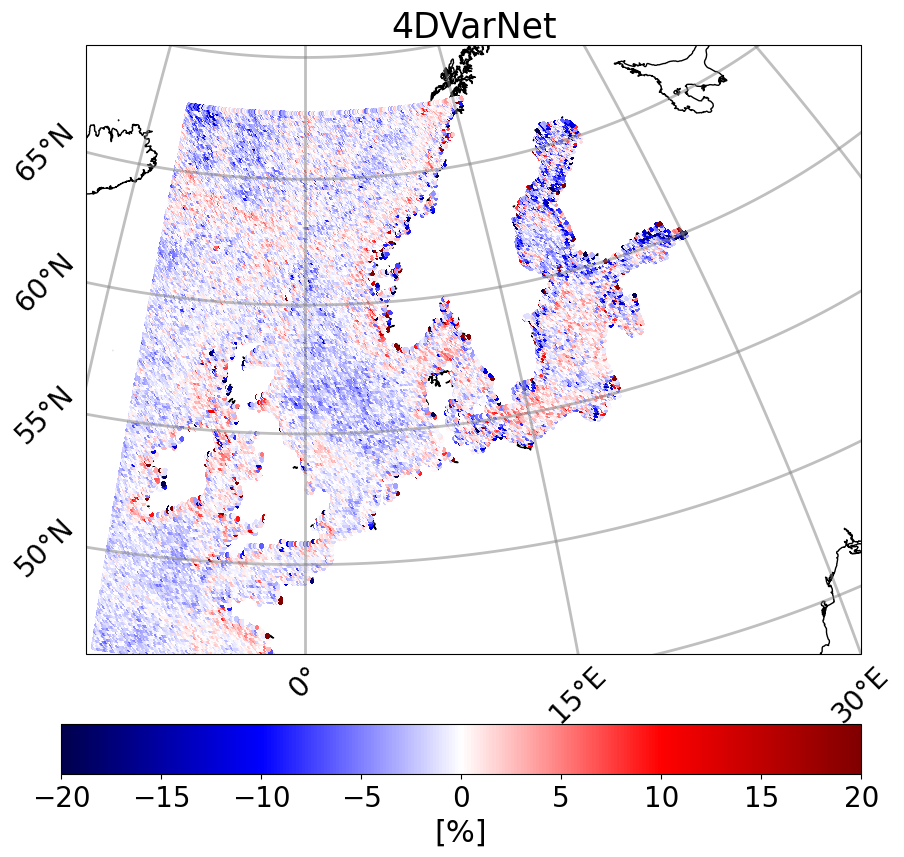

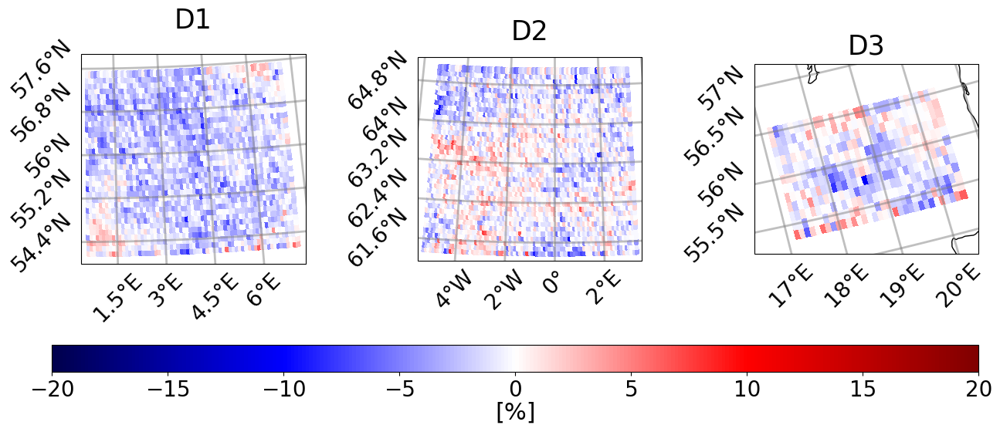

In [28]:
ds = [ xr.open_dataset(spa_filenames[i],group="diff").rmse for i in range(len(spa_filenames))] 
for i in range(len(ds)):
    lon_min = np.min(xr.open_dataset(filenames[i]).lon.data)
    lon_max = np.max(xr.open_dataset(filenames[i]).lon.data)
    lat_min = np.min(xr.open_dataset(filenames[i]).lat.data)
    lat_max = np.max(xr.open_dataset(filenames[i]).lat.data)
    ds[i] = ds[i].assign_coords(lon=np.mod(ds[i].lon -180.0,360.0)-180.0)
    ds[i] = ds[i].sortby(ds[i].lon).sel(lon=slice(lon_min,lon_max),lat=slice(lat_min,lat_max))

itrcp_spa_diff("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_flt"+val_flt+".png", ds[6], [ds[13]],
               ds[6].lon, ds[6].lat,
               figsize=(10,10),
               methods=["4DVarNet"],
               vmin=-20, vmax=20)
               
itrcp_spa_diff("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_bydm_flt"+val_flt+".png",
               [ ds[i] for i in [0,2,4] ], 
               [ ds[i] for i in [8,10,12] ],
               [ds[0].lon.data,  ds[2].lon.data, ds[4].lon.data], 
               [ds[0].lat.data,  ds[2].lat.data, ds[4].lat.data],
               methods=["D1","D2","D3"],
               figsize=(15,7),
               nr=1,nc=3,
               vmin=-20, vmax=20)

from PIL import Image
from IPython.display import display
img = Image.open("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_flt"+val_flt+".png")
display(img)
img = Image.open("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_bydm_flt"+val_flt+".png")
display(img)

#### 2.3.1.4 Temporal boxplots RMSE gain

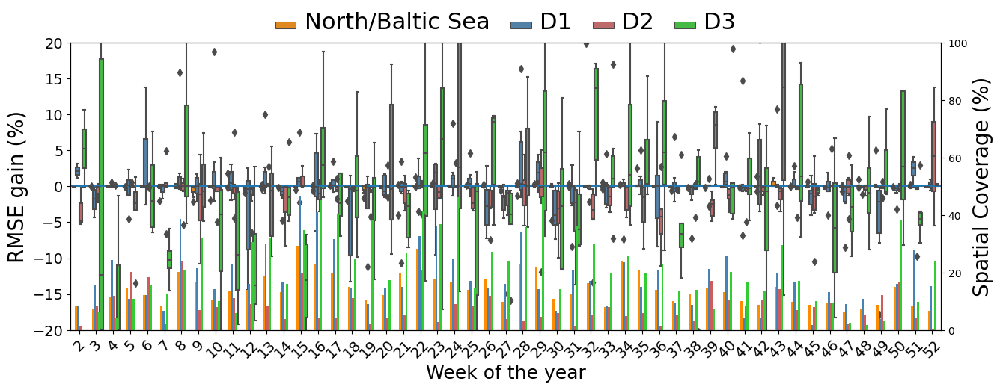

In [29]:
import seaborn
ts = pd.DataFrame(rmse_score[["rms_NB_seas_flt"+val_flt,
                              "rms_dm1_flt"+val_flt,
                              "rms_dm2_flt"+val_flt,
                              "rms_dm3_flt"+val_flt]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["D0","D1","D2","D3"])
ts["week"] = ts.index.isocalendar().week
ts["id"] = ts.index

ct = pd.DataFrame(rmse_score[["ds_count","ds_count_dm1","ds_count_dm2","ds_count_dm3"]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["D0","D1","D2","D3"])
ct["week"] = ct.index.isocalendar().week
ct["id"] = ct.index

data = pd.wide_to_long(ts,stubnames="D",i=["id"],j="domain")
data["domain"] = data.D.index.get_level_values("domain")

fig, ax = plt.subplots(figsize=(15,5))
bp = seaborn.boxplot(data=data,
                ax=ax, x="week",y="D", hue="domain",
                palette=["darkorange","steelblue","indianred","limegreen"])
labels = ["North/Baltic Sea","D1","D2","D3"]
for i in range(len(labels)):
    bp.legend_.texts[i].set_text(labels[i])
    
ax.set_ylabel("RMSE gain (%)",fontsize=20)
ax.margins(x=0) 
ax.set_ylim(-20,20)
plt.axhline(y=0)
axes2 = plt.twinx()
width=0.75
spatial_coverage=ct.groupby("week").mean().drop("id",axis=1)
p1 = spatial_coverage.plot(kind="bar",ax=axes2,
                           legend=False,color=["darkorange","steelblue","indianred","limegreen"])
axes2.set_ylim(0, 100)
axes2.set_ylabel("Spatial Coverage (%)",fontsize=20)
axes2.margins(x=0) 

seaborn.move_legend(
    bp, "lower center",
    bbox_to_anchor=(.5, 1), ncol=4, title=None, frameon=False)
ax.tick_params(axis="x", labelrotation=45)
ax.tick_params(axis="both", which="major", labelsize=14)
ax.set_xlabel("Week of the year", fontsize=18)
plt.setp(ax.get_legend().get_texts(), fontsize="22")
#plt.grid()
plt.savefig("/DATASET/mbeauchamp/DMI/postpro/boxplot_all_"+val_flt+".pdf", bbox_inches="tight")

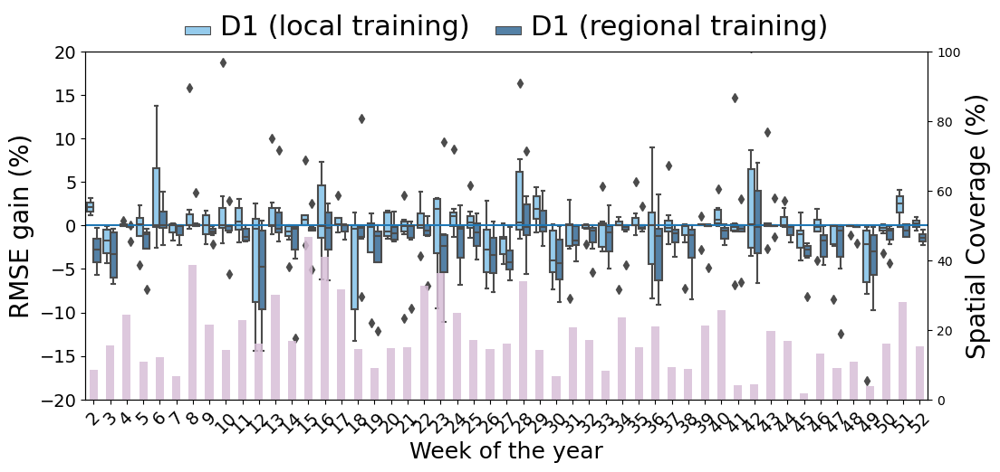

In [30]:
import seaborn
ts = pd.DataFrame(rmse_score[["rms_dm1_flt"+val_flt,
                              "rms_dm1_tr_all_flt"+val_flt]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["D_tr1","D_tr2"])
ts["week"] = ts.index.isocalendar().week
ts["id"] = ts.index

ct = pd.DataFrame(rmse_score[["ds_count_dm1"]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["C"])
ct["week"] = ct.index.isocalendar().week
ct["id"] = ct.index

data = pd.wide_to_long(ts,stubnames="D_tr",i=["id"],j="domain")
data["domain"] = data.D_tr.index.get_level_values("domain")

fig, ax = plt.subplots(figsize=(12,5))
bp = seaborn.boxplot(data=data,
                ax=ax, x="week",y="D_tr", hue="domain",
                palette=["lightskyblue","steelblue"])
labels = ["D1 (local training)","D1 (regional training)"]
for i in range(len(labels)):
    bp.legend_.texts[i].set_text(labels[i])
    
ax.set_ylabel("RMSE gain (%)",fontsize=20)
ax.set_ylim(-20,20)
ax.margins(x=0) 
plt.axhline(y=0)
axes2 = plt.twinx()
spatial_coverage=ct.groupby("week").mean().drop("id",axis=1)
p1 = spatial_coverage.C.plot(kind="bar",
               legend=False,color="thistle",alpha=0.85)
axes2.set_ylim(0, 100)
axes2.set_ylabel("Spatial Coverage (%)",fontsize=20)
axes2.margins(x=0) 
seaborn.move_legend(
    bp, "lower center",
    bbox_to_anchor=(.5, 1), ncol=2, title=None, frameon=False)
ax.tick_params(axis="x", labelrotation=45)
ax.tick_params(axis="both", which="major", labelsize=14)
ax.set_xlabel("Week of the year", fontsize=18)
plt.setp(ax.get_legend().get_texts(), fontsize="22")
#plt.grid()
plt.savefig("/DATASET/mbeauchamp/DMI/postpro/boxplot_dm1_"+val_flt+".pdf", bbox_inches="tight")

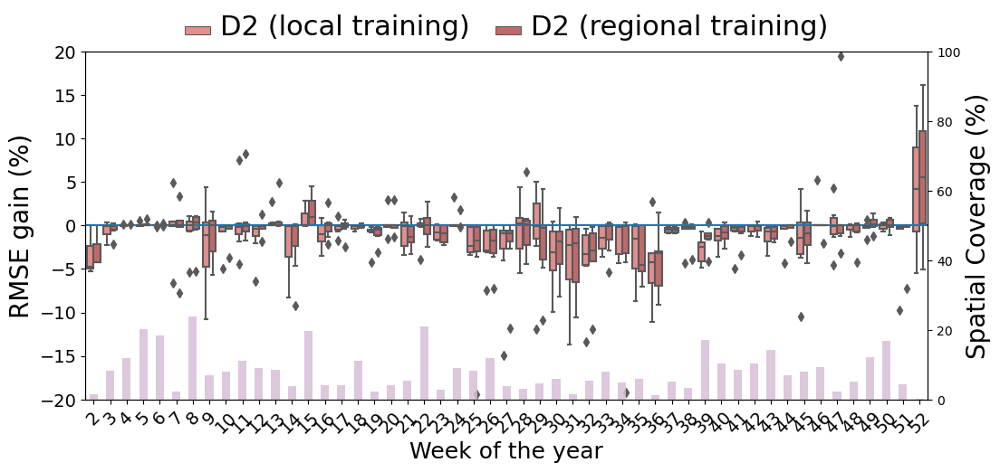

In [31]:
import seaborn
ts = pd.DataFrame(rmse_score[["rms_dm2_flt"+val_flt,
                              "rms_dm2_tr_all_flt"+val_flt]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["D_tr1","D_tr2"])
ts["week"] = ts.index.isocalendar().week
ts["id"] = ts.index

ct = pd.DataFrame(rmse_score[["ds_count_dm2"]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["C"])
ct["week"] = ct.index.isocalendar().week
ct["id"] = ct.index

data = pd.wide_to_long(ts,stubnames="D_tr",i=["id"],j="domain")
data["domain"] = data.D_tr.index.get_level_values("domain")

fig, ax = plt.subplots(figsize=(12,5))
bp = seaborn.boxplot(data=data,
                ax=ax, x="week",y="D_tr", hue="domain",
                palette=["lightcoral","indianred"])
labels = ["D2 (local training)","D2 (regional training)"]
for i in range(len(labels)):
    bp.legend_.texts[i].set_text(labels[i])
    
ax.set_ylabel("RMSE gain (%)",fontsize=20)
ax.set_ylim(-20,20)
ax.margins(x=0) 
plt.axhline(y=0)
axes2 = plt.twinx()
spatial_coverage=ct.groupby("week").mean().drop("id",axis=1)
p1 = spatial_coverage.C.plot(kind="bar",
               legend=False,color="thistle",alpha=0.85)
axes2.set_ylim(0, 100)
axes2.set_ylabel("Spatial Coverage (%)",fontsize=20)
axes2.margins(x=0) 
seaborn.move_legend(
    bp, "lower center",
    bbox_to_anchor=(.5, 1), ncol=2, title=None, frameon=False)
ax.tick_params(axis="x", labelrotation=45)
ax.tick_params(axis="both", which="major", labelsize=14)
ax.set_xlabel("Week of the year", fontsize=18)
plt.setp(ax.get_legend().get_texts(), fontsize="22")
#plt.grid()
plt.savefig("/DATASET/mbeauchamp/DMI/postpro/boxplot_dm2_"+val_flt+".pdf", bbox_inches="tight")

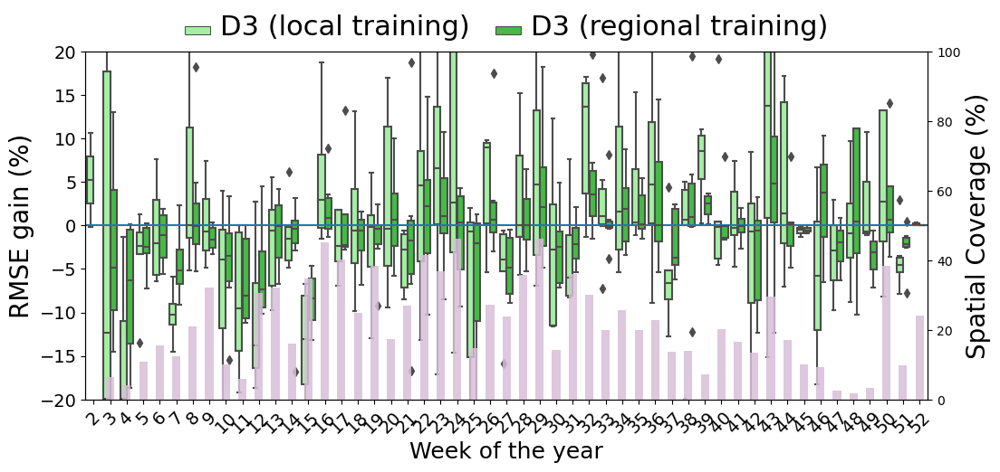

In [32]:
import seaborn
ts = pd.DataFrame(rmse_score[["rms_dm3_flt"+val_flt,
                              "rms_dm3_tr_all_flt"+val_flt]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["D_tr1","D_tr2"])
ts["week"] = ts.index.isocalendar().week
ts["id"] = ts.index

ct = pd.DataFrame(rmse_score[["ds_count_dm3"]].to_array().data.T, 
                      index=pd.DatetimeIndex(rmse_score.time),
                      columns=["C"])
ct["week"] = ct.index.isocalendar().week
ct["id"] = ct.index

data = pd.wide_to_long(ts,stubnames="D_tr",i=["id"],j="domain")
data["domain"] = data.D_tr.index.get_level_values("domain")

fig, ax = plt.subplots(figsize=(12,5))
bp = seaborn.boxplot(data=data,
                ax=ax, x="week",y="D_tr", hue="domain",
                palette=["palegreen","limegreen"])
labels = ["D3 (local training)","D3 (regional training)"]
for i in range(len(labels)):
    bp.legend_.texts[i].set_text(labels[i])
    
ax.set_ylabel("RMSE gain (%)",fontsize=20)
ax.set_ylim(-20,20)
ax.margins(x=0) 
plt.axhline(y=0)
axes2 = plt.twinx()
spatial_coverage=ct.groupby("week").mean().drop("id",axis=1)
p1 = spatial_coverage.C.plot(kind="bar",
               legend=False,color="thistle",alpha=0.85)
axes2.set_ylim(0, 100)
axes2.set_ylabel("Spatial Coverage (%)",fontsize=20)
axes2.margins(x=0) 
seaborn.move_legend(
    bp, "lower center",
    bbox_to_anchor=(.5, 1), ncol=2, title=None, frameon=False)
ax.tick_params(axis="x", labelrotation=45)
ax.tick_params(axis="both", which="major", labelsize=14)
ax.set_xlabel("Week of the year", fontsize=18)
plt.setp(ax.get_legend().get_texts(), fontsize="22")
#plt.grid()
plt.savefig("/DATASET/mbeauchamp/DMI/postpro/boxplot_dm3_"+val_flt+".pdf", bbox_inches="tight")

#### 2.3.1.5 Spectral plots

INFO:root: 
INFO:root:  Minimum spatial scale resolved = 999km


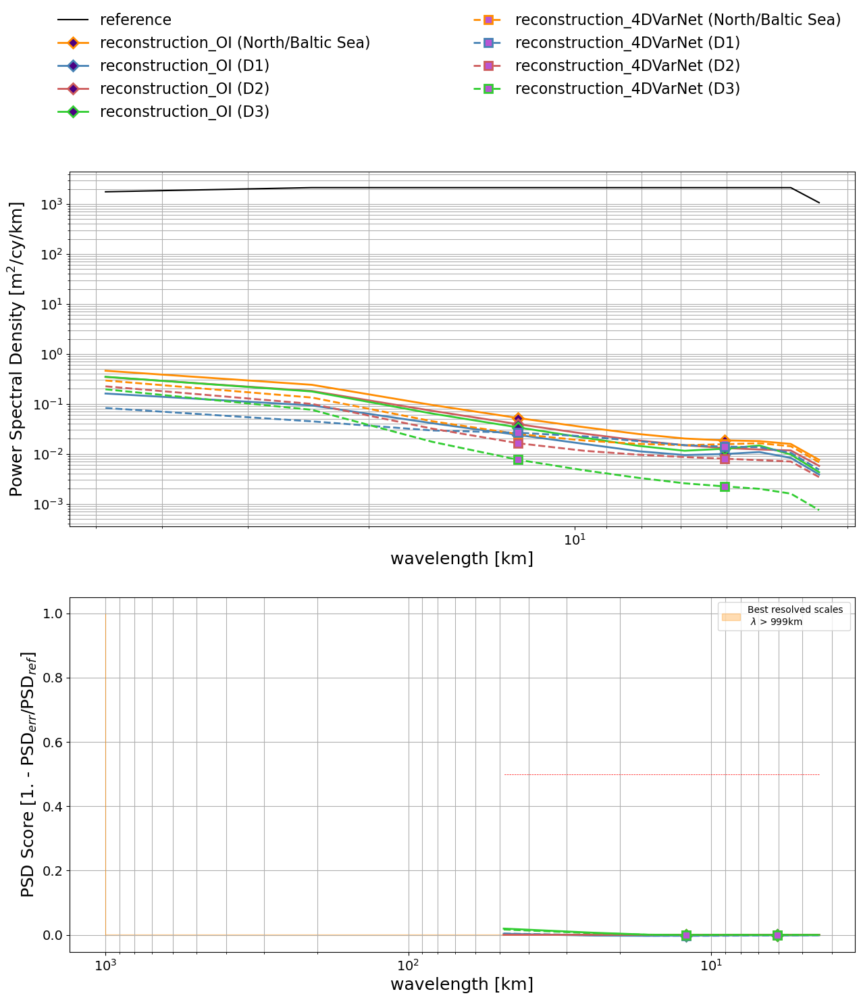

In [33]:
spectrum_filenames = ["/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_flt"+val_flt+".nc"]
methods = ["OI (North/Baltic Sea)","OI (D1)","OI (D2)","OI (D3)",
           "4DVarNet (North/Baltic Sea)","4DVarNet (D1)","4DVarNet (D2)","4DVarNet (D3)"]
marker = ["D","D","D","D","s","s","s","s"]
linestyle = ["solid","solid","solid","solid","dashed","dashed","dashed","dashed",]
colors = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
markerfacecolor = ["indigo","indigo","indigo","indigo","mediumorchid","mediumorchid","mediumorchid","mediumorchid"]
markeredgecolor = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
itrcp_spectrum("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spectrum_flt"+val_flt+".png",
                               spectrum_filenames,
                               methods,
                               colors,
                               linestyle,
                               marker,
                               markerfacecolor,
                               markeredgecolor
              )

#### 2.3.1.6 Leaderboard

In [34]:
data = np.array([['OI',leaderboard_nrmse_oi,leaderboard_nrmse_std_oi,int(leaderboard_psds_score_oi)],
                 ['4DVarNet',leaderboard_nrmse_dl,leaderboard_nrmse_std_dl,int(leaderboard_psds_score_dl)],
                 ['OI_dm1',leaderboard_nrmse_oi_dm1,leaderboard_nrmse_std_oi_dm1,int(leaderboard_psds_score_oi_dm1)],
                 ['4DVarNet_dm1r',leaderboard_nrmse_dl_dm1,leaderboard_nrmse_std_dl_dm1,int(leaderboard_psds_score_dl_dm1)],
                 ['4DVarNet_dm1l',leaderboard_nrmse_dl_dm1_tr_all,leaderboard_nrmse_std_dl_dm1_tr_all,int(leaderboard_psds_score_dl_dm1_tr_all)],
                 ['OI_dm2',leaderboard_nrmse_oi_dm2,leaderboard_nrmse_std_oi_dm2,int(leaderboard_psds_score_oi_dm2)],
                 ['4DVarNet_dm2r',leaderboard_nrmse_dl_dm2,leaderboard_nrmse_std_dl_dm2,int(leaderboard_psds_score_dl_dm2)],
                 ['4DVarNet_dm2l',leaderboard_nrmse_dl_dm2_tr_all,leaderboard_nrmse_std_dl_dm2_tr_all,int(leaderboard_psds_score_dl_dm2_tr_all)],
                 ['OI_dm3',leaderboard_nrmse_oi_dm3,leaderboard_nrmse_std_oi_dm3,int(leaderboard_psds_score_oi_dm3)],
                 ['4DVarNet_dm3r',leaderboard_nrmse_dl_dm3,leaderboard_nrmse_std_dl_dm3,int(leaderboard_psds_score_dl_dm3)],
                 ['4DVarNet_dm3l',leaderboard_nrmse_dl_dm3_tr_all,leaderboard_nrmse_std_dl_dm3_tr_all,int(leaderboard_psds_score_dl_dm3_tr_all)],                                  
                ])
Leaderboard = pd.DataFrame(data, 
                           columns=['Method', 
                                    "µ(RMSE) ", 
                                    "σ(RMSE)", 
                                    'λx (km)'])
print("Summary of the leaderboard metrics:")
Leaderboard
print(Leaderboard.to_markdown())

Summary of the leaderboard metrics:
|    | Method        |   µ(RMSE)  |   σ(RMSE) |   λx (km) |
|---:|:--------------|-----------:|----------:|----------:|
|  0 | OI            |   7.51445  |  32.3525  |       999 |
|  1 | 4DVarNet      |   7.56397  |  32.3551  |       999 |
|  2 | OI_dm1        |   0.846675 |   1.59776 |       999 |
|  3 | 4DVarNet_dm1r |   0.84576  |   1.5979  |       999 |
|  4 | 4DVarNet_dm1l |   0.84221  |   1.5991  |       999 |
|  5 | OI_dm2        |   4.134    |  18.2988  |       999 |
|  6 | 4DVarNet_dm2r |   4.12868  |  18.2999  |       999 |
|  7 | 4DVarNet_dm2l |   4.12977  |  18.2996  |       999 |
|  8 | OI_dm3        |   1.07261  |   7.20436 |       999 |
|  9 | 4DVarNet_dm3r |   1.07107  |   7.20514 |       999 |
| 10 | 4DVarNet_dm3l |   1.06947  |   7.20478 |       999 |


### 2.3.2 Seasonal analysis

#### 2.3.2.1 Compute NetCDF metrics file (spatial, temporal, spectral)

In [ ]:
val_flt="50"
file_dl = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext_flt"+val_flt+".nc"
file_dl_dm1 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval_flt"+val_flt+".nc"
file_dl_dm2 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval_flt"+val_flt+".nc"
file_dl_dm3 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval_flt"+val_flt+".nc"
file_oi = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation_flt"+val_flt+".nc"

bin_lat_step = 0.1
bin_lon_step = 0.1
bin_time_step = "1D"
delta_t = 0.9434  # s
velocity = 6.77   # km/s
delta_x = velocity * delta_t
delta_x = 2.2
lenght_scale = 1000 # km

sel_time = ["DJF"]
# NS-BS Seas
lon_min = np.min(xr.open_dataset(file_dl).lon.data)
lon_max = np.max(xr.open_dataset(file_dl).lon.data)
lat_min = np.min(xr.open_dataset(file_dl).lat.data)
lat_max = np.max(xr.open_dataset(file_dl).lat.data)
leaderboard_DJF_nrmse_dl, leaderboard_DJF_nrmse_std_dl, leaderboard_DJF_psds_score_dl = run_comparison(file_dl,"4DVarNet_DJF_flt"+val_flt,byseason=True,crop=True,
                                                                                                      file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_DJF_nrmse_oi, leaderboard_DJF_nrmse_std_oi, leaderboard_DJF_psds_score_oi = run_comparison(file_oi,"OI_DJF_flt"+val_flt,byseason=True,crop=True,
                                                                                                      file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
# D1
lon_min = np.min(xr.open_dataset(file_dl_dm1).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm1).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm1).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm1).lat.data)
leaderboard_DJF_nrmse_dl_dm1, leaderboard_DJF_nrmse_std_dl_dm1, leaderboard_DJF_psds_score_dl_dm1 = run_comparison(file_dl_dm1,"4DVarNet_D1_DJF_flt"+val_flt,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_DJF_nrmse_dl_dm1_tr_all, leaderboard_DJF_nrmse_std_dl_dm1_tr_all, leaderboard_DJF_psds_score_dl_dm1_tr_all = run_comparison(file_dl,"4DVarNet_D1_tr_all_DJF_flt"+val_flt,crop=True,byseason=True,
                                                                                                                                       file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_DJF_nrmse_oi_dm1, leaderboard_DJF_nrmse_std_oi_dm1, leaderboard_DJF_psds_score_oi_dm1 = run_comparison(file_oi,"OI_D1_DJF_flt"+val_flt,crop=True,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
# D2
lon_min = np.min(xr.open_dataset(file_dl_dm2).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm2).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm2).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm2).lat.data)
leaderboard_DJF_nrmse_dl_dm2, leaderboard_DJF_nrmse_std_dl_dm2, leaderboard_DJF_psds_score_dl_dm2 = run_comparison(file_dl_dm2,"4DVarNet_D2_DJF_flt"+val_flt,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_DJF_nrmse_dl_dm2_tr_all, leaderboard_DJF_nrmse_std_dl_dm2_tr_all, leaderboard_DJF_psds_score_dl_dm2_tr_all = run_comparison(file_dl,"4DVarNet_D2_tr_all_DJF_flt"+val_flt,crop=True,byseason=True,
                                                                                                                                       file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_DJF_nrmse_oi_dm2, leaderboard_DJF_nrmse_std_oi_dm2, leaderboard_DJF_psds_score_oi_dm2 = run_comparison(file_oi,"OI_D2_DJF_flt"+val_flt,crop=True,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
# D3
lon_min = np.min(xr.open_dataset(file_dl_dm3).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm3).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm3).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm3).lat.data)
leaderboard_DJF_nrmse_dl_dm3, leaderboard_DJF_nrmse_std_dl_dm3, leaderboard_DJF_psds_score_dl_dm3 = run_comparison(file_dl_dm3,"4DVarNet_D3_DJF_flt"+val_flt,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_DJF_nrmse_dl_dm3_tr_all, leaderboard_DJF_nrmse_std_dl_dm3_tr_all, leaderboard_DJF_psds_score_dl_dm3_tr_all = run_comparison(file_dl,"4DVarNet_D3_tr_all_DJF_flt"+val_flt,crop=True,byseason=True,
                                                                                                                                       file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_DJF_nrmse_oi_dm3, leaderboard_DJF_nrmse_std_oi_dm3, leaderboard_DJF_psds_score_oi_dm3 = run_comparison(file_oi,"OI_D3_DJF_flt"+val_flt,crop=True,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")

sel_time = ["MAM"]
# NS-BS Seas
lon_min = np.min(xr.open_dataset(file_dl).lon.data)
lon_max = np.max(xr.open_dataset(file_dl).lon.data)
lat_min = np.min(xr.open_dataset(file_dl).lat.data)
lat_max = np.max(xr.open_dataset(file_dl).lat.data)
leaderboard_MAM_nrmse_dl, leaderboard_MAM_nrmse_std_dl, leaderboard_MAM_psds_score_dl = run_comparison(file_dl,"4DVarNet_MAM_flt"+val_flt,byseason=True,crop=True,
                                                                                                      file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_MAM_nrmse_oi, leaderboard_MAM_nrmse_std_oi, leaderboard_MAM_psds_score_oi = run_comparison(file_oi,"OI_MAM_flt"+val_flt,byseason=True,crop=True,
                                                                                                      file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
# D1
lon_min = np.min(xr.open_dataset(file_dl_dm1).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm1).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm1).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm1).lat.data)
leaderboard_MAM_nrmse_dl_dm1, leaderboard_MAM_nrmse_std_dl_dm1, leaderboard_MAM_psds_score_dl_dm1 = run_comparison(file_dl_dm1,"4DVarNet_D1_MAM_flt"+val_flt,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_MAM_nrmse_dl_dm1_tr_all, leaderboard_MAM_nrmse_std_dl_dm1_tr_all, leaderboard_MAM_psds_score_dl_dm1_tr_all = run_comparison(file_dl,"4DVarNet_D1_tr_all_MAM_flt"+val_flt,crop=True,byseason=True,
                                                                                                                                       file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_MAM_nrmse_oi_dm1, leaderboard_MAM_nrmse_std_oi_dm1, leaderboard_MAM_psds_score_oi_dm1 = run_comparison(file_oi,"OI_D1_MAM_flt"+val_flt,crop=True,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
# D2
lon_min = np.min(xr.open_dataset(file_dl_dm2).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm2).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm2).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm2).lat.data)
leaderboard_MAM_nrmse_dl_dm2, leaderboard_MAM_nrmse_std_dl_dm2, leaderboard_MAM_psds_score_dl_dm2 = run_comparison(file_dl_dm2,"4DVarNet_D2_MAM_flt"+val_flt,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_MAM_nrmse_dl_dm2_tr_all, leaderboard_MAM_nrmse_std_dl_dm2_tr_all, leaderboard_MAM_psds_score_dl_dm2_tr_all = run_comparison(file_dl,"4DVarNet_D2_tr_all_MAM_flt"+val_flt,crop=True,byseason=True,
                                                                                                                                       file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_MAM_nrmse_oi_dm2, leaderboard_MAM_nrmse_std_oi_dm2, leaderboard_MAM_psds_score_oi_dm2 = run_comparison(file_oi,"OI_D2_MAM_flt"+val_flt,crop=True,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
# D3
lon_min = np.min(xr.open_dataset(file_dl_dm3).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm3).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm3).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm3).lat.data)
leaderboard_MAM_nrmse_dl_dm3, leaderboard_MAM_nrmse_std_dl_dm3, leaderboard_MAM_psds_score_dl_dm3 = run_comparison(file_dl_dm3,"4DVarNet_D3_MAM_flt"+val_flt,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_MAM_nrmse_dl_dm3_tr_all, leaderboard_MAM_nrmse_std_dl_dm3_tr_all, leaderboard_MAM_psds_score_dl_dm3_tr_all = run_comparison(file_dl,"4DVarNet_D3_tr_all_MAM_flt"+val_flt,crop=True,byseason=True,
                                                                                                                                       file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_MAM_nrmse_oi_dm3, leaderboard_MAM_nrmse_std_oi_dm3, leaderboard_MAM_psds_score_oi_dm3 = run_comparison(file_oi,"OI_D3_MAM_flt"+val_flt,crop=True,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")

sel_time = ["JJA"]
# NS-BS Seas
lon_min = np.min(xr.open_dataset(file_dl).lon.data)
lon_max = np.max(xr.open_dataset(file_dl).lon.data)
lat_min = np.min(xr.open_dataset(file_dl).lat.data)
lat_max = np.max(xr.open_dataset(file_dl).lat.data)
leaderboard_JJA_nrmse_dl, leaderboard_JJA_nrmse_std_dl, leaderboard_JJA_psds_score_dl = run_comparison(file_dl,"4DVarNet_JJA_flt"+val_flt,byseason=True,crop=True,
                                                                                                      file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_JJA_nrmse_oi, leaderboard_JJA_nrmse_std_oi, leaderboard_JJA_psds_score_oi = run_comparison(file_oi,"OI_JJA_flt"+val_flt,byseason=True,crop=True,
                                                                                                      file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
# D1
lon_min = np.min(xr.open_dataset(file_dl_dm1).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm1).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm1).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm1).lat.data)
leaderboard_JJA_nrmse_dl_dm1, leaderboard_JJA_nrmse_std_dl_dm1, leaderboard_JJA_psds_score_dl_dm1 = run_comparison(file_dl_dm1,"4DVarNet_D1_JJA_flt"+val_flt,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_JJA_nrmse_dl_dm1_tr_all, leaderboard_JJA_nrmse_std_dl_dm1_tr_all, leaderboard_JJA_psds_score_dl_dm1_tr_all = run_comparison(file_dl,"4DVarNet_D1_tr_all_JJA_flt"+val_flt,crop=True,byseason=True,
                                                                                                                                       file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_JJA_nrmse_oi_dm1, leaderboard_JJA_nrmse_std_oi_dm1, leaderboard_JJA_psds_score_oi_dm1 = run_comparison(file_oi,"OI_D1_JJA_flt"+val_flt,crop=True,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
# D2
lon_min = np.min(xr.open_dataset(file_dl_dm2).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm2).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm2).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm2).lat.data)
leaderboard_JJA_nrmse_dl_dm2, leaderboard_JJA_nrmse_std_dl_dm2, leaderboard_JJA_psds_score_dl_dm2 = run_comparison(file_dl_dm2,"4DVarNet_D2_JJA_flt"+val_flt,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_JJA_nrmse_dl_dm2_tr_all, leaderboard_JJA_nrmse_std_dl_dm2_tr_all, leaderboard_JJA_psds_score_dl_dm2_tr_all = run_comparison(file_dl,"4DVarNet_D2_tr_all_JJA_flt"+val_flt,crop=True,byseason=True,
                                                                                                                                       file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_JJA_nrmse_oi_dm2, leaderboard_JJA_nrmse_std_oi_dm2, leaderboard_JJA_psds_score_oi_dm2 = run_comparison(file_oi,"OI_D2_JJA_flt"+val_flt,crop=True,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
# D3
lon_min = np.min(xr.open_dataset(file_dl_dm3).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm3).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm3).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm3).lat.data)
leaderboard_JJA_nrmse_dl_dm3, leaderboard_JJA_nrmse_std_dl_dm3, leaderboard_JJA_psds_score_dl_dm3 = run_comparison(file_dl_dm3,"4DVarNet_D3_JJA_flt"+val_flt,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_JJA_nrmse_dl_dm3_tr_all, leaderboard_JJA_nrmse_std_dl_dm3_tr_all, leaderboard_JJA_psds_score_dl_dm3_tr_all = run_comparison(file_dl,"4DVarNet_D3_tr_all_JJA_flt"+val_flt,crop=True,byseason=True,
                                                                                                                                       file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_JJA_nrmse_oi_dm3, leaderboard_JJA_nrmse_std_oi_dm3, leaderboard_JJA_psds_score_oi_dm3 = run_comparison(file_oi,"OI_D3_JJA_flt"+val_flt,crop=True,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")

sel_time = ["SON"]
# NS-BS Seas
lon_min = np.min(xr.open_dataset(file_dl).lon.data)
lon_max = np.max(xr.open_dataset(file_dl).lon.data)
lat_min = np.min(xr.open_dataset(file_dl).lat.data)
lat_max = np.max(xr.open_dataset(file_dl).lat.data)
leaderboard_SON_nrmse_dl, leaderboard_SON_nrmse_std_dl, leaderboard_SON_psds_score_dl = run_comparison(file_dl,"4DVarNet_SON_flt"+val_flt,byseason=True,crop=True,
                                                                                                      file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_SON_nrmse_oi, leaderboard_SON_nrmse_std_oi, leaderboard_SON_psds_score_oi = run_comparison(file_oi,"OI_SON_flt"+val_flt,byseason=True,crop=True,
                                                                                                      file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
# D1
lon_min = np.min(xr.open_dataset(file_dl_dm1).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm1).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm1).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm1).lat.data)
leaderboard_SON_nrmse_dl_dm1, leaderboard_SON_nrmse_std_dl_dm1, leaderboard_SON_psds_score_dl_dm1 = run_comparison(file_dl_dm1,"4DVarNet_D1_SON_flt"+val_flt,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_SON_nrmse_dl_dm1_tr_all, leaderboard_SON_nrmse_std_dl_dm1_tr_all, leaderboard_SON_psds_score_dl_dm1_tr_all = run_comparison(file_dl,"4DVarNet_D1_tr_all_SON_flt"+val_flt,crop=True,byseason=True,
                                                                                                                                       file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_SON_nrmse_oi_dm1, leaderboard_SON_nrmse_std_oi_dm1, leaderboard_SON_psds_score_oi_dm1 = run_comparison(file_oi,"OI_D1_SON_flt"+val_flt,crop=True,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
# D2
lon_min = np.min(xr.open_dataset(file_dl_dm2).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm2).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm2).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm2).lat.data)
leaderboard_SON_nrmse_dl_dm2, leaderboard_SON_nrmse_std_dl_dm2, leaderboard_SON_psds_score_dl_dm2 = run_comparison(file_dl_dm2,"4DVarNet_D2_SON_flt"+val_flt,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_SON_nrmse_dl_dm2_tr_all, leaderboard_SON_nrmse_std_dl_dm2_tr_all, leaderboard_SON_psds_score_dl_dm2_tr_all = run_comparison(file_dl,"4DVarNet_D2_tr_all_SON_flt"+val_flt,crop=True,byseason=True,
                                                                                                                                       file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_SON_nrmse_oi_dm2, leaderboard_SON_nrmse_std_oi_dm2, leaderboard_SON_psds_score_oi_dm2 = run_comparison(file_oi,"OI_D2_SON_flt"+val_flt,crop=True,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
# D3
lon_min = np.min(xr.open_dataset(file_dl_dm3).lon.data)
lon_max = np.max(xr.open_dataset(file_dl_dm3).lon.data)
lat_min = np.min(xr.open_dataset(file_dl_dm3).lat.data)
lat_max = np.max(xr.open_dataset(file_dl_dm3).lat.data)
leaderboard_SON_nrmse_dl_dm3, leaderboard_SON_nrmse_std_dl_dm3, leaderboard_SON_psds_score_dl_dm3 = run_comparison(file_dl_dm3,"4DVarNet_D3_SON_flt"+val_flt,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_SON_nrmse_dl_dm3_tr_all, leaderboard_SON_nrmse_std_dl_dm3_tr_all, leaderboard_SON_psds_score_dl_dm3_tr_all = run_comparison(file_dl,"4DVarNet_D3_tr_all_SON_flt"+val_flt,crop=True,byseason=True,
                                                                                                                                       file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")
leaderboard_SON_nrmse_oi_dm3, leaderboard_SON_nrmse_std_oi_dm3, leaderboard_SON_psds_score_oi_dm3 = run_comparison(file_oi,"OI_D3_SON_flt"+val_flt,crop=True,byseason=True,
                                                                                                                  file_obs = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L3S_GHRSST-SSTsubskin-night_SST_UHR_NRT-NSEABALTIC_validation_s1_flt"+val_flt+".nc")

#### 2.3.2.2 Spatial RMSE gain mapping 

In [9]:
val_flt = "50"
spa_stat_filenames_OI_DJF = ["/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_DJF_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_DJF_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_DJF_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_DJF_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_DJF_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_DJF_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_DJF_flt"+val_flt+".nc"]
spa_stat_filenames_4DVarNet_DJF = ["/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_DJF_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_DJF_flt"+val_flt+".nc",
                         "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_DJF_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_DJF_flt"+val_flt+".nc",
                         "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_DJF_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_DJF_flt"+val_flt+".nc",
                        "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_DJF_flt"+val_flt+".nc"]

spa_stat_filenames_OI_MAM = ["/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_MAM_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_MAM_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_MAM_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_MAM_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_MAM_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_MAM_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_MAM_flt"+val_flt+".nc"]
spa_stat_filenames_4DVarNet_MAM = ["/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_MAM_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_MAM_flt"+val_flt+".nc",
                         "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_MAM_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_MAM_flt"+val_flt+".nc",
                         "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_MAM_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_MAM_flt"+val_flt+".nc",
                        "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_MAM_flt"+val_flt+".nc"]

spa_stat_filenames_OI_JJA = ["/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_JJA_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_JJA_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_JJA_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_JJA_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_JJA_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_JJA_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_JJA_flt"+val_flt+".nc"]
spa_stat_filenames_4DVarNet_JJA = ["/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_JJA_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_JJA_flt"+val_flt+".nc",
                         "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_JJA_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_JJA_flt"+val_flt+".nc",
                         "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_JJA_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_JJA_flt"+val_flt+".nc",
                        "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_JJA_flt"+val_flt+".nc"]

spa_stat_filenames_OI_SON = ["/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_SON_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D1_SON_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_SON_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D2_SON_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_SON_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_D3_SON_flt"+val_flt+".nc",
                  "/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_SON_flt"+val_flt+".nc"]
spa_stat_filenames_4DVarNet_SON = ["/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_SON_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D1_tr_all_SON_flt"+val_flt+".nc",
                         "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_SON_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D2_tr_all_SON_flt"+val_flt+".nc",
                         "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_SON_flt"+val_flt+".nc","/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_D3_tr_all_SON_flt"+val_flt+".nc",
                        "/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_SON_flt"+val_flt+".nc"]

file_dl = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext_flt"+val_flt+".nc"
file_dl_dm1 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm1_eval_flt"+val_flt+".nc"
file_dl_dm2 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm2_eval_flt"+val_flt+".nc"
file_dl_dm3 = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_dm3_eval_flt"+val_flt+".nc"
file_oi = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation_flt"+val_flt+".nc"

spa_filenames_DJF =  spa_stat_filenames_OI_DJF + spa_stat_filenames_4DVarNet_DJF
spa_filenames_MAM =  spa_stat_filenames_OI_MAM + spa_stat_filenames_4DVarNet_MAM
spa_filenames_JJA =  spa_stat_filenames_OI_JJA + spa_stat_filenames_4DVarNet_JJA
spa_filenames_SON =  spa_stat_filenames_OI_SON + spa_stat_filenames_4DVarNet_SON
filenames = [file_dl_dm1,file_dl_dm1,file_dl_dm2,file_dl_dm2,file_dl_dm3,file_dl_dm3,file_dl]
filenames = filenames + filenames

0 0
0 1
1 0
1 1
0 0
0 1
1 0
1 1
0 0
0 1
1 0
1 1
0 0
0 1
1 0
1 1


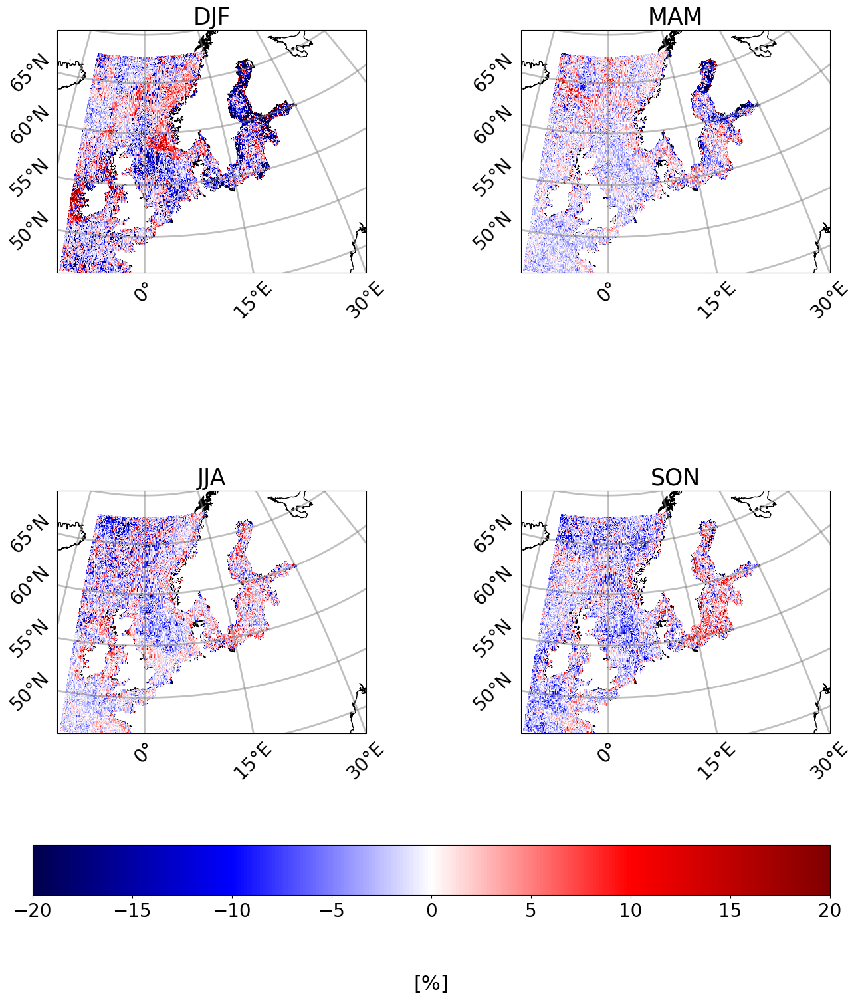

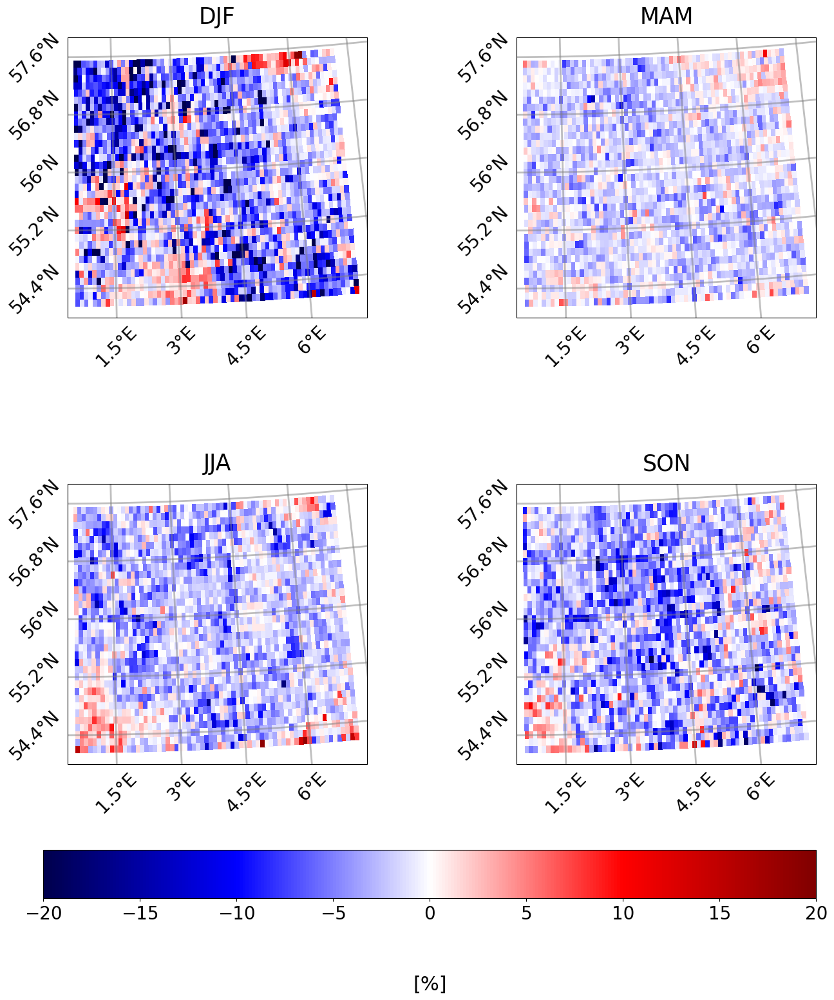

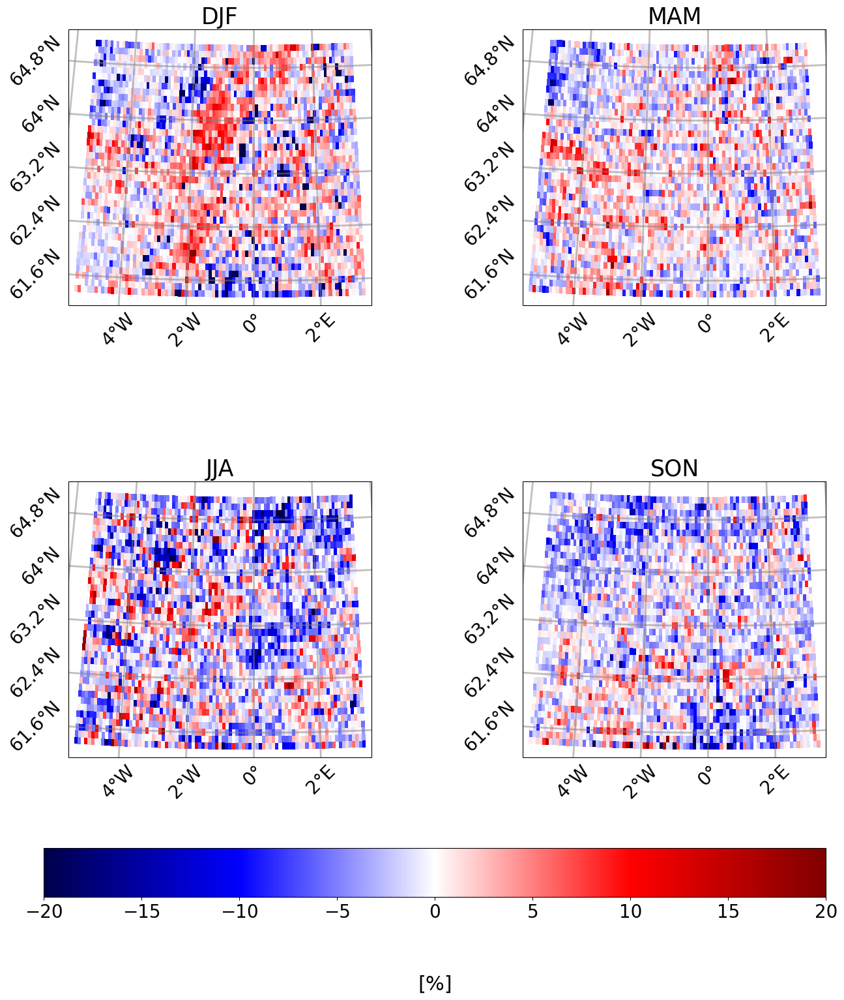

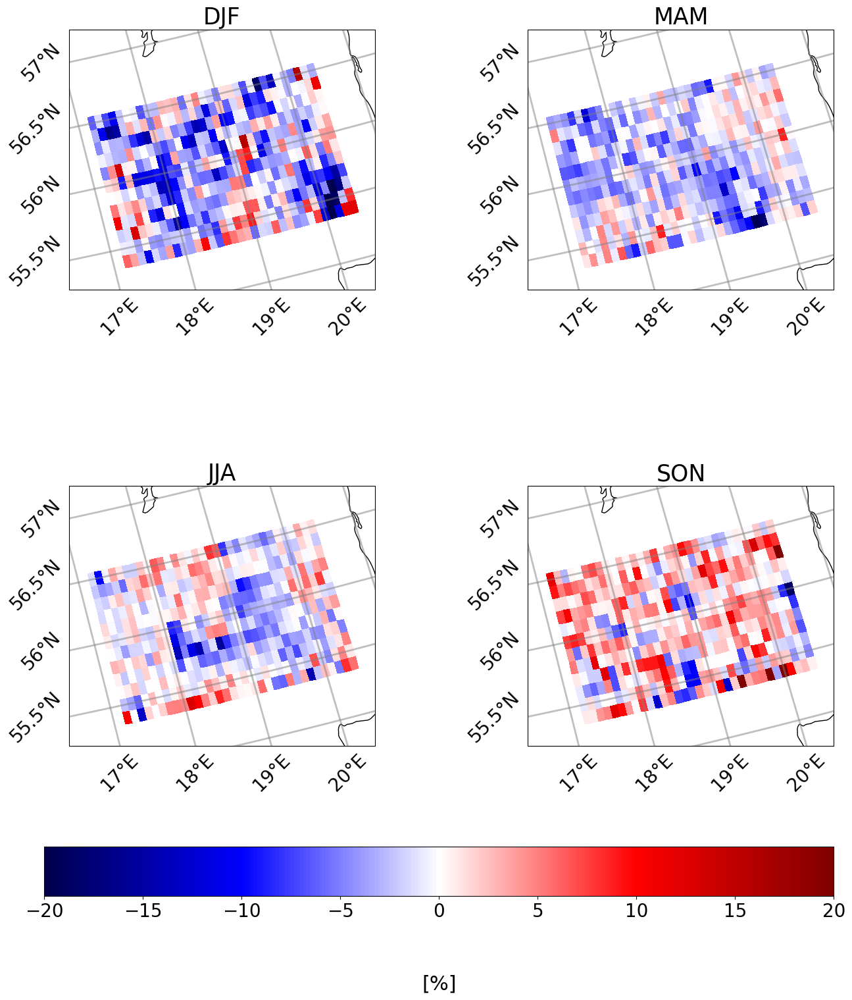

In [28]:
ds_DJF = [ xr.open_dataset(spa_filenames_DJF[i],group="diff").rmse for i in range(len(spa_filenames_DJF))] 
ds_MAM = [ xr.open_dataset(spa_filenames_MAM[i],group="diff").rmse for i in range(len(spa_filenames_MAM))] 
ds_JJA = [ xr.open_dataset(spa_filenames_JJA[i],group="diff").rmse for i in range(len(spa_filenames_JJA))] 
ds_SON = [ xr.open_dataset(spa_filenames_SON[i],group="diff").rmse for i in range(len(spa_filenames_SON))] 
for i in range(len(ds_DJF)):
    lon_min = np.min(xr.open_dataset(filenames[i]).lon.data)
    lon_max = np.max(xr.open_dataset(filenames[i]).lon.data)
    lat_min = np.min(xr.open_dataset(filenames[i]).lat.data)
    lat_max = np.max(xr.open_dataset(filenames[i]).lat.data)
    ds_DJF[i] = ds_DJF[i].assign_coords(lon=np.mod(ds_DJF[i].lon -180.0,360.0)-180.0)
    ds_DJF[i] = ds_DJF[i].sortby(ds_DJF[i].lon).sel(lon=slice(lon_min,lon_max),lat=slice(lat_min,lat_max))
    ds_MAM[i] = ds_MAM[i].assign_coords(lon=np.mod(ds_MAM[i].lon -180.0,360.0)-180.0)
    ds_MAM[i] = ds_MAM[i].sortby(ds_MAM[i].lon).sel(lon=slice(lon_min,lon_max),lat=slice(lat_min,lat_max))
    ds_JJA[i] = ds_JJA[i].assign_coords(lon=np.mod(ds_JJA[i].lon -180.0,360.0)-180.0)
    ds_JJA[i] = ds_JJA[i].sortby(ds_JJA[i].lon).sel(lon=slice(lon_min,lon_max),lat=slice(lat_min,lat_max))
    ds_SON[i] = ds_SON[i].assign_coords(lon=np.mod(ds_SON[i].lon -180.0,360.0)-180.0)
    ds_SON[i] = ds_SON[i].sortby(ds_SON[i].lon).sel(lon=slice(lon_min,lon_max),lat=slice(lat_min,lat_max))
    
itrcp_spa_diff("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_byseason_flt"+val_flt+".png",
               [ ds_DJF[6], ds_MAM[6], ds_JJA[6], ds_SON[6] ], 
               [ ds_DJF[13], ds_MAM[13], ds_JJA[13], ds_SON[13] ],
               ds_DJF[6].lon, ds_DJF[6].lat, ["DJF","MAM","JJA","SON"],
               nr=2,nc=2,
               figsize=(15,15),
               vmin=-20, vmax=20)

itrcp_spa_diff("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_dm1_byseason_flt"+val_flt+".png",
               [ ds_DJF[0], ds_MAM[0], ds_JJA[0], ds_SON[0] ], 
               [ ds_DJF[8], ds_MAM[8], ds_JJA[8], ds_SON[8] ],
               ds_DJF[0].lon, ds_DJF[0].lat, ["DJF","MAM","JJA","SON"],
               nr=2,nc=2,
               figsize=(15,15),
               vmin=-20, vmax=20)

itrcp_spa_diff("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_dm2_byseason_flt"+val_flt+".png",
               [ ds_DJF[2], ds_MAM[2], ds_JJA[2], ds_SON[2] ], 
               [ ds_DJF[10], ds_MAM[10], ds_JJA[10], ds_SON[10] ],
               ds_DJF[2].lon, ds_DJF[2].lat, ["DJF","MAM","JJA","SON"],
               nr=2,nc=2,
               figsize=(15,15),
               vmin=-20, vmax=20)

itrcp_spa_diff("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_dm3_byseason_flt"+val_flt+".png",
               [ ds_DJF[4], ds_MAM[4], ds_JJA[4], ds_SON[4] ], 
               [ ds_DJF[12], ds_MAM[12], ds_JJA[12], ds_SON[12] ],
               ds_DJF[4].lon, ds_DJF[4].lat, ["DJF","MAM","JJA","SON"],
               nr=2,nc=2,
               figsize=(15,15),
               vmin=-20, vmax=20)

from PIL import Image
from IPython.display import display
img = Image.open("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_byseason_flt"+val_flt+".png")
display(img)
img = Image.open("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_dm1_byseason_flt"+val_flt+".png")
display(img)
img = Image.open("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_dm2_byseason_flt"+val_flt+".png")
display(img)
img = Image.open("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spa_diff_dm3_byseason_flt"+val_flt+".png")
display(img)

#### 2.3.2.3 Spectral plots

In [ ]:
spectrum_filenames = ["/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_DJF_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_MAM_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_JJA_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_SON_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_DJF_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_MAM_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_JJA_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_SON_flt"+val_flt+".nc"]
methods = ["OI (North/Baltic Sea), DJF",
           "OI (North/Baltic Sea), MAM",
           "OI (North/Baltic Sea), JJA",
           "OI (North/Baltic Sea), SON",
           "4DVarNet (North/Baltic Sea), DJF",
           "4DVarNet (North/Baltic Sea), MAM",
           "4DVarNet (North/Baltic Sea), JJA",
           "4DVarNet (North/Baltic Sea), SON"]
marker = ["D","D","D","D","s","s","s","s"]
linestyle = ["solid","solid","solid","solid","dashed","dashed","dashed","dashed",]
colors = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
markerfacecolor = ["indigo","indigo","indigo","indigo","mediumorchid","mediumorchid","mediumorchid","mediumorchid"]
markeredgecolor = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
itrcp_spectrum("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spectrum_DJF_"+val_flt+".png",
                               spectrum_filenames,
                               methods,
                               colors,
                               linestyle,
                               marker,
                               markerfacecolor,
                               markeredgecolor
              )

spectrum_filenames = ["/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_DJF_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_MAM_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_JJA_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D1_SON_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_DJF_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_MAM_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_JJA_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D1_SON_flt"+val_flt+".nc"]
methods = ["OI (D1), DJF",
           "OI (D1), MAM",
           "OI (D1), JJA",
           "OI (D1), SON",
           "4DVarNet (D1), DJF",
           "4DVarNet (D1), MAM",
           "4DVarNet (D1), JJA",
           "4DVarNet (D1), SON"]
marker = ["D","D","D","D","s","s","s","s"]
linestyle = ["solid","solid","solid","solid","dashed","dashed","dashed","dashed",]
colors = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
markerfacecolor = ["indigo","indigo","indigo","indigo","mediumorchid","mediumorchid","mediumorchid","mediumorchid"]
markeredgecolor = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
itrcp_spectrum("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spectrum_D1_DJF_"+val_flt+".png",
                               spectrum_filenames,
                               methods,
                               colors,
                               linestyle,
                               marker,
                               markerfacecolor,
                               markeredgecolor
              )

spectrum_filenames = ["/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_DJF_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_MAM_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_JJA_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D2_SON_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_DJF_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_MAM_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_JJA_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D2_SON_flt"+val_flt+".nc"]
methods = ["OI (D2), DJF",
           "OI (D2), MAM",
           "OI (D2), JJA",
           "OI (D2), SON",
           "4DVarNet (D2), DJF",
           "4DVarNet (D2), MAM",
           "4DVarNet (D2), JJA",
           "4DVarNet (D2), SON"]
marker = ["D","D","D","D","s","s","s","s"]
linestyle = ["solid","solid","solid","solid","dashed","dashed","dashed","dashed",]
colors = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
markerfacecolor = ["indigo","indigo","indigo","indigo","mediumorchid","mediumorchid","mediumorchid","mediumorchid"]
markeredgecolor = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
itrcp_spectrum("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spectrum_D2_DJF_"+val_flt+".png",
                               spectrum_filenames,
                               methods,
                               colors,
                               linestyle,
                               marker,
                               markerfacecolor,
                               markeredgecolor
              )

spectrum_filenames = ["/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_DJF_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_MAM_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_JJA_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_D3_SON_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_DJF_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_MAM_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_JJA_flt"+val_flt+".nc",
                      "/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_D3_SON_flt"+val_flt+".nc"]
methods = ["OI (D3), DJF",
           "OI (D3), MAM",
           "OI (D3), JJA",
           "OI (D3), SON",
           "4DVarNet (D3), DJF",
           "4DVarNet (D3), MAM",
           "4DVarNet (D3), JJA",
           "4DVarNet (D3), SON"]
marker = ["D","D","D","D","s","s","s","s"]
linestyle = ["solid","solid","solid","solid","dashed","dashed","dashed","dashed",]
colors = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
markerfacecolor = ["indigo","indigo","indigo","indigo","mediumorchid","mediumorchid","mediumorchid","mediumorchid"]
markeredgecolor = ["darkorange","steelblue","indianred","limegreen","darkorange","steelblue","indianred","limegreen"]
itrcp_spectrum("/DATASET/mbeauchamp/DMI/postpro/Benchmark_spectrum_D3_DJF_"+val_flt+".png",
                               spectrum_filenames,
                               methods,
                               colors,
                               linestyle,
                               marker,
                               markerfacecolor,
                               markeredgecolor
              )

#### 2.3.2.4 Leaderboard

In [ ]:
data = np.array([
                 ['OI_DJF',leaderboard_DJF_nrmse_oi,leaderboard_DJF_nrmse_std_oi,int(leaderboard_DJF_psds_score_oi)],
                 ['4DVarNet_DJF',leaderboard_DJF_nrmse_dl,leaderboard_DJF_nrmse_std_dl,int(leaderboard_DJF_psds_score_dl)],
                 ['OI_dm1_DJF',leaderboard_DJF_nrmse_oi_dm1,leaderboard_DJF_nrmse_std_oi_dm1,int(leaderboard_DJF_psds_score_oi_dm1)],
                 ['4DVarNet_dm1r_DJF',leaderboard_DJF_nrmse_dl_dm1,leaderboard_DJF_nrmse_std_dl_dm1,int(leaderboard_DJF_psds_score_dl_dm1)],
                 ['4DVarNet_dm1l_DJF',leaderboard_DJF_nrmse_dl_dm1_tr_all,leaderboard_DJF_nrmse_std_dl_dm1_tr_all,int(leaderboard_DJF_psds_score_dl_dm1_tr_all)],
                 ['OI_dm2_DJF',leaderboard_DJF_nrmse_oi_dm2,leaderboard_DJF_nrmse_std_oi_dm2,int(leaderboard_DJF_psds_score_oi_dm2)],
                 ['4DVarNet_dm2r_DJF',leaderboard_DJF_nrmse_dl_dm2,leaderboard_DJF_nrmse_std_dl_dm2,int(leaderboard_DJF_psds_score_dl_dm2)],
                 ['4DVarNet_dm2l_DJF',leaderboard_DJF_nrmse_dl_dm2_tr_all,leaderboard_DJF_nrmse_std_dl_dm2_tr_all,int(leaderboard_DJF_psds_score_dl_dm2_tr_all)],
                 ['OI_dm3_DJF',leaderboard_DJF_nrmse_oi_dm3,leaderboard_DJF_nrmse_std_oi_dm3,int(leaderboard_DJF_psds_score_oi_dm3)],
                 ['4DVarNet_dm3r_DJF',leaderboard_DJF_nrmse_dl_dm3,leaderboard_DJF_nrmse_std_dl_dm3,int(leaderboard_DJF_psds_score_dl_dm3)],
                 ['4DVarNet_dm3l_DJF',leaderboard_DJF_nrmse_dl_dm3_tr_all,leaderboard_DJF_nrmse_std_dl_dm3_tr_all,int(leaderboard_DJF_psds_score_dl_dm3_tr_all)], 
                 ['OI_MAM',leaderboard_MAM_nrmse_oi,leaderboard_MAM_nrmse_std_oi,int(leaderboard_MAM_psds_score_oi)],
                 ['4DVarNet_MAM',leaderboard_MAM_nrmse_dl,leaderboard_MAM_nrmse_std_dl,int(leaderboard_MAM_psds_score_dl)],
                 ['OI_dm1_MAM',leaderboard_MAM_nrmse_oi_dm1,leaderboard_MAM_nrmse_std_oi_dm1,int(leaderboard_MAM_psds_score_oi_dm1)],
                 ['4DVarNet_dm1r_MAM',leaderboard_MAM_nrmse_dl_dm1,leaderboard_MAM_nrmse_std_dl_dm1,int(leaderboard_MAM_psds_score_dl_dm1)],
                 ['4DVarNet_dm1l_MAM',leaderboard_MAM_nrmse_dl_dm1_tr_all,leaderboard_MAM_nrmse_std_dl_dm1_tr_all,int(leaderboard_MAM_psds_score_dl_dm1_tr_all)],
                 ['OI_dm2_MAM',leaderboard_MAM_nrmse_oi_dm2,leaderboard_MAM_nrmse_std_oi_dm2,int(leaderboard_MAM_psds_score_oi_dm2)],
                 ['4DVarNet_dm2r_MAM',leaderboard_MAM_nrmse_dl_dm2,leaderboard_MAM_nrmse_std_dl_dm2,int(leaderboard_MAM_psds_score_dl_dm2)],
                 ['4DVarNet_dm2l_MAM',leaderboard_MAM_nrmse_dl_dm2_tr_all,leaderboard_MAM_nrmse_std_dl_dm2_tr_all,int(leaderboard_MAM_psds_score_dl_dm2_tr_all)],
                 ['OI_dm3_MAM',leaderboard_MAM_nrmse_oi_dm3,leaderboard_MAM_nrmse_std_oi_dm3,int(leaderboard_MAM_psds_score_oi_dm3)],
                 ['4DVarNet_dm3r_MAM',leaderboard_MAM_nrmse_dl_dm3,leaderboard_MAM_nrmse_std_dl_dm3,int(leaderboard_MAM_psds_score_dl_dm3)],
                 ['4DVarNet_dm3l_MAM',leaderboard_MAM_nrmse_dl_dm3_tr_all,leaderboard_MAM_nrmse_std_dl_dm3_tr_all,int(leaderboard_MAM_psds_score_dl_dm3_tr_all)],      
                 ['OI_JJA',leaderboard_JJA_nrmse_oi,leaderboard_JJA_nrmse_std_oi,int(leaderboard_JJA_psds_score_oi)],
                 ['4DVarNet_JJA',leaderboard_JJA_nrmse_dl,leaderboard_JJA_nrmse_std_dl,int(leaderboard_JJA_psds_score_dl)],
                 ['OI_dm1_JJA',leaderboard_JJA_nrmse_oi_dm1,leaderboard_JJA_nrmse_std_oi_dm1,int(leaderboard_JJA_psds_score_oi_dm1)],
                 ['4DVarNet_dm1r_JJA',leaderboard_JJA_nrmse_dl_dm1,leaderboard_JJA_nrmse_std_dl_dm1,int(leaderboard_JJA_psds_score_dl_dm1)],
                 ['4DVarNet_dm1l_JJA',leaderboard_JJA_nrmse_dl_dm1_tr_all,leaderboard_JJA_nrmse_std_dl_dm1_tr_all,int(leaderboard_JJA_psds_score_dl_dm1_tr_all)],
                 ['OI_dm2_JJA',leaderboard_JJA_nrmse_oi_dm2,leaderboard_JJA_nrmse_std_oi_dm2,int(leaderboard_JJA_psds_score_oi_dm2)],
                 ['4DVarNet_dm2r_JJA',leaderboard_JJA_nrmse_dl_dm2,leaderboard_JJA_nrmse_std_dl_dm2,int(leaderboard_JJA_psds_score_dl_dm2)],
                 ['4DVarNet_dm2l_JJA',leaderboard_JJA_nrmse_dl_dm2_tr_all,leaderboard_JJA_nrmse_std_dl_dm2_tr_all,int(leaderboard_JJA_psds_score_dl_dm2_tr_all)],
                 ['OI_dm3_JJA',leaderboard_JJA_nrmse_oi_dm3,leaderboard_JJA_nrmse_std_oi_dm3,int(leaderboard_JJA_psds_score_oi_dm3)],
                 ['4DVarNet_dm3r_JJA',leaderboard_JJA_nrmse_dl_dm3,leaderboard_JJA_nrmse_std_dl_dm3,int(leaderboard_JJA_psds_score_dl_dm3)],
                 ['4DVarNet_dm3l_JJA',leaderboard_JJA_nrmse_dl_dm3_tr_all,leaderboard_JJA_nrmse_std_dl_dm3_tr_all,int(leaderboard_JJA_psds_score_dl_dm3_tr_all)],      
                 ['OI_SON',leaderboard_SON_nrmse_oi,leaderboard_SON_nrmse_std_oi,int(leaderboard_SON_psds_score_oi)],
                 ['4DVarNet_SON',leaderboard_SON_nrmse_dl,leaderboard_SON_nrmse_std_dl,int(leaderboard_SON_psds_score_dl)],
                 ['OI_dm1_SON',leaderboard_SON_nrmse_oi_dm1,leaderboard_SON_nrmse_std_oi_dm1,int(leaderboard_SON_psds_score_oi_dm1)],
                 ['4DVarNet_dm1r_SON',leaderboard_SON_nrmse_dl_dm1,leaderboard_SON_nrmse_std_dl_dm1,int(leaderboard_SON_psds_score_dl_dm1)],
                 ['4DVarNet_dm1l_SON',leaderboard_SON_nrmse_dl_dm1_tr_all,leaderboard_SON_nrmse_std_dl_dm1_tr_all,int(leaderboard_SON_psds_score_dl_dm1_tr_all)],
                 ['OI_dm2_SON',leaderboard_SON_nrmse_oi_dm2,leaderboard_SON_nrmse_std_oi_dm2,int(leaderboard_SON_psds_score_oi_dm2)],
                 ['4DVarNet_dm2r_SON',leaderboard_SON_nrmse_dl_dm2,leaderboard_SON_nrmse_std_dl_dm2,int(leaderboard_SON_psds_score_dl_dm2)],
                 ['4DVarNet_dm2l_SON',leaderboard_SON_nrmse_dl_dm2_tr_all,leaderboard_SON_nrmse_std_dl_dm2_tr_all,int(leaderboard_SON_psds_score_dl_dm2_tr_all)],
                 ['OI_dm3_SON',leaderboard_SON_nrmse_oi_dm3,leaderboard_SON_nrmse_std_oi_dm3,int(leaderboard_SON_psds_score_oi_dm3)],
                 ['4DVarNet_dm3r_SON',leaderboard_SON_nrmse_dl_dm3,leaderboard_SON_nrmse_std_dl_dm3,int(leaderboard_SON_psds_score_dl_dm3)],
                 ['4DVarNet_dm3l_SON',leaderboard_SON_nrmse_dl_dm3_tr_all,leaderboard_SON_nrmse_std_dl_dm3_tr_all,int(leaderboard_SON_psds_score_dl_dm3_tr_all)],                                  
                ])
Leaderboard_season = pd.DataFrame(data, 
                           columns=['Method', 
                                    "µ(RMSE) ", 
                                    "σ(RMSE)", 
                                    'λx (km)'])
print("Summary of the seasonal leaderboard metrics:")
Leaderboard_season
print(Leaderboard_season.to_markdown()) 

## 2.4 Old analysis

In [ ]:
file_dl = "/DATASET/mbeauchamp/DMI/4DVarNet_outputs/DMI-L4_GHRSST-SSTfnd-DMI_4DVarNet-NSEABALTIC_2021_dt7_linweights_wcoarse_baltic_ext.nc"
file_oi = "/DATASET/mbeauchamp/DMI/validation_dataset/DMI-L4_GHRSST-SSTfnd-DMI_OI-NSEABALTIC_2021_validation.nc"

bin_lat_step = 0.1
bin_lon_step = 0.1
bin_time_step = '1D'
lon_min = np.min(xr.open_dataset(file_dl).lon.data)
lon_max = np.max(xr.open_dataset(file_dl).lon.data)
lat_min = np.min(xr.open_dataset(file_dl).lat.data)
lat_max = np.max(xr.open_dataset(file_dl).lat.data)
time_min = '2021-01-15'
time_max = '2021-12-31'
sel_time = slice(time_min, time_max)
delta_t = 0.9434  # s
velocity = 6.77   # km/s
delta_x = velocity * delta_t
delta_x = 2.2
lenght_scale = 1000 # km

leaderboard_nrmse_dl, leaderboard_nrmse_std_dl, leaderboard_psds_score_dl = run_comparison(file_dl,"4DVarNet")
leaderboard_nrmse_oi, leaderboard_nrmse_std_oi, leaderboard_psds_score_oi = run_comparison(file_oi,"OI",crop=True)

In [ ]:
spa_filenames = ['/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet.nc']
TS_filenames = ['/DATASET/mbeauchamp/DMI/postpro/TS_OI.nc','/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet.nc']
spectrum_filenames = ['/DATASET/mbeauchamp/DMI/postpro/spectrum_OI.nc','/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet.nc']
methods = ['OI','4DVarNet']

In [ ]:
intercomparison_temporal_statistics(TS_filenames,methods)#,score=False)

In [ ]:
intercomparison_spatial_statistics(spa_filenames[0], spa_filenames[1:], ["4DVarNet"])

In [ ]:
from PIL import Image
from IPython.display import display
img = Image.open('Benchmark_spa.png')
display(img)
img = Image.open('Benchmark_spa_diff.png')
display(img)

In [ ]:
#img = Image.open('Benchmark_TS_dm1.png')
#display(img)
img = Image.open('Benchmark_spectrum.png')
display(img)

In [ ]:
data = np.array([['OI',leaderboard_nrmse_oi,leaderboard_nrmse_std_oi,int(leaderboard_psds_score_oi)],
                 ['4DVarNet',leaderboard_nrmse_dl,leaderboard_nrmse_std_dl,int(leaderboard_psds_score_dl)]])
Leaderboard = pd.DataFrame(data, 
                           columns=['Method', 
                                    "µ(RMSE) ", 
                                    "σ(RMSE)", 
                                    'λx (km)'])
print("Summary of the leaderboard metrics:")
Leaderboard
print(Leaderboard.to_markdown())

In [ ]:
os.remove('/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI.nc')
os.remove('/DATASET/mbeauchamp/DMI/postpro/TS_OI.nc')  
os.remove('/DATASET/mbeauchamp/DMI/postpro/spectrum_OI.nc')
os.remove('/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet.nc')
os.remove('/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet.nc')  
os.remove('/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet.nc')

In [ ]:
sel_time = ["DJF"]
leaderboard_nrmse_oi_DJF, leaderboard_nrmse_std_oi_DJF, leaderboard_psds_score_oi_DJF = run_comparison(file_oi,"OI_DJF",crop=True,byseason=True)
leaderboard_nrmse_dl_DJF, leaderboard_nrmse_std_dl_DJF, leaderboard_psds_score_dl_DJF = run_comparison(file_dl,"4DVarNet_DJF",byseason=True)
sel_time = ["MAM"]
leaderboard_nrmse_oi_MAM, leaderboard_nrmse_std_oi_MAM, leaderboard_psds_score_oi_MAM = run_comparison(file_oi,"OI_MAM",crop=True,byseason=True)
leaderboard_nrmse_dl_MAM, leaderboard_nrmse_std_dl_MAM, leaderboard_psds_score_dl_MAM = run_comparison(file_dl,"4DVarNet_MAM",byseason=True)
sel_time = ["JJA"]
leaderboard_nrmse_oi_JJA, leaderboard_nrmse_std_oi_JJA, leaderboard_psds_score_oi_JJA = run_comparison(file_oi,"OI_JJA",crop=True,byseason=True)
leaderboard_nrmse_dl_JJA, leaderboard_nrmse_std_dl_JJA, leaderboard_psds_score_dl_JJA = run_comparison(file_dl,"4DVarNet_JJA",byseason=True)
sel_time = ["SON"]
leaderboard_nrmse_oi_SON, leaderboard_nrmse_std_oi_SON, leaderboard_psds_score_oi_SON = run_comparison(file_oi,"OI_SON",crop=True,byseason=True)
leaderboard_nrmse_dl_SON, leaderboard_nrmse_std_dl_SON, leaderboard_psds_score_dl_SON = run_comparison(file_dl,"4DVarNet_SON",byseason=True)

In [ ]:
spa_filenames = ['/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_DJF.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_DJF.nc',
                 '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_MAM.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_MAM.nc',
                 '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_JJA.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_JJA.nc',
                 '/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_SON.nc','/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_SON.nc']
TS_filenames = ['/DATASET/mbeauchamp/DMI/postpro/TS_OI_DJF.nc','/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_DJF.nc',
                 '/DATASET/mbeauchamp/DMI/postpro/TS_OI_MAM.nc','/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_MAM.nc',
                 '/DATASET/mbeauchamp/DMI/postpro/TS_OI_JJA.nc','/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_JJA.nc',
                 '/DATASET/mbeauchamp/DMI/postpro/TS_OI_SON.nc','/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_SON.nc']
spectrum_filenames = ['/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_DJF.nc','/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_DJF.nc',
                 '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_MAM.nc','/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_MAM.nc',
                 '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_JJA.nc','/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_JJA.nc',
                 '/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_SON.nc','/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_SON.nc']
methods = ['OI (DJF)','4DVarNet (DJF)',
           'OI (MAM)','4DVarNet (MAM)',
           'OI (JJA)','4DVarNet (JJA)',
           'OI (SON)','4DVarNet (SON)']
colors = ['blue','violet','green','red','black','orange','gray','yellow']

ds = [ xr.open_dataset(spa_filenames[i],group='diff').rmse.sel(lon=slice(lon_min,lon_max),
                                                               lat=slice(lat_min,lat_max)) for i in range(len(spa_filenames))] 

itrcp_spa('Benchmark_spa_byseason_dm1.png', ds,
           ds[0].lon, ds[0].lat, methods,
           figsize=(20,10*len(methods)/2),
           crs=ccrs.PlateCarree())

itrcp_spa_diff('Benchmark_spa_diff_byseason_dm1.png', [ ds[i] for i in [0,2,4,6] ], 
               [ ds[i] for i in [1,3,5,7] ],
               ds[0].lon, ds[0].lat, [ methods[i] for i in [1,3,5,7] ],
               figsize=(20,10*len(methods)/2),
               crs=ccrs.PlateCarree())


"""
itrcp_ts('Benchmark_TS_byseason_dm1.png',
                         TS_filenames,
                         methods,colors)
"""
itrcp_spectrum('Benchmark_spectrum_byseason_dm1.png',
                               spectrum_filenames,
                               methods,colors)

In [ ]:
from PIL import Image
from IPython.display import display
img = Image.open('Benchmark_spa_byseason_dm1.png')
display(img)
img = Image.open('Benchmark_spa_diff_byseason_dm1.png')
display(img)

In [ ]:
data = np.array([['OI (DJF)',leaderboard_nrmse_oi_DJF,leaderboard_nrmse_std_oi_DJF,int(leaderboard_psds_score_oi_DJF)],
                 ['4DVarNet (DJF)',leaderboard_nrmse_dl_DJF,leaderboard_nrmse_std_dl_DJF,int(leaderboard_psds_score_dl_DJF)],
                 ['OI (MAM)',leaderboard_nrmse_oi_MAM,leaderboard_nrmse_std_oi_MAM,int(leaderboard_psds_score_oi_MAM)],
                 ['4DVarNet (MAM)',leaderboard_nrmse_dl_MAM,leaderboard_nrmse_std_dl_MAM,int(leaderboard_psds_score_dl_MAM)],
                 ['OI (JJA)',leaderboard_nrmse_oi_JJA,leaderboard_nrmse_std_oi_JJA,int(leaderboard_psds_score_oi_JJA)],
                 ['4DVarNet (JJA)',leaderboard_nrmse_dl_JJA,leaderboard_nrmse_std_dl_JJA,int(leaderboard_psds_score_dl_JJA)],
                 ['OI (SON)',leaderboard_nrmse_oi_SON,leaderboard_nrmse_std_oi_SON,int(leaderboard_psds_score_oi_SON)],
                 ['4DVarNet (SON)',leaderboard_nrmse_dl_SON,leaderboard_nrmse_std_dl_SON,int(leaderboard_psds_score_dl_SON)]])
Leaderboard_season = pd.DataFrame(data, 
                           columns=['Method', 
                                    "µ(RMSE) ", 
                                    "σ(RMSE)", 
                                    'λx (km)'])
print("Summary of the seasonal leaderboard metrics:")
Leaderboard_season
print(Leaderboard_season.to_markdown()) 

In [ ]:
for season in ['DJF','MAM','JJA','SON']:
    os.remove('/DATASET/mbeauchamp/DMI/postpro/spa_stat_OI_'+season+'.nc')
    os.remove('/DATASET/mbeauchamp/DMI/postpro/TS_OI_'+season+'.nc')  
    os.remove('/DATASET/mbeauchamp/DMI/postpro/spectrum_OI_'+season+'.nc')
    os.remove('/DATASET/mbeauchamp/DMI/postpro/spa_stat_4DVarNet_'+season+'.nc')
    os.remove('/DATASET/mbeauchamp/DMI/postpro/TS_4DVarNet_'+season+'.nc')  
    os.remove('/DATASET/mbeauchamp/DMI/postpro/spectrum_4DVarNet_'+season+'.nc')